<a href="https://colab.research.google.com/github/Elixirman/my_HYE_Works/blob/main/Infrastructure_Deficit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TOPIC

Project Proposal: Investigating Infrastructure Deficit in Africa Using Generative AI

# About

1. Introduction
Access to reliable infrastructure is a critical enabler of economic growth and social development across the African continent. However, many African countries continue to face significant infrastructure deficits, hindering their ability to achieve sustainable and inclusive progress. This research project aims to leverage the power of generative AI models to provide novel insights into the patterns, trends, and dynamics of infrastructure development in Africa, drawing on the Africa Infrastructure Development Index (AIDI) dataset.
2. Background and Motivation
The AIDI dataset, published by the African Development Bank, offers a comprehensive view of infrastructure development across key sectors, including transport, energy, ICT, and water and sanitation. This valuable resource presents an opportunity to delve deeper into the complex and multifaceted challenges of infrastructure provision in Africa.
Traditional data analysis and forecasting techniques often struggle to capture the nuanced relationships and interdependencies inherent in infrastructure systems. Generative AI models, such as RAG, AI-chatbots, variational Autoencoders (VAEs), Generative Adversarial Networks (GANs), and Conditional Variational autoencoders (CVAEs), have the potential to uncover hidden patterns, identify anomalies, and simulate infrastructure development scenarios. By leveraging these advanced techniques, this project aims to provide users and development policy makers with critical insights to address infrastructure deficits and support sustainable growth.
3. Problem Statement:
•
Africa has a challenge of infrastructure deficits across various sectors. Many African nations continue to face significant infrastructure shortcomings, hindering their ability to achieve sustainable and inclusive progress.
•
If this issue remains unaddressed, it could have severe consequences, impacting millions of people and impeding socio-economic development in these countries. The lack of adequate infrastructure access hinders progress towards achieving the United Nations' Sustainable Development Goals (SDGs), such as promoting inclusive and sustainable economic growth, building resilient infrastructure, and ensuring access to affordable, reliable, and modern services.
•
To effectively tackle this challenge, advanced artificial intelligence methods and simulation techniques, such as the use of generative AI models, need to be leveraged to provide novel insights into the patterns, trends, and dynamics of infrastructure development in Africa. This approach aligns with the recommendations of scholars who advocate for the application of innovative analytical methods to capture the complex and interdependent nature of infrastructure systems.
•
By employing generative AI models and approach the project aims to uncover hidden patterns, identify infrastructure development hotspots and outliers, and simulate the impact of policy interventions. This in-depth understanding can inform evidence-based decision-making and targeted interventions to address the persistent infrastructure deficits in Africa, ultimately supporting sustainable development and improving the lives of its citizens.


# Dependencies

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as p
from google.colab import drive
from tabulate import tabulate

import warnings
from scipy.interpolate import UnivariateSpline
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
warnings.filterwarnings('ignore')

# Data Importation

In [ ]:
# Load the datasets from the mounted Google Drive
aidi = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Africa Infrastructure Development Index AIDI.csv")
tci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Transport Composite Index.csv")
eci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Electricity composite Index.csv")
ici = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/ICT composite Index.csv")
wssci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Water and Sanitation Service (WSS) Composite Index.csv")
population = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/API_SP.POP.TOTL_DS2_en_csv_v2_144171.csv")
data_ts = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Data_TS.csv")


# Outlook Africa

Aggregate the data for all countries into a single set of values for each year (representing the entire continent of Africa), you need to calculate the mean (or any other relevant statistic) for each variable by year. Here's how you can achieve this:

Load and reshape the datasets as before.

Merge the reshaped datasets.

Group by "Year" and calculate the mean for each year.

In [ ]:
# Function to reshape each dataset from wide to long format
def reshape_data(df, value_name):
    return pd.melt(df, id_vars=["Country"], var_name="Year", value_name=value_name)

# Reshape each dataset
aidi_long = reshape_data(aidi, "aidi")
tci_long = reshape_data(tci, "tci")
eci_long = reshape_data(eci, "eci")
ici_long = reshape_data(ici, "ici")
wssci_long = reshape_data(wssci, "wssci")

# Merge all reshaped datasets into a single DataFrame
combined_data = aidi_long.merge(tci_long, on=["Country", "Year"]) \
                       .merge(eci_long, on=["Country", "Year"]) \
                       .merge(ici_long, on=["Country", "Year"]) \
                       .merge(wssci_long, on=["Country", "Year"])

# Convert 'Year' column to integer type
combined_data['Year'] = combined_data['Year'].astype(int)

# Group by 'Year' and calculate the mean for each year
africa_df = combined_data.groupby('Year').mean(numeric_only=True).reset_index().round(2)

# Display the combined DataFrame
print(africa_df.head())

# Optionally, save the combined DataFrame to a CSV file
#africa_df.to_csv('africa_combined.csv', index=False)


   Year   aidi    tci   eci   ici  wssci
0  2005  15.37  10.93  7.59  0.00  50.89
1  2006  15.84  11.14  7.54  0.01  51.94
2  2007  16.40  11.10  7.96  0.01  53.01
3  2008  17.18  11.20  8.30  0.04  54.14
4  2009  18.16  11.07  8.66  0.08  55.27


In [ ]:
africa_df.shape

(18, 6)

In [ ]:
africa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    18 non-null     int64  
 1   aidi    18 non-null     float64
 2   tci     18 non-null     float64
 3   eci     18 non-null     float64
 4   ici     18 non-null     float64
 5   wssci   18 non-null     float64
dtypes: float64(5), int64(1)
memory usage: 992.0 bytes


# Population Work

In [ ]:
population.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0,NaN
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,130692579.0,134169237.0,137835590.0,141630546.0,145605995.0,149742351.0,...,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720859132.0,NaN
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0,NaN
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,97256290.0,99314028.0,101445032.0,103667517.0,105959979.0,108336203.0,...,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,490330870.0,NaN
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0,NaN


In [ ]:
population.columns

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968',
       '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977',
       '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022',
       '2023'],
      dtype='object')

In [ ]:
# Drop columns 1 to 48
population = population.drop(population.columns[1:49], axis=1)

In [ ]:
# Preview head
population.head()

,Country Name,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,94483.0,95606.0,96787.0,97996.0,99212.0,100341.0,101288.0,102112.0,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0,NaN
1,Africa Eastern and Southern,457153837.0,469508516.0,482406426.0,495748900.0,509410477.0,523459657.0,537792950.0,552530654.0,567892149.0,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720859132.0,NaN
2,Afghanistan,24411191.0,25442944.0,25903301.0,26427199.0,27385307.0,28189672.0,29249157.0,30466479.0,31541209.0,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0,NaN
3,Africa Western and Central,309824829.0,318601484.0,327612838.0,336893835.0,346475221.0,356337762.0,366489204.0,376797999.0,387204553.0,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,490330870.0,NaN
4,Angola,19450959.0,20162340.0,20909684.0,21691522.0,22507674.0,23364185.0,24259111.0,25188292.0,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0,NaN


In [ ]:
#Drop last column
population = population.drop(population.columns[-1], axis=1)

In [ ]:
#Preview head
population.head()

,Country Name,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,94483.0,95606.0,96787.0,97996.0,99212.0,100341.0,101288.0,102112.0,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0
1,Africa Eastern and Southern,457153837.0,469508516.0,482406426.0,495748900.0,509410477.0,523459657.0,537792950.0,552530654.0,567892149.0,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720859132.0
2,Afghanistan,24411191.0,25442944.0,25903301.0,26427199.0,27385307.0,28189672.0,29249157.0,30466479.0,31541209.0,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0
3,Africa Western and Central,309824829.0,318601484.0,327612838.0,336893835.0,346475221.0,356337762.0,366489204.0,376797999.0,387204553.0,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,490330870.0
4,Angola,19450959.0,20162340.0,20909684.0,21691522.0,22507674.0,23364185.0,24259111.0,25188292.0,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0


In [ ]:
#Rename column[0] as Country
population = population.rename(columns={'Country Name': 'Country'})

In [ ]:
# Preview Head
population.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,94483.0,95606.0,96787.0,97996.0,99212.0,100341.0,101288.0,102112.0,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0
1,Africa Eastern and Southern,457153837.0,469508516.0,482406426.0,495748900.0,509410477.0,523459657.0,537792950.0,552530654.0,567892149.0,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720859132.0


In [ ]:
african_countries = aidi["Country"]

In [ ]:
african_countries

0                      Algeria
1                       Angola
2                        Benin
3                     Botswana
4                 Burkina Faso
5                      Burundi
6                   Cabo Verde
7                     Cameroon
8     Central African Republic
9                         Chad
10                     Comoros
11                 Congo, Rep.
12            Congo, Dem. Rep.
13               Cote d'Ivoire
14                    Djibouti
15                       Egypt
16           Equatorial Guinea
17                     Eritrea
18                    Ethiopia
19                       Gabon
20                 Gambia, The
21                       Ghana
22                      Guinea
23               Guinea-Bissau
24                       Kenya
25                     Lesotho
26                     Liberia
27                       Libya
28                  Madagascar
29                      Malawi
30                        Mali
31                  Mauritania
32      

In [ ]:
#function to extract only African countries from the population dataset

def extract_african_countries(df):
  """
  This function extracts only African countries from a DataFrame.

  Args:
      df: The DataFrame containing country data.

  Returns:
      A new DataFrame containing only African countries.
  """

  filtered_df = df[df['Country'].isin(african_countries)].sort_values(by='Country')
  return filtered_df.reset_index(drop=True)



# Use the function to extract African countries from the population DataFrame
african_population = extract_african_countries(population)

# Preview the head of the new DataFrame
african_population.head()


,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,32956690.0,33435080.0,33983827.0,34569592.0,35196037.0,35856344.0,36543541.0,37260563.0,38000626.0,38760168.0,39543154.0,40339329.0,41136546.0,41927007.0,42705368.0,43451666.0,44177969.0,44903225.0
1,Angola,19450959.0,20162340.0,20909684.0,21691522.0,22507674.0,23364185.0,24259111.0,25188292.0,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0
2,Benin,8149419.0,8402631.0,8647761.0,8906469.0,9172514.0,9445710.0,9726380.0,10014078.0,10308730.0,10614844.0,10932783.0,11260085.0,11596779.0,11940683.0,12290444.0,12643123.0,12996895.0,13352864.0
3,Botswana,1892807.0,1928704.0,1966977.0,2007320.0,2048997.0,2091664.0,2134037.0,2175425.0,2217278.0,2260376.0,2305171.0,2352416.0,2401840.0,2451409.0,2499702.0,2546402.0,2588423.0,2630296.0
4,Burkina Faso,13876127.0,14316242.0,14757074.0,15197915.0,15650022.0,16116845.0,16602651.0,17113732.0,17636408.0,18169842.0,18718019.0,19275498.0,19835858.0,20392723.0,20951639.0,21522626.0,22100683.0,22673762.0


In [ ]:
african_population["Country"]

0                      Algeria
1                       Angola
2                        Benin
3                     Botswana
4                 Burkina Faso
5                      Burundi
6                   Cabo Verde
7                     Cameroon
8     Central African Republic
9                         Chad
10                     Comoros
11            Congo, Dem. Rep.
12                 Congo, Rep.
13               Cote d'Ivoire
14                    Djibouti
15                       Egypt
16           Equatorial Guinea
17                     Eritrea
18                    Ethiopia
19                       Gabon
20                 Gambia, The
21                       Ghana
22                      Guinea
23               Guinea-Bissau
24                       Kenya
25                     Lesotho
26                     Liberia
27                       Libya
28                  Madagascar
29                      Malawi
30                        Mali
31                  Mauritania
32      

In [ ]:
 set(aidi["Country"]) - set(african_population["Country"])

{'eSwatini'}

In [ ]:
african_population.shape

(53, 19)

In [ ]:
# Save DF to CSV
african_population.to_csv("african_population.csv", index=False)

# Time Series Approach

## Data Head

In [ ]:
data_ts.head()

,Unnamed: 0,Year,Country,Electricity,ICT,Transport,Water,AIDI
0,0,2005-01-01,Algeria,14.535690,0.005233,16.762743,93.620908,28.545659
1,1,2005-01-01,Angola,1.636373,0.000528,2.493317,46.008084,7.956342
2,2,2005-01-01,Benin,0.294335,0.001251,7.275498,41.263415,8.774220
3,3,2005-01-01,Botswana,8.183501,0.007303,25.786836,78.637081,28.450759
4,4,2005-01-01,Burkina Faso,0.462821,0.000597,13.084420,39.737388,11.999333


In [ ]:
# Drop the Unnamed Column
data_ts = data_ts.drop(data_ts.columns[0], axis=1)

In [ ]:
# Change name of Column Year to Date
data_ts = data_ts.rename(columns={'Year': 'Date'})

 Data Head

In [ ]:
#Preview head
data_ts.head()

,Date,Country,Electricity,ICT,Transport,Water,AIDI
0,2005-01-01,Algeria,14.535690,0.005233,16.762743,93.620908,28.545659
1,2005-01-01,Angola,1.636373,0.000528,2.493317,46.008084,7.956342
2,2005-01-01,Benin,0.294335,0.001251,7.275498,41.263415,8.774220
3,2005-01-01,Botswana,8.183501,0.007303,25.786836,78.637081,28.450759
4,2005-01-01,Burkina Faso,0.462821,0.000597,13.084420,39.737388,11.999333


## Duplicate Check

In [ ]:
# First, check for duplicates
duplicates = data_ts.duplicated(subset=['Date', 'Country'], keep=False)
print(f"Number of duplicate entries: {duplicates.sum()}")


Number of duplicate entries: 0


## SID-Analysis

### Shape

In [ ]:
data_ts.shape

(972, 7)

### Info

In [ ]:
data_ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972 entries, 0 to 971
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         972 non-null    object 
 1   Country      972 non-null    object 
 2   Electricity  964 non-null    float64
 3   ICT          964 non-null    float64
 4   Transport    964 non-null    float64
 5   Water        963 non-null    float64
 6   AIDI         964 non-null    float64
dtypes: float64(5), object(2)
memory usage: 53.3+ KB


### De-Stats

In [ ]:
data_ts.describe()

,Electricity,ICT,Transport,Water,AIDI
count,964.000000,964.000000,964.000000,963.000000,964.000000
mean,9.825792,7.853252,10.755271,60.123256,22.870835
std,17.804446,10.262199,12.159430,20.940892,19.833470
min,0.000000,0.000082,0.000000,4.867231,0.005702
25%,1.051767,0.049069,3.039523,44.484212,10.443003
50%,2.685894,4.126296,6.478089,59.359629,16.444404
75%,10.228694,11.552306,12.927564,74.197546,25.905762
max,100.000000,58.904167,56.511134,99.795471,98.880000


# Data Preprocessing

## Object 2 Date-Time

In [ ]:
# Convert 'Date' column to datetime
data_ts['Date'] = pd.to_datetime(data_ts['Date'], format= "%Y-%m-%d")

# Set 'Month' column as the index
data_ts.set_index('Date', inplace=True)


In [ ]:
# Preview Data head
data_ts.head(2)

,Country,Electricity,ICT,Transport,Water,AIDI
Date,,,,,,
2005-01-01,Algeria,14.535690,0.005233,16.762743,93.620908,28.545659
2005-01-01,Angola,1.636373,0.000528,2.493317,46.008084,7.956342


## General Visual

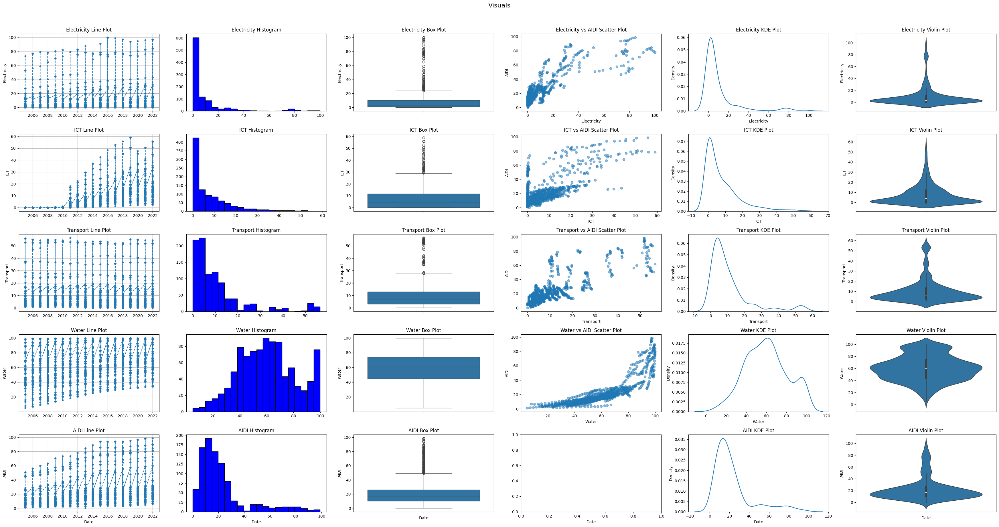

In [ ]:
# Columns to plot
columns = ['Electricity', 'ICT', 'Transport', 'Water', 'AIDI']

# Create subplots for different types of graphs
fig, axes = plt.subplots(len(columns), 6, figsize=(35, 18))
fig.suptitle('Visuals', fontsize=16, y=1.02)

for i, col in enumerate(columns):
    # Line Plot
    axes[i, 0].plot(data_ts.index, data_ts[col], '--', marker='*')
    axes[i, 0].set_title(f'{col} Line Plot')
    axes[i, 0].set_ylabel(col)
    axes[i, 0].grid(True)

    # Histogram
    axes[i, 1].hist(data_ts[col].dropna(), bins=20, color='blue', edgecolor='black')
    axes[i, 1].set_title(f'{col} Histogram')

    # Box Plot
    sns.boxplot(y=data_ts[col].dropna(), ax=axes[i, 2])
    axes[i, 2].set_title(f'{col} Box Plot')

    # Scatter Plot against AIDI (if different from AIDI)
    if col != 'AIDI':
        axes[i, 3].scatter(data_ts[col], data_ts['AIDI'], alpha=0.5)
        axes[i, 3].set_title(f'{col} vs AIDI Scatter Plot')
        axes[i, 3].set_xlabel(col)
        axes[i, 3].set_ylabel('AIDI')

    # KDE Plot
    sns.kdeplot(data_ts[col].dropna(), ax=axes[i, 4])
    axes[i, 4].set_title(f'{col} KDE Plot')

    # Violin Plot
    sns.violinplot(y=data_ts[col].dropna(), ax=axes[i, 5])
    axes[i, 5].set_title(f'{col} Violin Plot')


# Set x-label for the last row of plots
for ax in axes[-1, :]:
    ax.set_xlabel('Date')

plt.tight_layout()
plt.show()


## XXX


In [ ]:
# Convert 'Month' column to datetime
africa_df['Year'] = pd.to_datetime(africa_df['Year'], format='%Y')


# Set 'Month' column as the index
africa_df.set_index('Year', inplace=True)


In [ ]:
africa_df.head()

,aidi,tci,eci,ici,wssci
Year,,,,,
2005-01-01,15.37,10.93,7.59,0.00,50.89
2006-01-01,15.84,11.14,7.54,0.01,51.94
2007-01-01,16.40,11.10,7.96,0.01,53.01
2008-01-01,17.18,11.20,8.30,0.04,54.14
2009-01-01,18.16,11.07,8.66,0.08,55.27


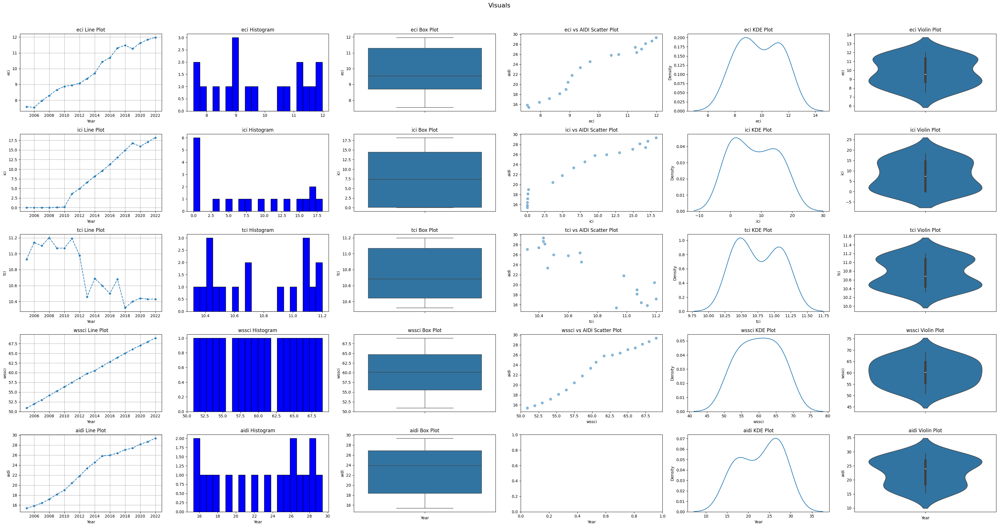

In [ ]:
# Columns to plot
columns = ['eci', 'ici', 'tci', 'wssci', 'aidi']

# Create subplots for different types of graphs
fig, axes = plt.subplots(len(columns), 6, figsize=(35, 18))
fig.suptitle('Visuals', fontsize=16, y=1.02)

for i, col in enumerate(columns):
    # Line Plot
    axes[i, 0].plot(africa_df.index, africa_df[col], '--', marker='*')
    axes[i, 0].set_title(f'{col} Line Plot')
    axes[i, 0].set_ylabel(col)
    axes[i, 0].set_xlabel('Year')
    axes[i, 0].grid(True)

    # Histogram
    axes[i, 1].hist(africa_df[col].dropna(), bins=20, color='blue', edgecolor='black')
    axes[i, 1].set_title(f'{col} Histogram')

    # Box Plot
    sns.boxplot(y=africa_df[col].dropna(), ax=axes[i, 2])
    axes[i, 2].set_title(f'{col} Box Plot')

    # Scatter Plot against AIDI (if different from AIDI)
    if col != 'aidi':
        axes[i, 3].scatter(africa_df[col], africa_df['aidi'], alpha=0.5)
        axes[i, 3].set_title(f'{col} vs AIDI Scatter Plot')
        axes[i, 3].set_xlabel(col)
        axes[i, 3].set_ylabel('aidi')

    # KDE Plot
    sns.kdeplot(africa_df[col].dropna(), ax=axes[i, 4])
    axes[i, 4].set_title(f'{col} KDE Plot')

    # Violin Plot
    sns.violinplot(y=africa_df[col].dropna(), ax=axes[i, 5])
    axes[i, 5].set_title(f'{col} Violin Plot')

# Set x-label for the last row of plots
for ax in axes[-1, :]:
    ax.set_xlabel('Year')

plt.tight_layout()
plt.show()


# Correlation Plot

1

In [ ]:
import pandas as pd
from scipy.stats import pearsonr, spearmanr, kendalltau

def correlation_tests(df):


    # Get list of numeric column names
    numeric_cols = africa_df.select_dtypes(include=['float64', 'int64']).columns

    # Iterate over all combinations of numeric columns
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):
            col1 = numeric_cols[i]
            col2 = numeric_cols[j]

            # Calculate Pearson correlation coefficient and p-value
            pearson_corr, pearson_pvalue = pearsonr(df[col1], df[col2])

            # Print results for the pair of columns
            print(f"Correlation between {col1} and {col2}:")
            print(f"Pearson correlation coefficient: {pearson_corr:.3f} (p-value: {pearson_pvalue:.3f})")
            print()

# Example usage:
# Assuming 'df' is your DataFrame containing the columns mentioned in your Index
correlation_tests(africa_df)


Correlation between aidi and tci:
Pearson correlation coefficient: -0.895 (p-value: 0.000)

Correlation between aidi and eci:
Pearson correlation coefficient: 0.979 (p-value: 0.000)

Correlation between aidi and ici:
Pearson correlation coefficient: 0.971 (p-value: 0.000)

Correlation between aidi and wssci:
Pearson correlation coefficient: 0.988 (p-value: 0.000)

Correlation between tci and eci:
Pearson correlation coefficient: -0.868 (p-value: 0.000)

Correlation between tci and ici:
Pearson correlation coefficient: -0.904 (p-value: 0.000)

Correlation between tci and wssci:
Pearson correlation coefficient: -0.868 (p-value: 0.000)

Correlation between eci and ici:
Pearson correlation coefficient: 0.974 (p-value: 0.000)

Correlation between eci and wssci:
Pearson correlation coefficient: 0.989 (p-value: 0.000)

Correlation between ici and wssci:
Pearson correlation coefficient: 0.977 (p-value: 0.000)



1

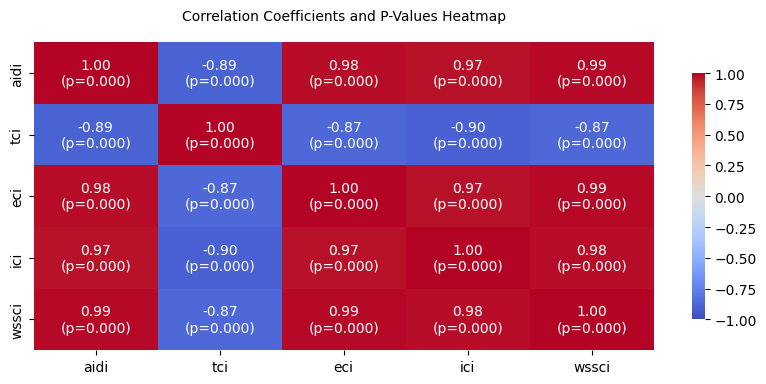

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr


# Compute correlation matrix
corr = africa_df.corr()

# Compute p-values matrix
p_values = africa_df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(len(africa_df.columns))

# Create a combined DataFrame for better visualization
corr_pvalues = pd.DataFrame(index=corr.index, columns=corr.columns, data=0)

for row in corr.index:
    for col in corr.columns:
        corr_pvalues.loc[row, col] = f"{corr.loc[row, col]:.2f}\n(p={p_values.loc[row, col]:.3f})"

# Plot heatmap for combined correlation coefficients and p-values
plt.figure(figsize=(10, 4))
heatmap = sns.heatmap(corr, annot=corr_pvalues, fmt='', cmap='coolwarm', vmin=-1, vmax=1, cbar_kws={"shrink": .8})
heatmap.set_title('Correlation Coefficients and P-Values Heatmap', fontdict={'fontsize':10}, pad=16)
plt.show()


# Network Graph

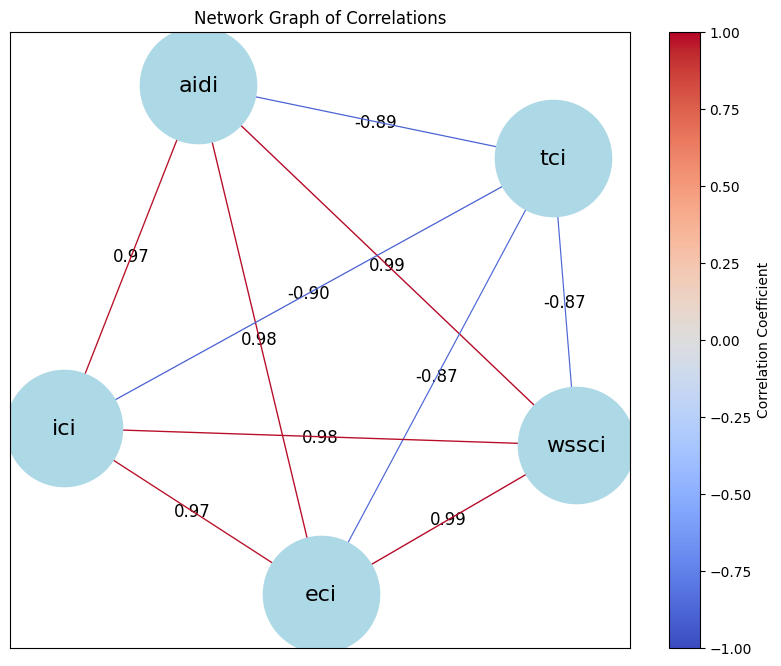

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


# Compute correlation matrix
corr = africa_df.corr()

# Create a network graph
G = nx.Graph()

# Add nodes (columns of the DataFrame)
for col in africa_df.columns:
    G.add_node(col)

# Add edges with correlation coefficients as weights
for i in range(len(corr.columns)):
    for j in range(i + 1, len(corr.columns)):
        G.add_edge(corr.columns[i], corr.columns[j], weight=corr.iloc[i, j])

# Draw the network graph
# The layout determines the positions of the nodes
pos = nx.spring_layout(G, k=5, seed=64)  # Increased k for more spread out layout

# Extract edges and their weights
edges = G.edges(data=True)
weights = [d['weight'] for (u, v, d) in edges]

# Set up the figure size
plt.figure(figsize=(10, 8))  # Adjust the figure size here

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=7000)

# Draw the labels for nodes
nx.draw_networkx_labels(G, pos, font_size=16, font_color='black')

# Draw edge labels (correlation coefficients)
edge_labels = {(u, v): f"{d['weight']:.2f}" for (u, v, d) in edges}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='black', font_size=12, label_pos=0.5, rotate=False)


# Draw the edges with colors and widths based on the correlation coefficients
edges = nx.draw_networkx_edges(G, pos, edge_color=weights, edge_cmap=plt.cm.coolwarm, edge_vmin=-1, edge_vmax=1, width=[1*abs(w) for w in weights])

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=-1, vmax=1))
sm.set_array([])
plt.colorbar(sm, label='Correlation Coefficient')

# Add a title and display the plot
plt.title('Network Graph of Correlations')
plt.show()


# Decomposition

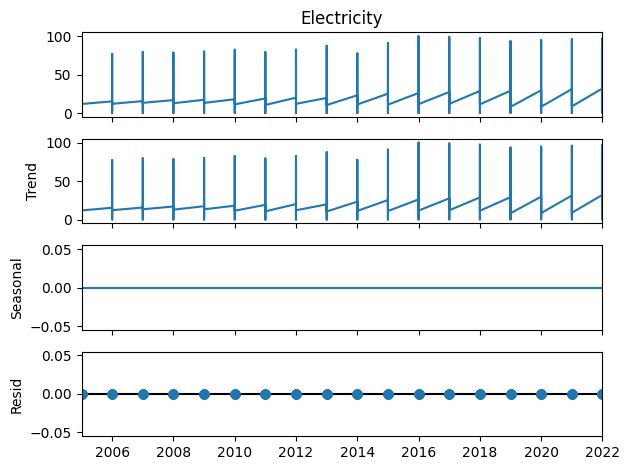

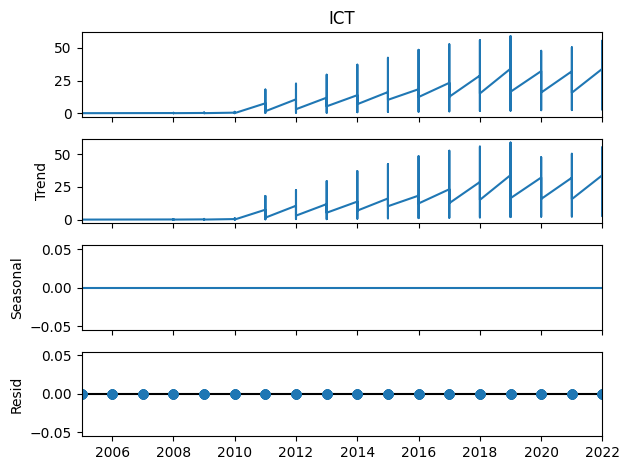

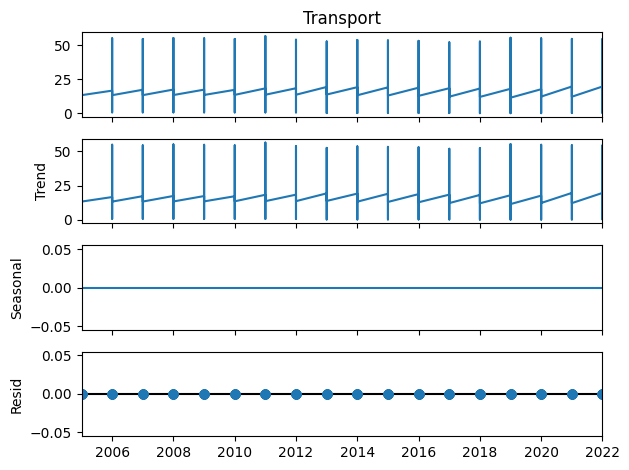

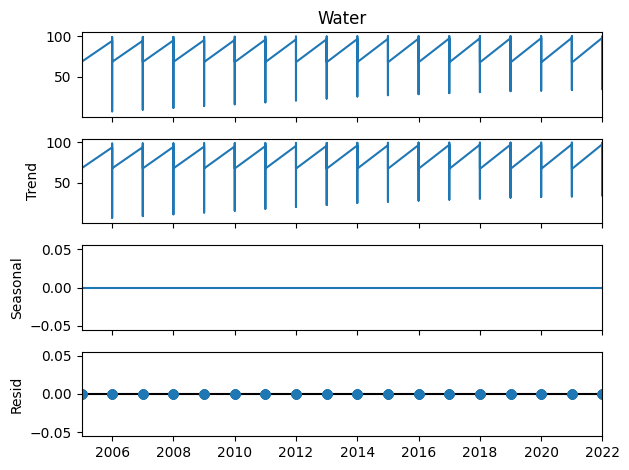

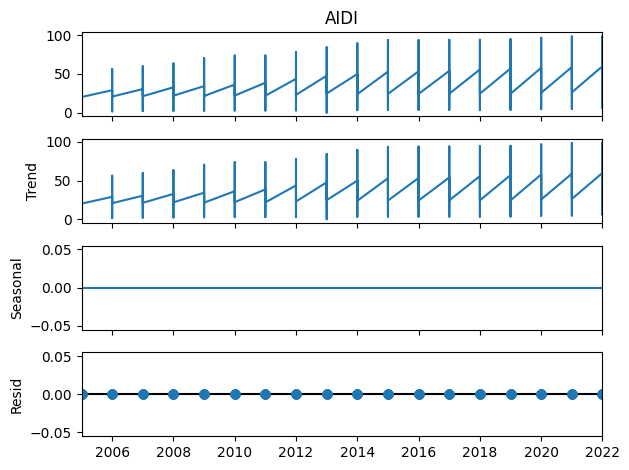

In [ ]:
# Columns to decompose
columns = ['Electricity', 'ICT', 'Transport', 'Water', 'AIDI']

# Create decomposition plots for each column
for col in columns:
    # Drop NaN values for decomposition
    data_col = data_ts[col].dropna()

    # Perform seasonal decomposition
    result = seasonal_decompose(data_col, model='additive', period=1)  # Adjust period if needed

    # Plot the decomposition
    result.plot()
    #plt.suptitle(f'Decomposition of {col}', fontsize=16)
    plt.show()


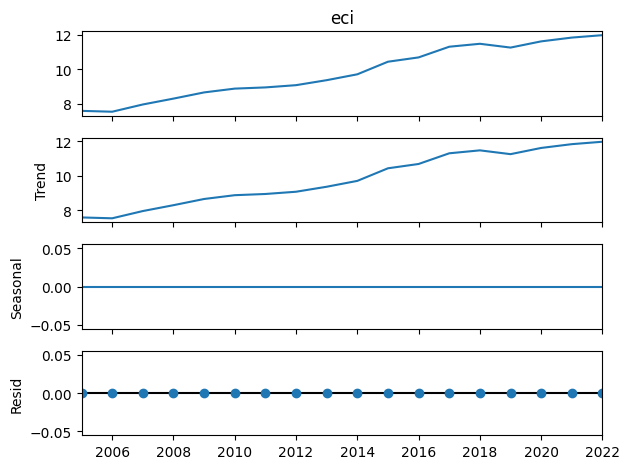

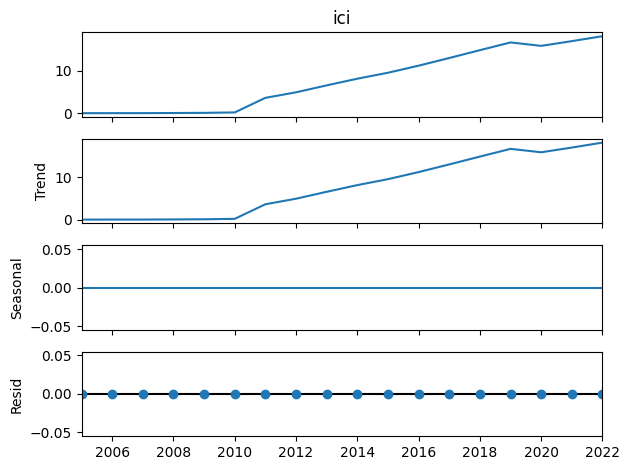

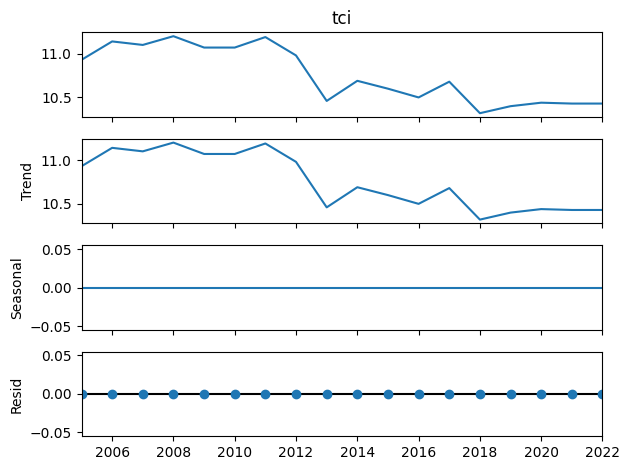

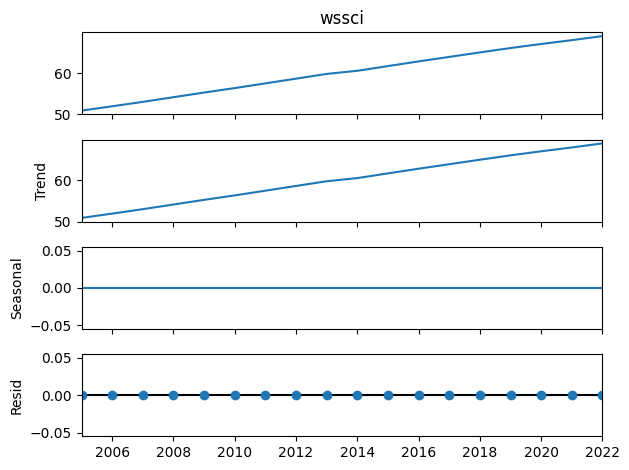

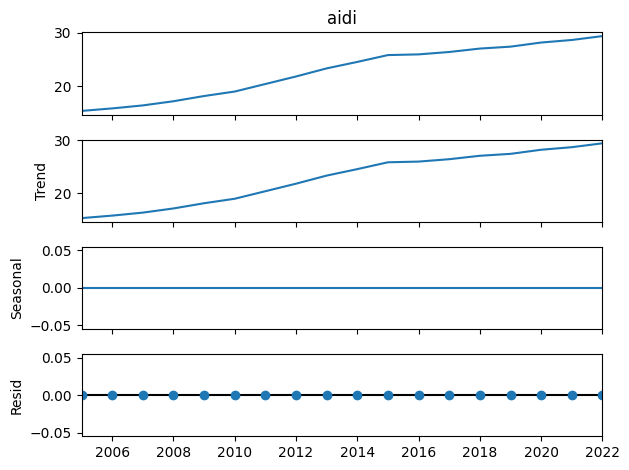

In [ ]:
# Columns to decompose
columns = ['eci', 'ici', 'tci', 'wssci', 'aidi']

# Create decomposition plots for each column
for col in columns:
    # Drop NaN values for decomposition
    data_col = africa_df[col].dropna()

    # Perform seasonal decomposition
    result = seasonal_decompose(data_col, model='additive', period=1)  # Adjust period if needed

    # Plot the decomposition
    result.plot()
    #plt.suptitle(f'Decomposition of {col}', fontsize=16)
    plt.show()


# Stationarity

## ADF Test

### 4 data_ts

In [ ]:
# List of columns to perform ADF test on
columns = ['Electricity', 'ICT', 'Transport', 'Water', 'AIDI']

for col in columns:
    # Drop NaN values for the specific column
    data_ts_sliced = data_ts[col].dropna()

    # Perform the ADF test
    adf_result = adfuller(data_ts_sliced)

    # Print detailed results
    print(f'\nResults of ADF test for {col}:')
    print(f'ADF Statistic: {adf_result[0]}')
    print(f'p-value: {adf_result[1]}')
    print(f'No. of lags used: {adf_result[2]}')
    print(f'No. of observations used: {adf_result[3]}')
    print('Critical Values:')
    for k, v in adf_result[4].items():
        print(f'  {k}: {v}')

    # Interpretation
    if adf_result[1] > 0.05:
        print(f"The time series for {col} is non-stationary")
    else:
        print(f"The time series for {col} is stationary")


Results of ADF test for Electricity:
ADF Statistic: -8.260147855808105
p-value: 5.109315549550002e-13
No. of lags used: 22
No. of observations used: 941
Critical Values:
  1%: -3.4373183615045266
  5%: -2.864616349295443
  10%: -2.568408028822753
The time series for Electricity is stationary

Results of ADF test for ICT:
ADF Statistic: -1.5300995302927585
p-value: 0.5185724872768745
No. of lags used: 22
No. of observations used: 941
Critical Values:
  1%: -3.4373183615045266
  5%: -2.864616349295443
  10%: -2.568408028822753
The time series for ICT is non-stationary

Results of ADF test for Transport:
ADF Statistic: -10.489639534860531
p-value: 1.1559622695853359e-18
No. of lags used: 22
No. of observations used: 941
Critical Values:
  1%: -3.4373183615045266
  5%: -2.864616349295443
  10%: -2.568408028822753
The time series for Transport is stationary

Results of ADF test for Water:
ADF Statistic: -1.2901497188861166
p-value: 0.6336666937900175
No. of lags used: 21
No. of observation

### 4 africa_df

In [ ]:
# List of columns to perform ADF test on
columnsx = ['eci', 'ici', 'tci', 'wssci', 'aidi']

for col in columnsx:
    # Drop NaN values for the specific column
    data_ts_sliced = africa_df[col].dropna()

    # Perform the ADF test
    adf_result = adfuller(data_ts_sliced)

    # Print detailed results
    print(f'\nResults of ADF test for {col}:')
    print(f'ADF Statistic: {adf_result[0]}')
    print(f'p-value: {adf_result[1]}')
    print(f'No. of lags used: {adf_result[2]}')
    print(f'No. of observations used: {adf_result[3]}')
    print('Critical Values:')
    for k, v in adf_result[4].items():
        print(f'  {k}: {v}')

    # Interpretation
    if adf_result[1] > 0.05:
        print(f"The time series for {col} is non-stationary")
    else:
        print(f"The time series for {col} is stationary")


Results of ADF test for eci:
ADF Statistic: 1.1670150033156972
p-value: 0.9957498737980339
No. of lags used: 5
No. of observations used: 12
Critical Values:
  1%: -4.137829282407408
  5%: -3.1549724074074077
  10%: -2.7144769444444443
The time series for eci is non-stationary

Results of ADF test for ici:
ADF Statistic: 0.5867331365281451
p-value: 0.9872840177153208
No. of lags used: 0
No. of observations used: 17
Critical Values:
  1%: -3.889265672705068
  5%: -3.0543579727254224
  10%: -2.66698384083045
The time series for ici is non-stationary

Results of ADF test for tci:
ADF Statistic: -15.486498076674042
p-value: 2.5168189307319446e-28
No. of lags used: 7
No. of observations used: 10
Critical Values:
  1%: -4.331573
  5%: -3.23295
  10%: -2.7487
The time series for tci is stationary

Results of ADF test for wssci:
ADF Statistic: -1.5503989860968377
p-value: 0.5084488912704189
No. of lags used: 7
No. of observations used: 10
Critical Values:
  1%: -4.331573
  5%: -3.23295
  10%: 

##Heuristic Approach (Summary Statistics)

### 4 data_ts

Mean & Variance check

In [ ]:
# Split the data into two halves for each column
midpoint = len(data_ts) // 2

for col in columns:
    first_half = data_ts[col].iloc[:midpoint]
    second_half = data_ts[col].iloc[midpoint:]

    # Calculate summary statistics
    mean_first_half = first_half.mean()
    mean_second_half = second_half.mean()
    var_first_half = first_half.var()
    var_second_half = second_half.var()

    # Print summary statistics for each column
    print(f'Summary statistics for column: {col}')
    print(f'First half mean: {mean_first_half}, variance: {var_first_half}')
    print(f'Second half mean: {mean_second_half}, variance: {var_second_half}')

    # Check stationarity based on variance difference
    # Using a threshold of 0.01 - 0.05 for the difference in variances is a heuristic approach
    if abs(var_first_half - var_second_half) > 0.05:
        print(f"The time series for {col} is non-stationary\n")
    else:
        print(f"The time series for {col} is stationary\n")


Summary statistics for column: Electricity
First half mean: 8.481484622778929, variance: 245.74724729870923
Second half mean: 11.1479703293854, variance: 384.1948216045853
The time series for Electricity is non-stationary

Summary statistics for column: ICT
First half mean: 1.7291148217771322, variance: 16.125218576274772
Second half mean: 13.876580950125648, variance: 119.92718990714927
The time series for ICT is non-stationary

Summary statistics for column: Transport
First half mean: 11.013346115718532, variance: 156.03917426321476
Second half mean: 10.501445024139153, variance: 139.97400232415043
The time series for Transport is non-stationary

Summary statistics for column: Water
First half mean: 55.277540588678846, variance: 478.1134230905141
Second half mean: 64.8792361929236, variance: 354.8077497696587
The time series for Water is non-stationary

Summary statistics for column: AIDI
First half mean: 18.622781849443385, variance: 253.48415797266867
Second half mean: 27.048961800

### 4 africa_df

In [ ]:
# Split the data into two halves for each column
midpoint = len(africa_df) // 2

for col in columnsx:
    first_half = africa_df[col].iloc[:midpoint]
    second_half = africa_df[col].iloc[midpoint:]

    # Calculate summary statistics
    mean_first_half = first_half.mean()
    mean_second_half = second_half.mean()
    var_first_half = first_half.var()
    var_second_half = second_half.var()

    # Print summary statistics for each column
    print(f'Summary statistics for column: {col}')
    print(f'First half mean: {mean_first_half}, variance: {var_first_half}')
    print(f'Second half mean: {mean_second_half}, variance: {var_second_half}')

    # Check stationarity based on variance difference
    # Using a threshold of 0.01 - 0.05 for the difference in variances is a heuristic approach
    if abs(var_first_half - var_second_half) > 0.05:
        print(f"The time series for {col} is non-stationary\n")
    else:
        print(f"The time series for {col} is stationary\n")


Summary statistics for column: eci
First half mean: 8.481111111111112, variance: 0.44298611111111097
Second half mean: 11.147777777777778, variance: 0.5402194444444443
The time series for eci is non-stationary

Summary statistics for column: ici
First half mean: 1.718888888888889, variance: 6.790786111111111
Second half mean: 13.875555555555556, variance: 12.657977777777774
The time series for ici is non-stationary

Summary statistics for column: tci
First half mean: 11.015555555555558, variance: 0.051277777777777624
Second half mean: 10.49888888888889, variance: 0.01678611111111106
The time series for tci is stationary

Summary statistics for column: wssci
First half mean: 55.27777777777778, variance: 9.297719444444452
Second half mean: 64.8788888888889, variance: 8.29696111111111
The time series for wssci is non-stationary

Summary statistics for column: aidi
First half mean: 18.613333333333333, variance: 7.671375000000001
Second half mean: 27.04888888888889, variance: 2.351286111111

# Prophet Modelling

## Initiate Model

## Model Training

## Prediction

Forecasting for eci...


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/wkr714y0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/g7vvw4tz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24754', 'data', 'file=/tmp/tmpvp7zwt65/wkr714y0.json', 'init=/tmp/tmpvp7zwt65/g7vvw4tz.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_modelmx0x6c0w/prophet_model-20240720222749.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:27:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:27:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:

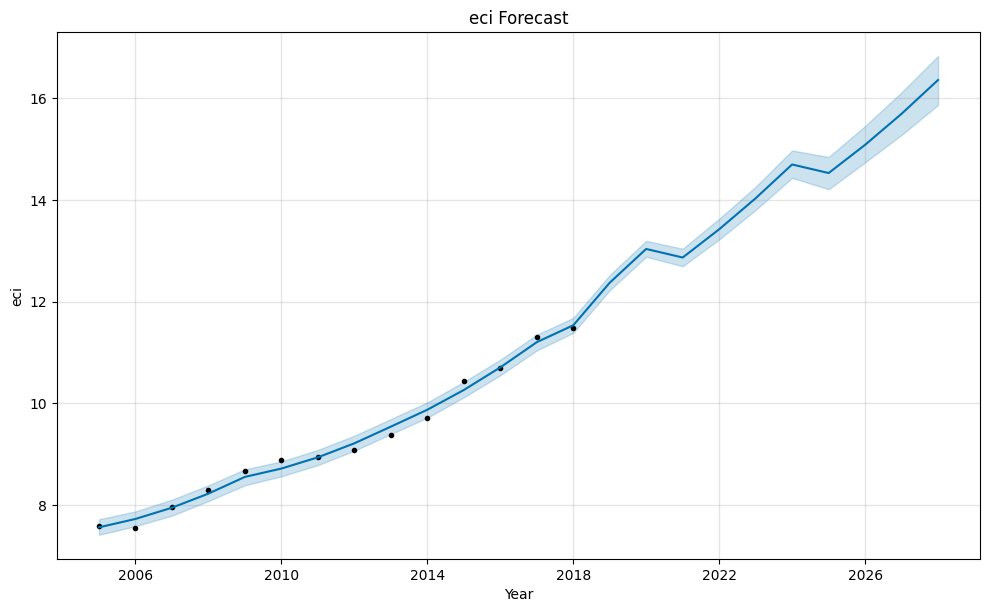

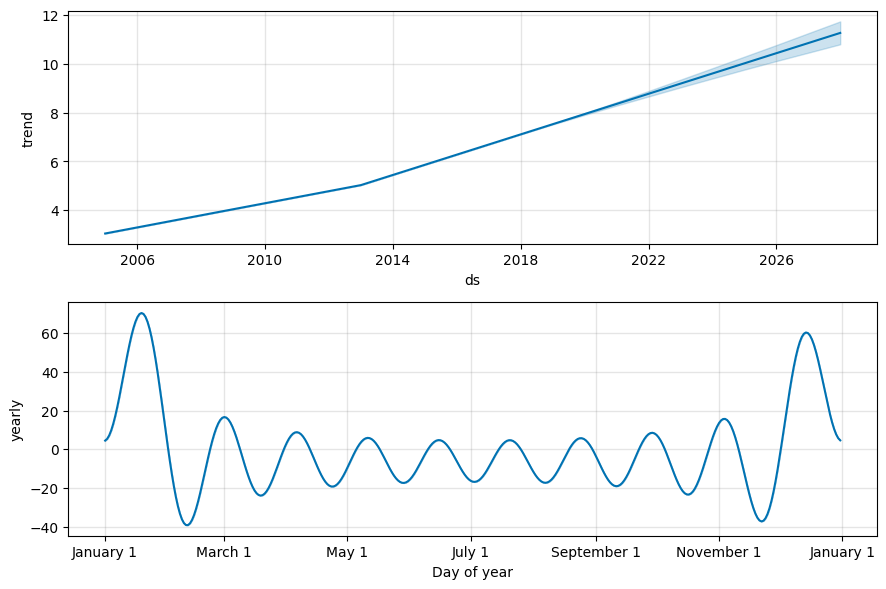

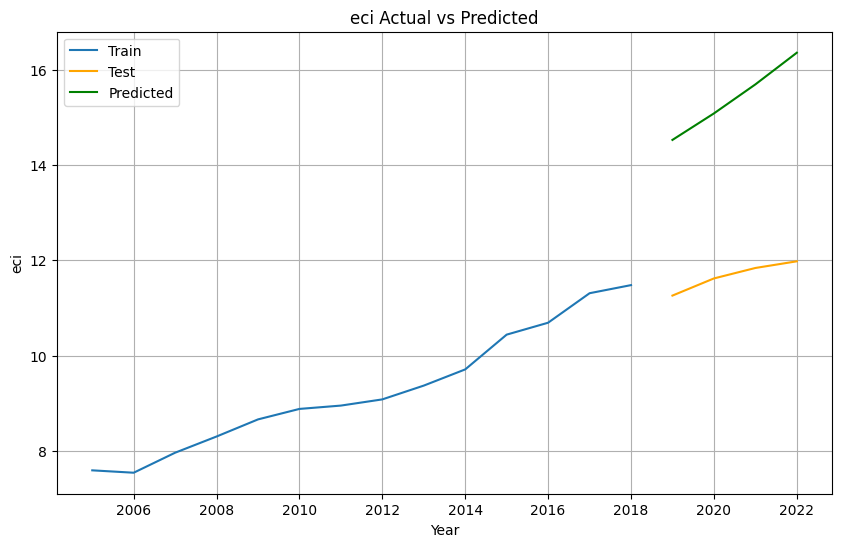

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/uv91z5r5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/hxug7ils.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51545', 'data', 'file=/tmp/tmpvp7zwt65/uv91z5r5.json', 'init=/tmp/tmpvp7zwt65/hxug7ils.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_modelyerx3vib/prophet_model-20240720222751.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:27:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:27:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:

Forecasting for ici...


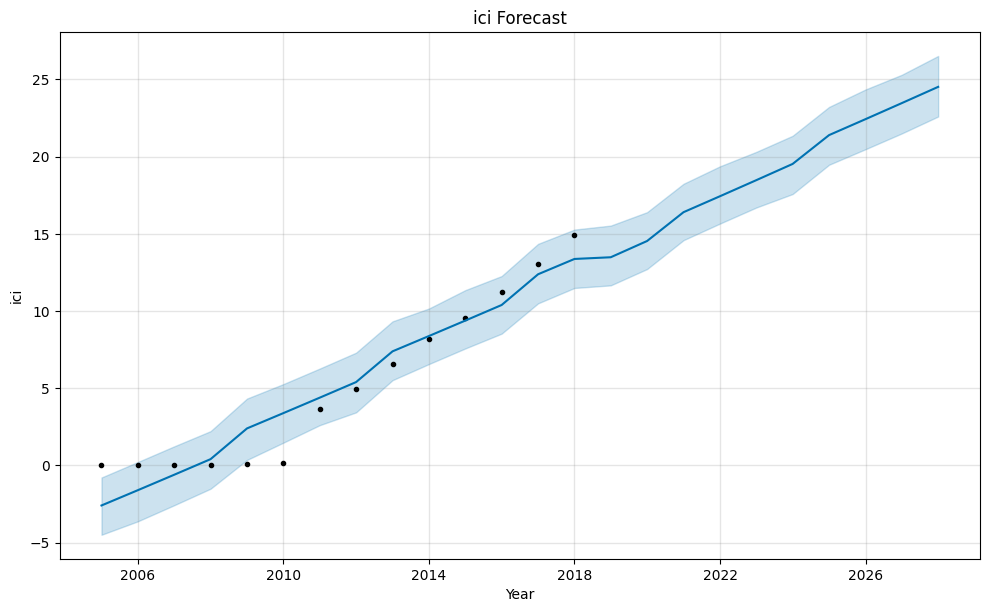

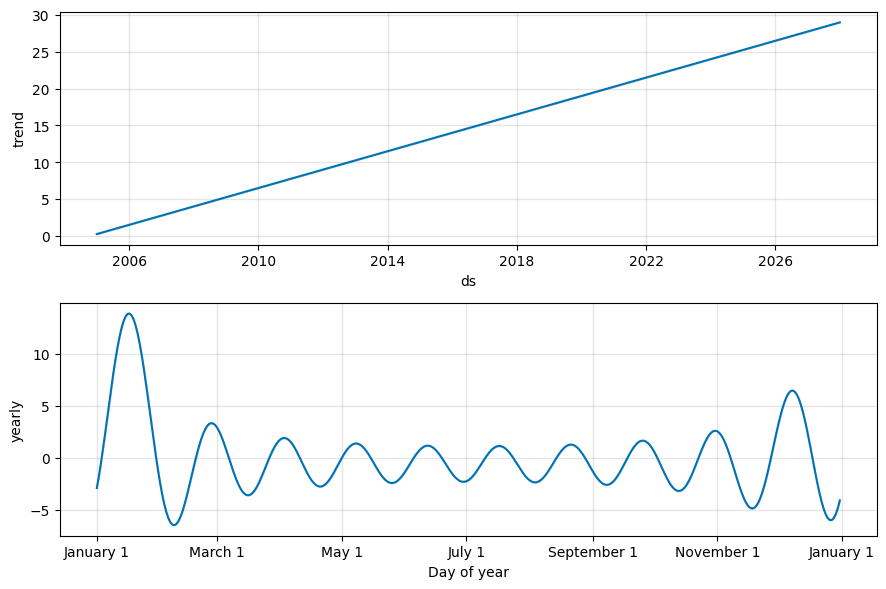

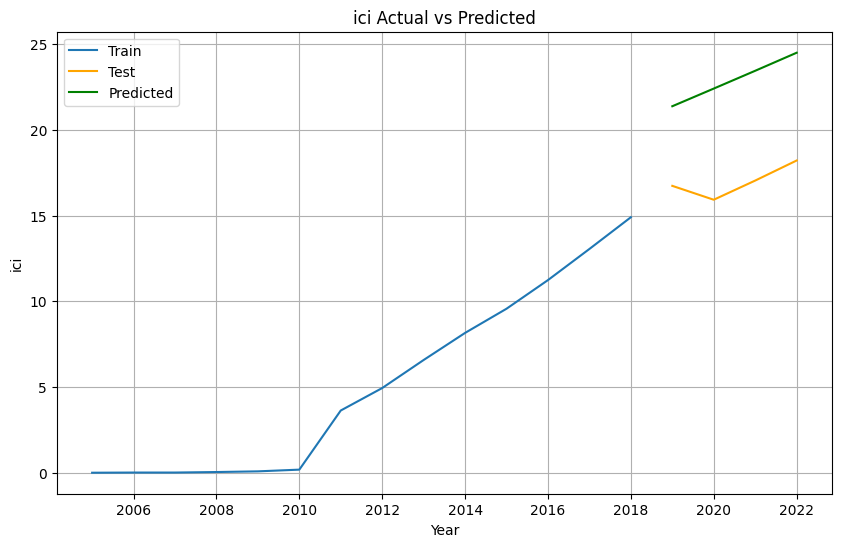

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/2_pz90bp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/7msjgr0a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75121', 'data', 'file=/tmp/tmpvp7zwt65/2_pz90bp.json', 'init=/tmp/tmpvp7zwt65/7msjgr0a.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_model9fy6x6nh/prophet_model-20240720222753.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:27:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for tci...


22:27:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


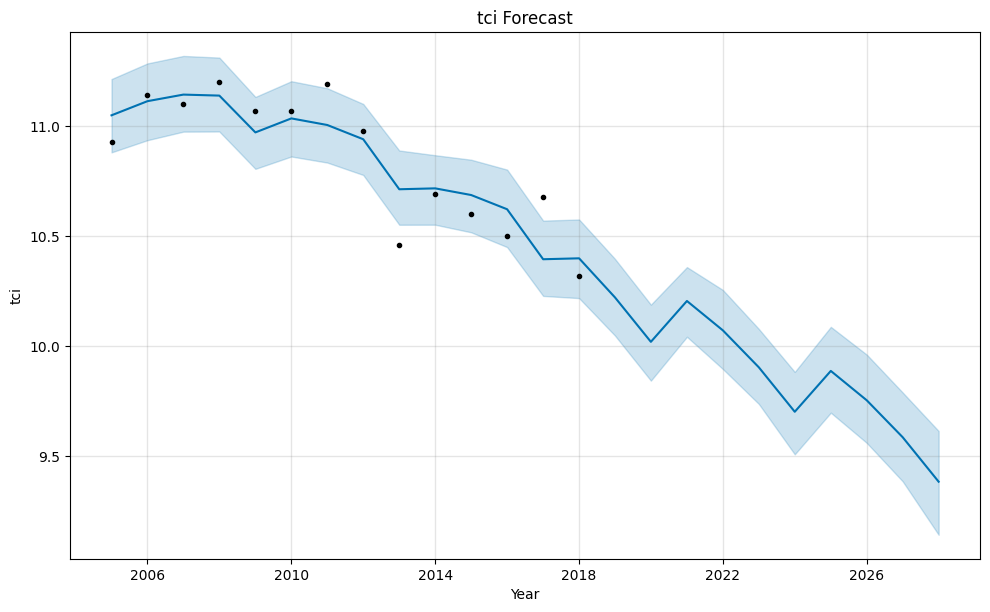

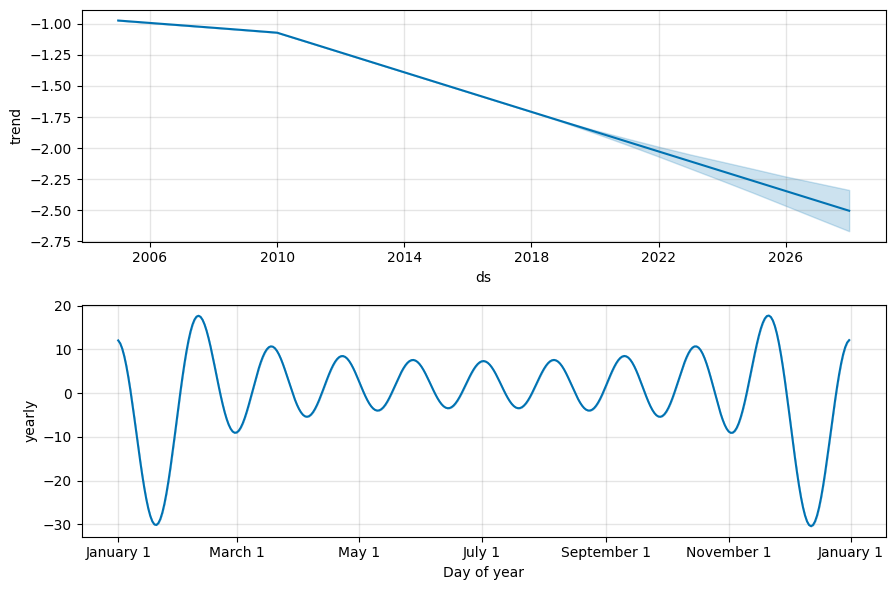

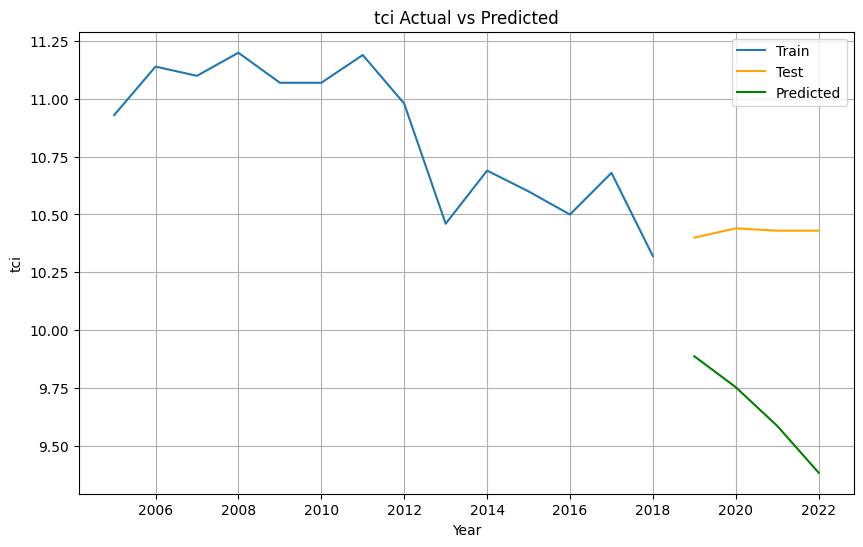

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/qo8zo6n8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/q6wx3qgg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99438', 'data', 'file=/tmp/tmpvp7zwt65/qo8zo6n8.json', 'init=/tmp/tmpvp7zwt65/q6wx3qgg.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_modell2x06mcn/prophet_model-20240720222755.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:27:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for wssci...


22:28:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


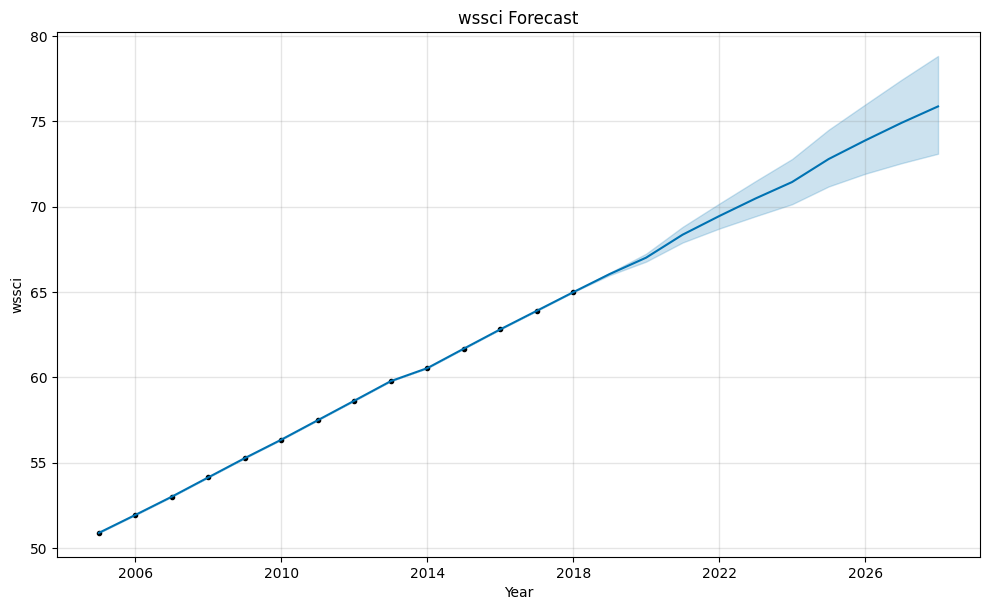

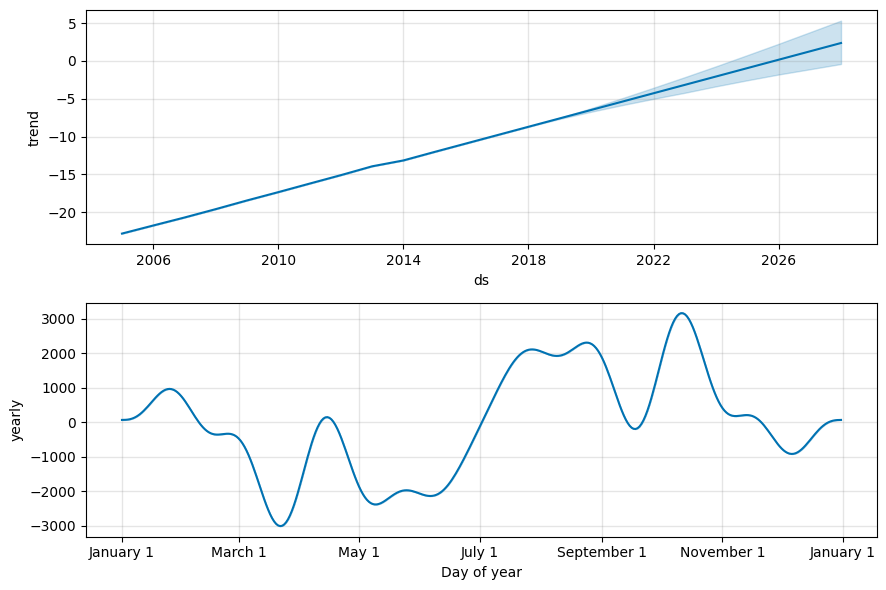

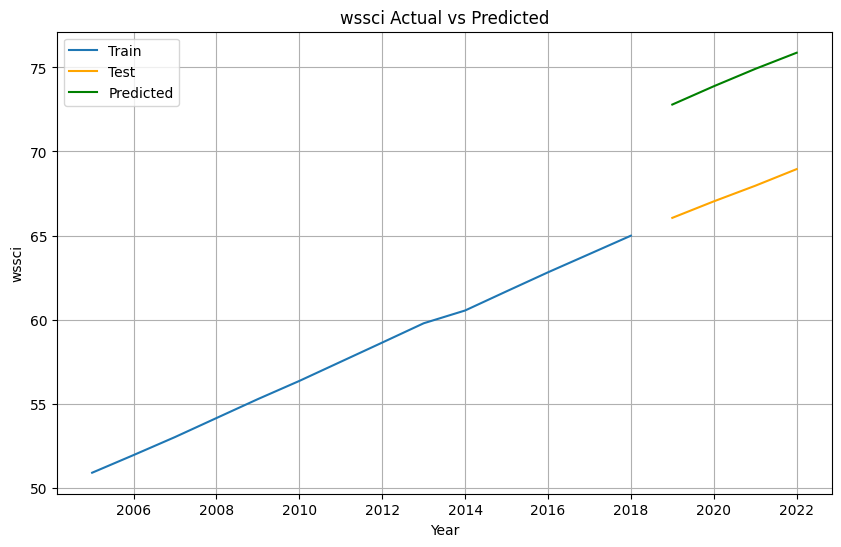

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/758r5c0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/elaibndy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10454', 'data', 'file=/tmp/tmpvp7zwt65/758r5c0k.json', 'init=/tmp/tmpvp7zwt65/elaibndy.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_model8qxr1a2r/prophet_model-20240720222807.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:28:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for aidi...


22:28:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


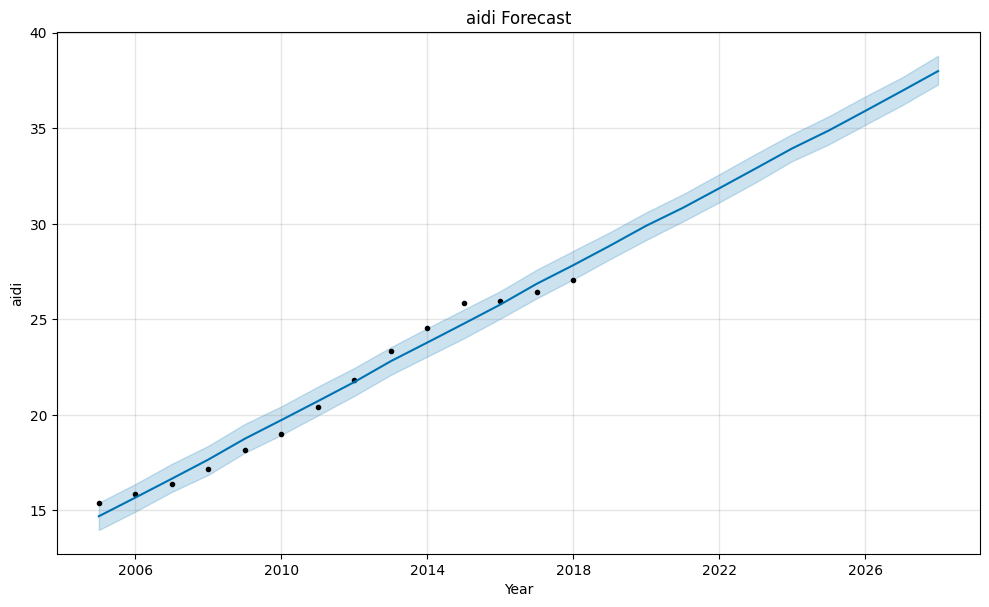

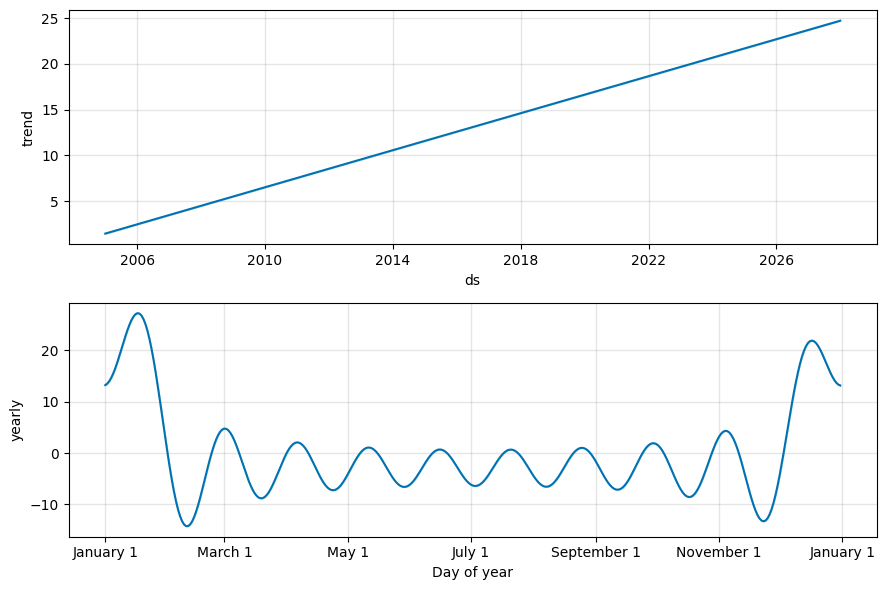

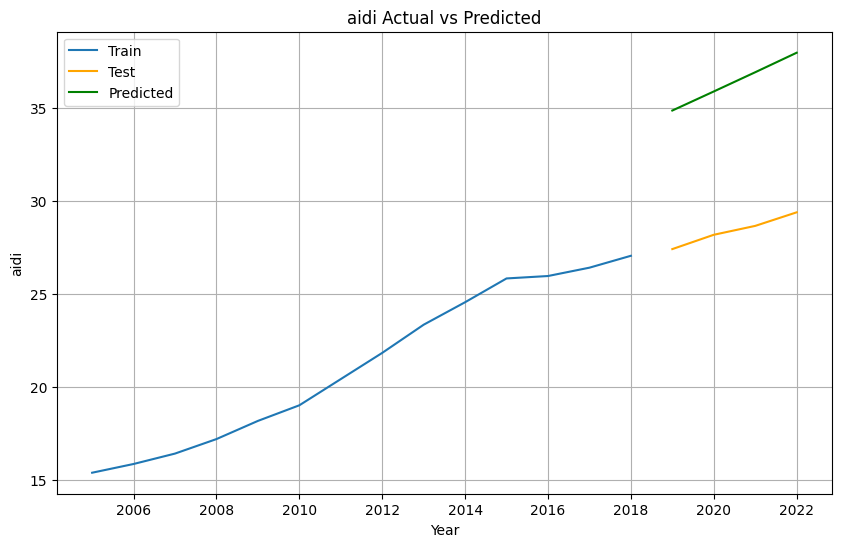

INFO:prophet:Making 21 forecasts with cutoffs between 2007-02-23 00:00:00 and 2017-01-01 00:00:00


  Column       MAE       MSE      RMSE       MAPE          R2
0    eci  1.248825  1.592982  1.262134  10.689272  -20.563206
1    ici  1.528142  3.417508  1.848650   9.121016   -4.058291
2    tci  0.296022  0.097214  0.311792   2.838453 -431.063348
3  wssci  0.228571  0.101543  0.318658   0.333808    0.912415
4   aidi  1.938302  3.915710  1.978815   6.791967   -6.545447


  0%|          | 0/21 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 1.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/yqnfdhir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/ufivz7sf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40439', 'data', 'file=/tmp/tmpvp7zwt65/yqnfdhir.json', 'init=/tmp/tmpvp7zwt65/ufivz7sf.json', 'output', 'file=/tmp/tmpvp7zwt65/prophet_model3xy1_3sp/prophet_model-20240720222809.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
22:28:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:28:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 1.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvp7zwt65/hgwo2qt7.json
DEBUG:cmdstanpy:input tempfile

    horizon        mse      rmse       mae      mape     mdape     smape  \
0  138 days  75.231488  8.673609  6.243528  0.344156  0.344156  0.258959   
1  143 days  75.261407  8.675333  6.297574  0.346380  0.346380  0.261216   
2  148 days   0.228831  0.478362  0.460464  0.023162  0.023162  0.023451   
3  153 days   0.335836  0.579513  0.579415  0.027488  0.027488  0.027533   
4  159 days   0.163128  0.403891  0.310792  0.014165  0.014165  0.013996   
5  164 days   0.014494  0.120391  0.107348  0.004428  0.004428  0.004416   
6  169 days   0.013116  0.114526  0.083969  0.003414  0.003414  0.003403   
7  174 days   0.748740  0.865298  0.614894  0.023687  0.023687  0.023144   
8  180 days   2.332734  1.527329  1.501798  0.057266  0.057266  0.055625   
9  312 days   1.608820  1.268393  1.001320  0.040180  0.040180  0.039124   
10 318 days  75.231488  8.673609  6.243528  0.344156  0.344156  0.258959   
11 323 days  75.261407  8.675333  6.297574  0.346380  0.346380  0.261216   
12 328 days 

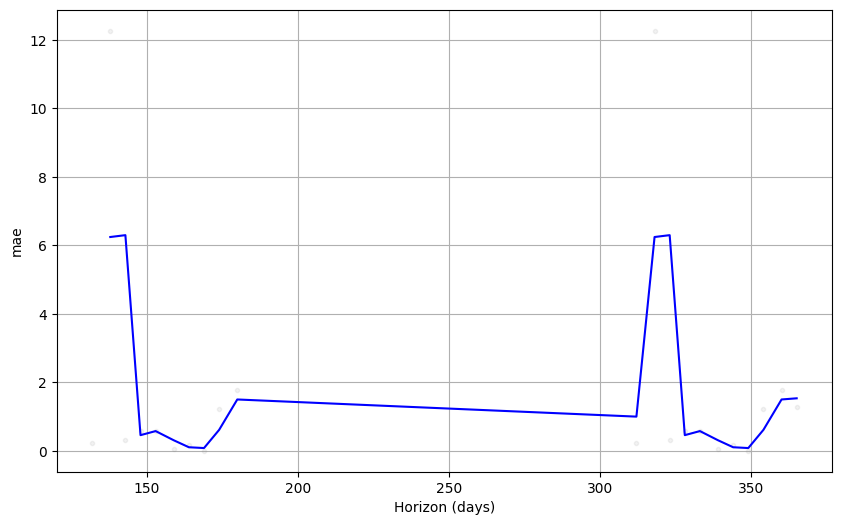

In [ ]:
# List of columns to forecast
columnsx = ['eci', 'ici', 'tci', 'wssci', 'aidi']

# Define the number of years to forecast
periods = 10

# Initialize an empty list to store evaluation metrics
metrics_data = []

# Iterate over each column
for col in columnsx:
    print(f'Forecasting for {col}...')

    # Prepare data for Prophet
    df_prophet = africa_df[[col]].reset_index()
    df_prophet.columns = ['ds', 'y']

    # Split the data into training and test sets
    train_size = int(len(df_prophet) * 0.8)
    train_df = df_prophet.iloc[:train_size]
    test_df = df_prophet.iloc[train_size:]

    # Initialize and fit Prophet model
    model = Prophet()
    model.fit(train_df)

    # Make future dataframe
    future = model.make_future_dataframe(periods=periods, freq='Y')

    # Forecast
    forecast = model.predict(future)

    # Plot forecast
    fig = model.plot(forecast)
    plt.title(f'{col} Forecast')
    plt.xlabel('Year')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

    # Plot components
    fig2 = model.plot_components(forecast)
    plt.show()

    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test', color='orange')
    plt.plot(test_df['ds'], forecast[-len(test_df):]['yhat'], label='Predicted', color='green')
    plt.title(f'{col} Actual vs Predicted')
    plt.xlabel('Year')
    plt.ylabel(col)
    plt.legend()
    plt.grid(True)
    plt.show()

    # Evaluate the model
    test_forecast = forecast.iloc[train_size:train_size + len(test_df)]
    mae = mean_absolute_error(test_df['y'], test_forecast['yhat'])
    mse = mean_squared_error(test_df['y'], test_forecast['yhat'])
    rmse = mean_squared_error(test_df['y'], test_forecast['yhat'], squared=False)
    mape = (abs((test_df['y'] - test_forecast['yhat']) / test_df['y'])).mean() * 100
    r2 = r2_score(test_df['y'], test_forecast['yhat'])

    # Store evaluation metrics
    metrics_data.append({'Column': col, 'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape, 'R2': r2})

# Create DataFrame from metrics data
metrics_df = pd.DataFrame(metrics_data)

# Print evaluation metrics
print(metrics_df)

# Cross-validation
cv_results = cross_validation(model, initial='730 days', period='180 days', horizon='365 days')
cv_metrics = performance_metrics(cv_results)
print(cv_metrics)

# Plot cross-validation metrics
fig3 = plot_cross_validation_metric(cv_results, metric='mae')
plt.show()


##

# Regression Approach

# Data Head

## aidi-Head

In [ ]:
aidi.head()

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,28.55,28.96,30.43,32.73,34.31,36.29,38.57,43.69,47.78,49.91,52.99,53.39,54.04,55.79,57.08,57.87,58.91,60.00
1,Angola,7.96,8.17,8.54,9.41,10.41,11.50,12.58,13.75,14.99,16.39,16.83,16.46,17.48,19.04,18.88,20.07,20.20,20.65
2,Benin,8.77,8.82,8.68,8.92,9.53,10.32,11.31,12.29,13.72,14.68,15.59,15.78,16.02,16.23,16.07,16.53,16.75,17.40
3,Botswana,28.45,28.58,28.21,28.98,29.75,30.61,31.89,32.59,33.50,34.76,35.64,35.63,36.61,36.79,36.96,37.50,37.90,39.02
4,Burkina Faso,12.00,12.44,11.26,11.64,12.07,12.72,13.56,14.25,15.33,15.67,16.38,16.52,16.97,17.05,17.51,18.52,19.41,20.34


## tci-Head

In [ ]:
tci.head()

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,16.76,16.55,17.20,17.35,17.28,17.15,18.22,18.30,19.26,19.09,18.96,18.71,18.33,18.11,17.90,17.59,19.58,19.58
1,Angola,2.49,2.43,2.38,2.34,2.30,2.25,2.22,2.17,2.16,2.11,2.07,2.02,1.97,1.93,1.89,4.29,4.41,4.41
2,Benin,7.28,7.19,5.60,5.59,5.50,5.45,5.33,5.27,5.01,4.89,4.85,4.81,4.67,4.57,5.23,5.22,5.17,5.17
3,Botswana,25.79,26.40,24.15,25.20,25.07,24.91,25.20,25.01,26.34,27.03,26.60,26.18,25.36,24.99,24.62,25.73,25.28,25.28
4,Burkina Faso,13.08,13.13,13.04,12.71,12.54,12.43,12.13,12.03,11.29,11.11,11.07,11.03,11.18,11.14,11.08,11.02,10.95,10.95


## eci-Head

In [ ]:
eci.head()

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,14.54,15.37,15.70,17.01,17.41,18.10,19.17,20.13,19.80,23.29,25.37,26.24,27.60,28.83,29.15,29.80,31.34,32.15
1,Angola,1.64,1.78,1.94,2.22,2.39,2.51,2.97,3.04,3.84,3.84,3.93,5.10,5.82,5.79,5.94,5.89,5.85,5.81
2,Benin,0.29,0.30,0.33,0.44,0.61,0.75,0.39,0.20,0.22,0.22,0.22,0.23,0.34,0.48,0.49,0.46,0.44,0.43
3,Botswana,8.18,1.03,9.31,8.95,9.41,5.81,5.02,3.74,3.55,5.73,18.41,15.43,18.52,23.29,20.70,20.56,20.36,20.20
4,Burkina Faso,0.46,0.53,0.55,0.55,0.61,0.66,0.65,0.72,0.55,0.58,0.43,0.66,0.69,1.61,1.65,1.70,2.00,2.08


## ici-Head

In [ ]:
ici.head()

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,0.01,0.02,0.02,0.11,0.17,0.40,7.57,10.60,11.88,13.78,16.17,18.34,23.22,28.79,34.03,32.18,32.07,34.08
1,Angola,0.00,0.00,0.00,0.01,0.04,0.09,1.77,2.36,3.01,3.97,5.21,6.11,9.83,11.95,12.08,11.45,12.13,12.82
2,Benin,0.00,0.00,0.00,0.01,0.03,0.08,2.27,3.56,5.50,6.69,7.65,8.97,8.97,11.33,11.22,10.46,13.76,15.34
3,Botswana,0.01,0.01,0.01,0.06,0.10,0.24,5.35,6.96,9.20,12.72,15.96,20.54,24.59,25.80,28.37,24.00,28.52,31.30
4,Burkina Faso,0.00,0.00,0.00,0.01,0.02,0.05,1.18,1.62,2.74,3.84,5.18,6.24,7.31,8.75,10.36,11.08,12.27,13.93


## wssci-Head

In [ ]:
wssci.head()

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,93.62,93.92,94.22,94.59,94.89,95.19,95.52,95.82,96.07,96.34,96.59,96.85,97.10,97.31,97.32,97.37,97.79,98.00
1,Angola,46.01,47.34,48.58,49.88,50.92,51.87,52.76,53.75,54.66,55.53,56.34,57.19,58.01,58.83,59.59,60.30,61.04,61.43
2,Benin,41.26,42.21,43.16,44.12,45.05,45.69,46.43,47.09,47.61,48.43,49.12,49.79,50.36,50.99,51.62,52.18,52.78,53.29
3,Botswana,78.64,79.39,80.20,81.00,81.73,82.63,83.67,84.57,85.46,86.44,87.17,87.92,88.56,89.26,89.83,90.43,91.02,91.60
4,Burkina Faso,39.74,41.11,42.53,44.00,45.41,46.66,47.88,49.10,51.00,52.51,53.92,55.19,56.56,57.78,58.99,60.33,61.51,62.79


# SID-Analysis

## Shape

In [ ]:
# Get shapes of the datasets
aidi_shape = aidi.shape
tci_shape = tci.shape
eci_shape = eci.shape
ici_shape = ici.shape
wssci_shape = wssci.shape

In [ ]:
# Create a DataFrame with the shapes
data_shapes = {
    "Dataset": ["AIDI", "Transport Composite Index", "Electricity Composite Index", "ICT Composite Index", "WSS Composite Index"],
    "Rows": [aidi_shape[0], tci_shape[0], eci_shape[0], ici_shape[0], wssci_shape[0]],
    "Columns": [aidi_shape[1], tci_shape[1], eci_shape[1], ici_shape[1], wssci_shape[1]]
}

shapes_df = pd.DataFrame(data_shapes)

# Display the DataFrame
print(shapes_df)

                       Dataset  Rows  Columns
0                         AIDI    54       19
1    Transport Composite Index    54       19
2  Electricity Composite Index    54       19
3          ICT Composite Index    54       19
4          WSS Composite Index    54       19


## Info

In [ ]:
# Function to get summary information from .info()
def get_info_df(df, name):
    info = {
        "Dataset": [name],
        "Rows": [df.shape[0]],
        "Columns": [df.shape[1]],
        "Non-Null Count": [df.count().sum()],
        "Dtypes": [df.dtypes.value_counts().to_dict()]
    }
    return pd.DataFrame(info)

# Collecting info for each dataset
aidi_info = get_info_df(aidi, "AIDI")
tci_info = get_info_df(tci, "Transport Composite Index")
eci_info = get_info_df(eci, "Electricity Composite Index")
ici_info = get_info_df(ici, "ICT Composite Index")
wssci_info = get_info_df(wssci, "WSS Composite Index")

# Concatenating all info DataFrames
info_df = pd.concat([aidi_info, tci_info, eci_info, ici_info, wssci_info], ignore_index=True)

# Display the summary DataFrame
print(info_df)


                       Dataset  Rows  Columns  Non-Null Count  \
0                         AIDI    54       19            1018   
1    Transport Composite Index    54       19            1018   
2  Electricity Composite Index    54       19            1018   
3          ICT Composite Index    54       19            1018   
4          WSS Composite Index    54       19            1017   

                     Dtypes  
0  {float64: 18, object: 1}  
1  {float64: 18, object: 1}  
2  {float64: 18, object: 1}  
3  {float64: 18, object: 1}  
4  {float64: 18, object: 1}  


## De-Stats

In [ ]:
# Function to get summary statistics from .describe()
def get_describe_df(df, name):
    describe = df.describe().transpose()
    describe['Dataset'] = name
    return describe.reset_index().rename(columns={'index': 'Feature'})

# Collecting describe statistics for each dataset
aidi_describe = get_describe_df(aidi, "AIDI")
tci_describe = get_describe_df(tci, "Transport Composite Index")
eci_describe = get_describe_df(eci, "Electricity Composite Index")
ici_describe = get_describe_df(ici, "ICT Composite Index")
wssci_describe = get_describe_df(wssci, "WSS Composite Index")

# Concatenating all describe DataFrames
describe_df = pd.concat([aidi_describe, tci_describe, eci_describe, ici_describe, wssci_describe], ignore_index=True)

# Display the summary DataFrame
print(describe_df)


   Feature  count       mean        std    min      25%     50%      75%  \
0     2005   53.0  15.367547  12.651343   1.12   6.9300  12.160  19.4000   
1     2006   53.0  15.836792  13.188643   1.56   7.2000  12.500  19.2800   
2     2007   53.0  16.397358  13.645379   1.96   7.3500  12.860  19.8900   
3     2008   53.0  17.183019  14.358758   2.25   7.8300  13.320  20.3200   
4     2009   53.0  18.159434  15.347334   2.51   8.4100  13.780  20.9500   
..     ...    ...        ...        ...    ...      ...     ...      ...   
85    2018   54.0  64.994630  18.748381  30.75  51.4950  64.055  76.0375   
86    2019   54.0  66.053889  18.444443  31.94  52.7525  65.380  76.3675   
87    2020   54.0  67.027593  18.128273  32.65  54.1650  66.475  76.8825   
88    2021   54.0  67.961667  17.860330  33.32  55.6950  67.260  78.2350   
89    2022   54.0  68.948148  17.618936  34.08  57.2225  68.025  79.4500   

      max              Dataset  
0   50.86                 AIDI  
1   56.29            

In [ ]:
# Function to get summary statistics from .describe()
def get_describe_table(df, name):
    describe = df.describe().transpose()
    describe['Dataset'] = name
    return describe.reset_index().rename(columns={'index': 'Feature'})

# Collecting describe statistics for each dataset
aidi_describe = get_describe_table(aidi, "AIDI")
tci_describe = get_describe_table(tci, "Transport Composite Index")
eci_describe = get_describe_table(eci, "Electricity Composite Index")
ici_describe = get_describe_table(ici, "ICT Composite Index")
wssci_describe = get_describe_table(wssci, "WSS Composite Index")

# Concatenating all describe DataFrames
describe_df = pd.concat([aidi_describe, tci_describe, eci_describe, ici_describe, wssci_describe], ignore_index=True)

# Print the summary table
print(tabulate(describe_df, headers='keys', tablefmt='grid'))


+----+-----------+---------+-------------+-------------+-------+---------+--------+---------+--------+-----------------------------+
|    |   Feature |   count |        mean |         std |   min |     25% |    50% |     75% |    max | Dataset                     |
+====+===========+=========+=============+=============+=======+=========+========+=========+========+=============================+
|  0 |      2005 |      53 | 15.3675     | 12.6513     |  1.12 |  6.93   | 12.16  | 19.4    |  50.86 | AIDI                        |
+----+-----------+---------+-------------+-------------+-------+---------+--------+---------+--------+-----------------------------+
|  1 |      2006 |      53 | 15.8368     | 13.1886     |  1.56 |  7.2    | 12.5   | 19.28   |  56.29 | AIDI                        |
+----+-----------+---------+-------------+-------------+-------+---------+--------+---------+--------+-----------------------------+
|  2 |      2007 |      53 | 16.3974     | 13.6454     |  1.96 |  7.3

In [ ]:
# Function to get summary statistics from .describe()
def get_describe_table(df, name):
    describe = df.describe().transpose()
    describe['Dataset'] = name
    return describe.reset_index().rename(columns={'index': 'Feature'})

# Collecting describe statistics for each dataset
aidi_describe = get_describe_table(aidi, "AIDI")
tci_describe = get_describe_table(tci, "Transport Composite Index")
eci_describe = get_describe_table(eci, "Electricity Composite Index")
ici_describe = get_describe_table(ici, "ICT Composite Index")
wssci_describe = get_describe_table(wssci, "WSS Composite Index")

# Concatenating all describe DataFrames
describe_df = pd.concat([aidi_describe, tci_describe, eci_describe, ici_describe, wssci_describe], ignore_index=True)

# Transpose the DataFrame
describe_df = describe_df.set_index('Feature').T

# Print the summary table
print(tabulate(describe_df, headers='keys', tablefmt='grid'))


+---------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+---------------------------+-----------------------------+-----------------------------+-----------------------------+------------------

#Numerical Vs Categorical

In [ ]:
def display_variable_types(data):
    # Separate numerical and categorical variables
    numerical_vars = data.select_dtypes(include=['int64', 'float64']).columns
    categorical_vars = data.select_dtypes(include=['object']).columns

    # Display numerical and categorical variables
    print("Numerical Variables:")
    print(numerical_vars)
    print()

    print("Categorical Variables:")
    print(categorical_vars)


# Display variable types for each dataset
print("AIDI Dataset:")
display_variable_types(aidi)
print("\nTCI Dataset:")
display_variable_types(tci)
print("\nECI Dataset:")
display_variable_types(eci)
print("\nICI Dataset:")
display_variable_types(ici)
print("\nWSSCI Dataset:")
display_variable_types(wssci)


AIDI Dataset:
Numerical Variables:
Index(['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
      dtype='object')

Categorical Variables:
Index(['Country'], dtype='object')

TCI Dataset:
Numerical Variables:
Index(['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
      dtype='object')

Categorical Variables:
Index(['Country'], dtype='object')

ECI Dataset:
Numerical Variables:
Index(['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
      dtype='object')

Categorical Variables:
Index(['Country'], dtype='object')

ICI Dataset:
Numerical Variables:
Index(['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020'

# Missingness

AIDI Dataset:
Missing Values and Percentage:
         Missing Values  Percentage
Country               0        0.00
2005                  1        1.85
2006                  1        1.85
2007                  1        1.85
2008                  1        1.85
2009                  1        1.85
2010                  1        1.85
2011                  1        1.85
2012                  1        1.85
2013                  0        0.00
2014                  0        0.00
2015                  0        0.00
2016                  0        0.00
2017                  0        0.00
2018                  0        0.00
2019                  0        0.00
2020                  0        0.00
2021                  0        0.00
2022                  0        0.00


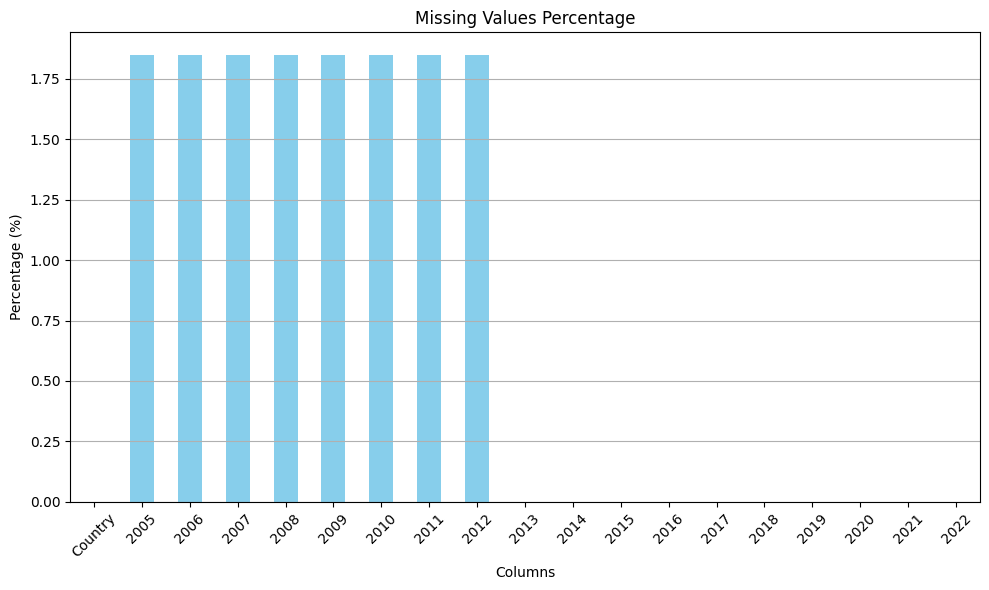


TCI Dataset:
Missing Values and Percentage:
         Missing Values  Percentage
Country               0        0.00
2005                  1        1.85
2006                  1        1.85
2007                  1        1.85
2008                  1        1.85
2009                  1        1.85
2010                  1        1.85
2011                  1        1.85
2012                  1        1.85
2013                  0        0.00
2014                  0        0.00
2015                  0        0.00
2016                  0        0.00
2017                  0        0.00
2018                  0        0.00
2019                  0        0.00
2020                  0        0.00
2021                  0        0.00
2022                  0        0.00


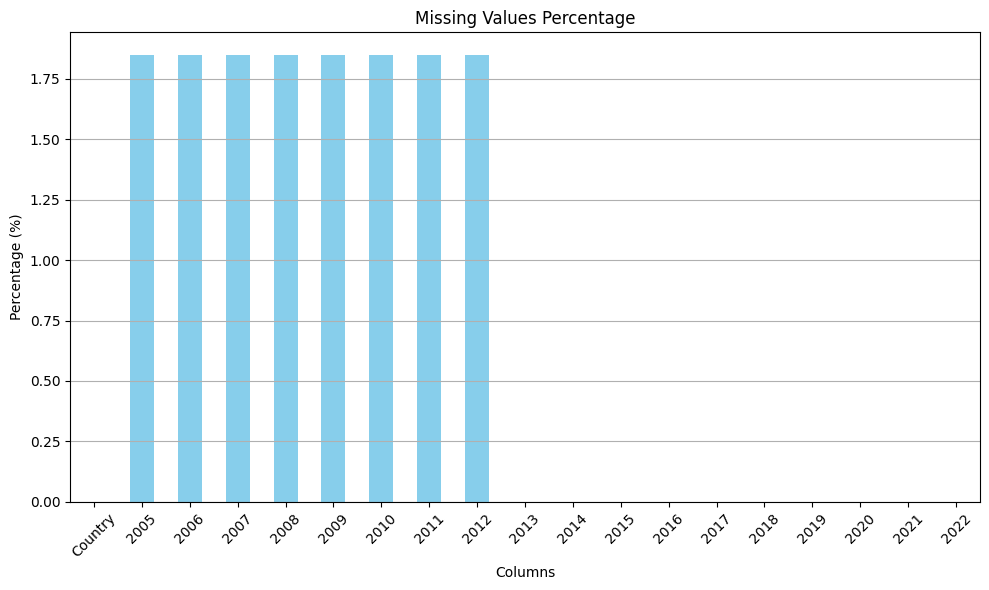


ECI Dataset:
Missing Values and Percentage:
         Missing Values  Percentage
Country               0        0.00
2005                  1        1.85
2006                  1        1.85
2007                  1        1.85
2008                  1        1.85
2009                  1        1.85
2010                  1        1.85
2011                  1        1.85
2012                  1        1.85
2013                  0        0.00
2014                  0        0.00
2015                  0        0.00
2016                  0        0.00
2017                  0        0.00
2018                  0        0.00
2019                  0        0.00
2020                  0        0.00
2021                  0        0.00
2022                  0        0.00


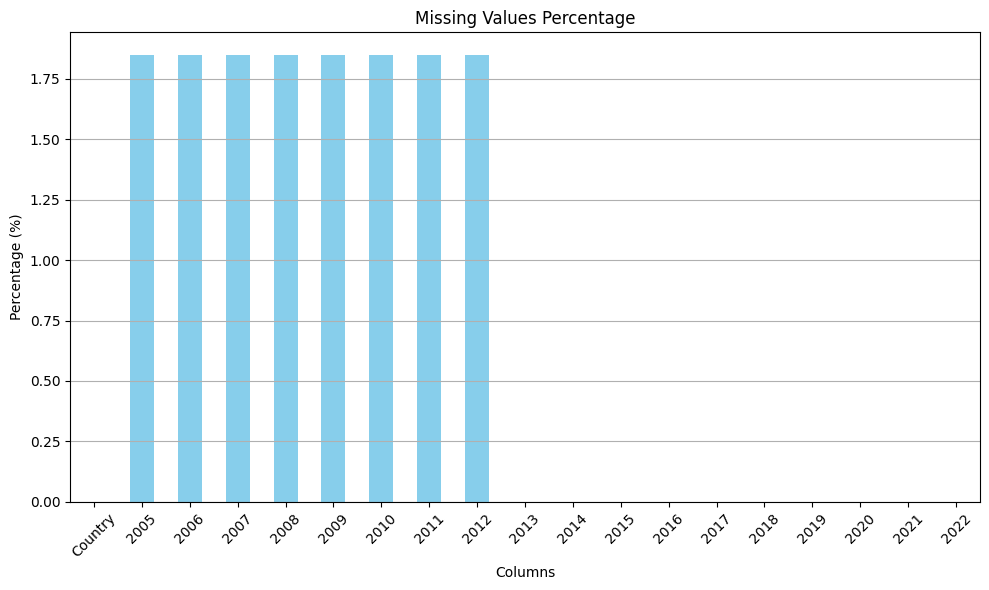


ICI Dataset:
Missing Values and Percentage:
         Missing Values  Percentage
Country               0        0.00
2005                  1        1.85
2006                  1        1.85
2007                  1        1.85
2008                  1        1.85
2009                  1        1.85
2010                  1        1.85
2011                  1        1.85
2012                  1        1.85
2013                  0        0.00
2014                  0        0.00
2015                  0        0.00
2016                  0        0.00
2017                  0        0.00
2018                  0        0.00
2019                  0        0.00
2020                  0        0.00
2021                  0        0.00
2022                  0        0.00


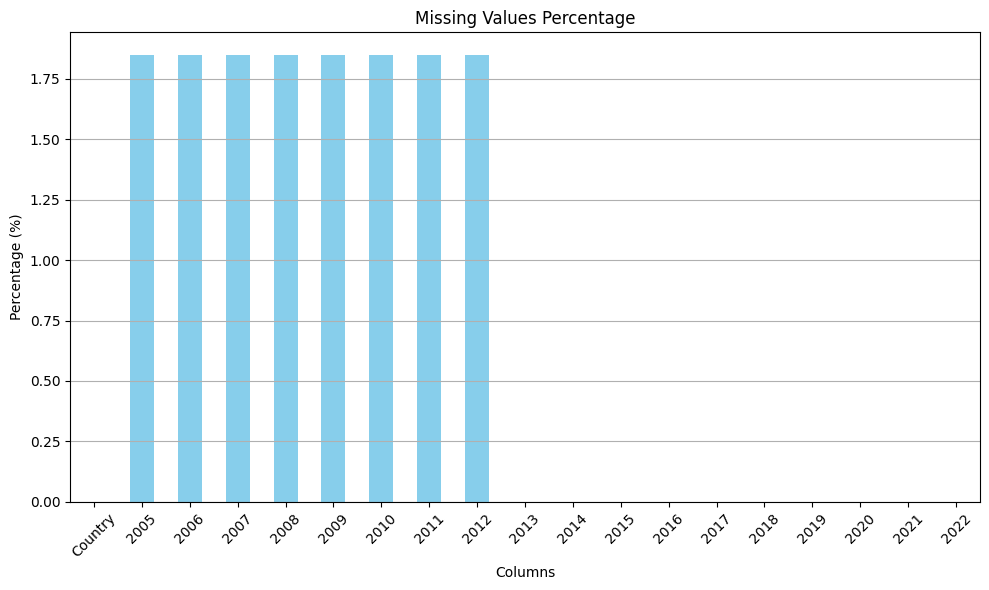


WSSCI Dataset:
Missing Values and Percentage:
         Missing Values  Percentage
Country               0        0.00
2005                  1        1.85
2006                  1        1.85
2007                  1        1.85
2008                  1        1.85
2009                  1        1.85
2010                  1        1.85
2011                  1        1.85
2012                  1        1.85
2013                  1        1.85
2014                  0        0.00
2015                  0        0.00
2016                  0        0.00
2017                  0        0.00
2018                  0        0.00
2019                  0        0.00
2020                  0        0.00
2021                  0        0.00
2022                  0        0.00


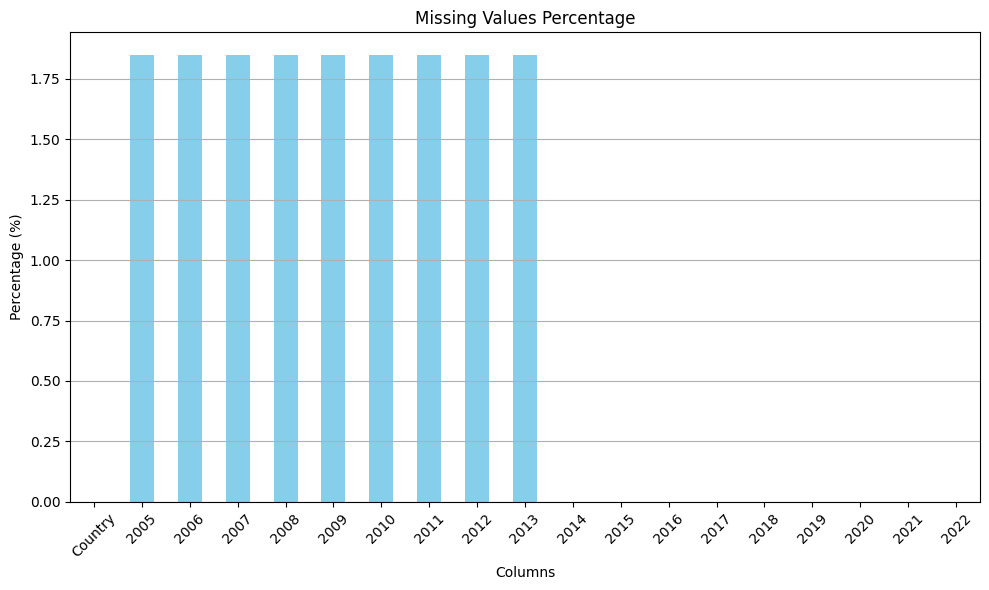

In [ ]:
def display_missing_values(data):
    # Calculate missing values and percentage
    missing_values = data.isnull().sum()
    missing_percentage = ((missing_values / len(data)) * 100).round(2)

    # Combine missing values and percentage into a DataFrame
    missing_info = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})

    # Display missing values and percentage
    print("Missing Values and Percentage:")
    print(missing_info)


    # Plot missing values and percentage
    plt.figure(figsize=(10, 6))
    missing_info['Percentage'].plot(kind='bar', color='skyblue')
    plt.title('Missing Values Percentage')
    plt.xlabel('Columns')
    plt.ylabel('Percentage (%)')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

# Usage example:
# Display missing values for each dataset
print("AIDI Dataset:")
display_missing_values(aidi)
print("\nTCI Dataset:")
display_missing_values(tci)
print("\nECI Dataset:")
display_missing_values(eci)
print("\nICI Dataset:")
display_missing_values(ici)
print("\nWSSCI Dataset:")
display_missing_values(wssci)


AIDI Dataset:


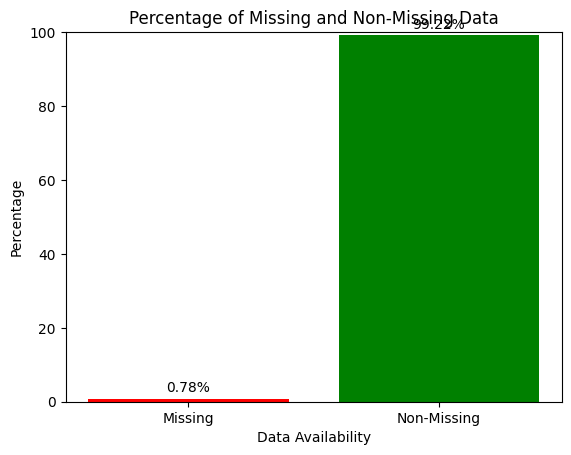


TCI Dataset:


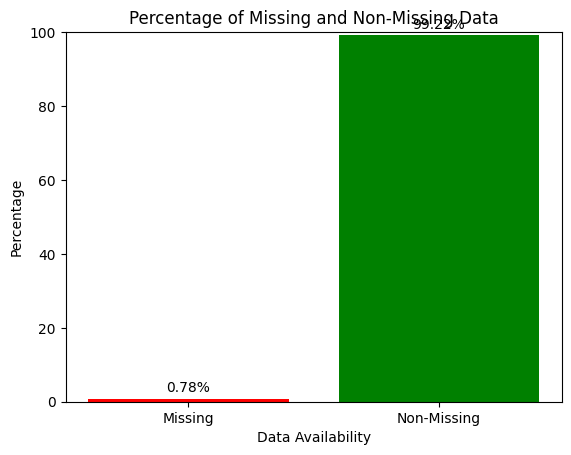


ECI Dataset:


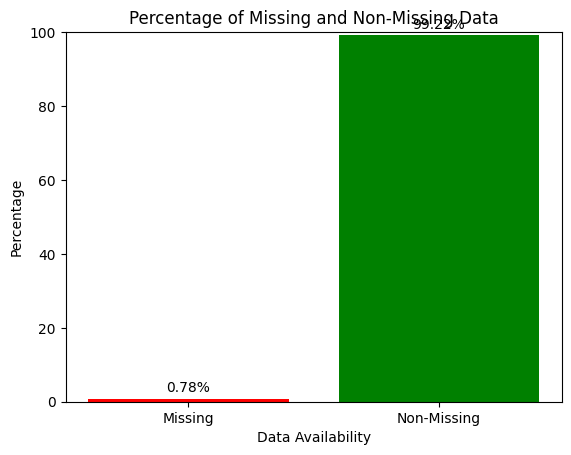


ICI Dataset:


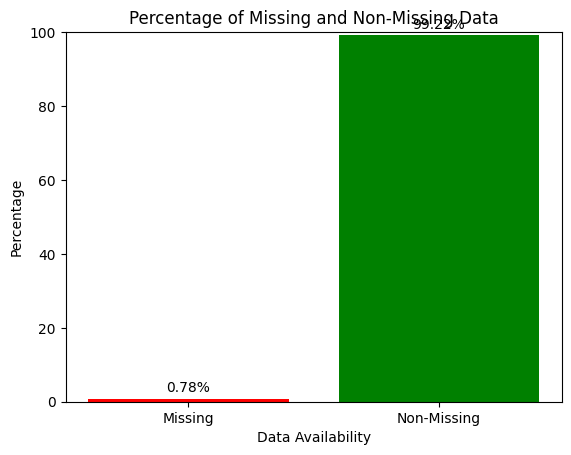


WSSCI Dataset:


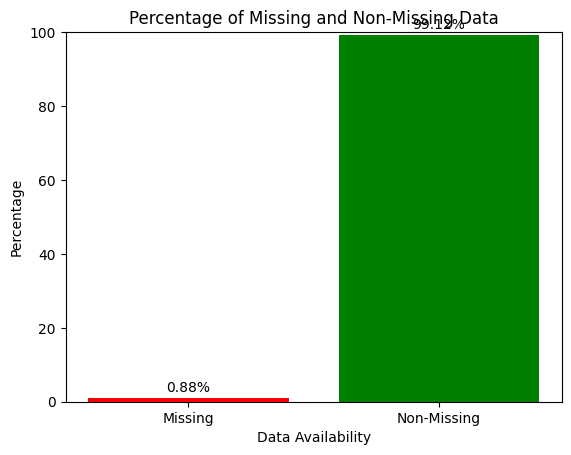

In [ ]:
import matplotlib.pyplot as plt

def plot_data_availability(data):
    # Calculate the total number of missing values
    total_missing = data.isnull().sum().sum()

    # Calculate the total number of values in the dataset
    total_values = data.size

    # Calculate the total number of non-missing values
    total_non_missing = total_values - total_missing

    # Calculate the percentage of missing and non-missing data
    percentage_missing = (total_missing / total_values) * 100
    percentage_non_missing = 100 - percentage_missing

    # Plot the bar graph
    categories = ['Missing', 'Non-Missing']
    percentages = [percentage_missing, percentage_non_missing]

    plt.bar(categories, percentages, color=['red', 'green'])
    plt.xlabel('Data Availability')
    plt.ylabel('Percentage')
    plt.title('Percentage of Missing and Non-Missing Data')

    # Annotate the percentage values on the bars
    for i, percentage in enumerate(percentages):
        plt.text(i, percentage + 1, f'{percentage:.2f}%', ha='center', va='bottom')

    plt.ylim(0, 100)  # Set y-axis limit to 0-100%
    plt.show()

# Usage example:
# Plot data availability for each dataset
print("AIDI Dataset:")
plot_data_availability(aidi)
print("\nTCI Dataset:")
plot_data_availability(tci)
print("\nECI Dataset:")
plot_data_availability(eci)
print("\nICI Dataset:")
plot_data_availability(ici)
print("\nWSSCI Dataset:")
plot_data_availability(wssci)


AIDI Dataset:


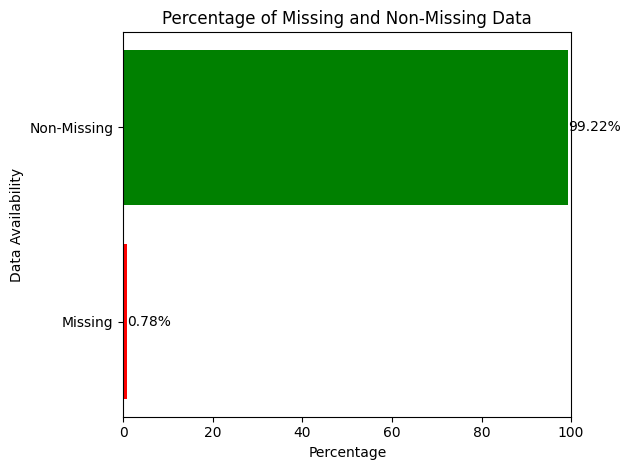


TCI Dataset:


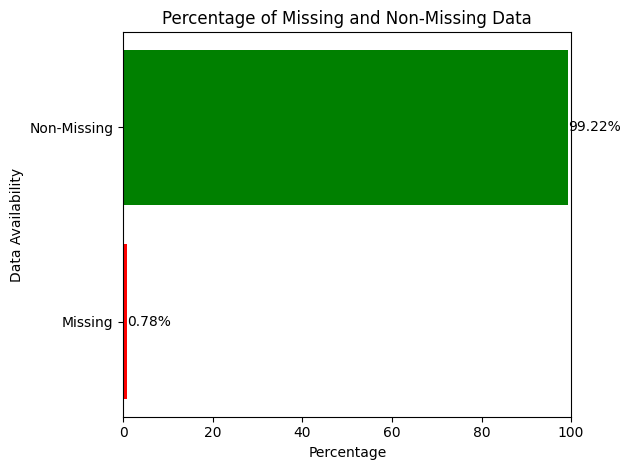


ECI Dataset:


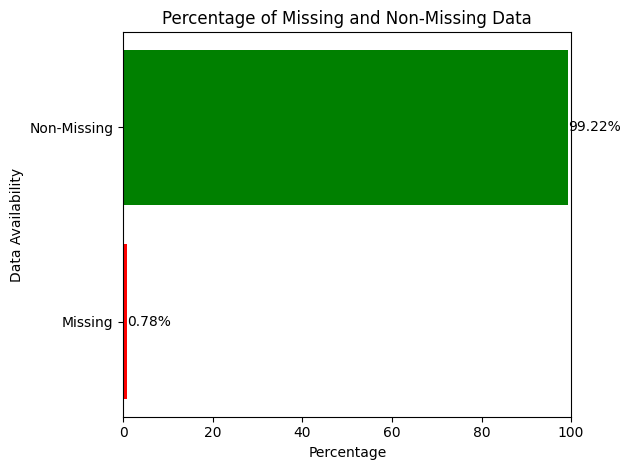


ICI Dataset:


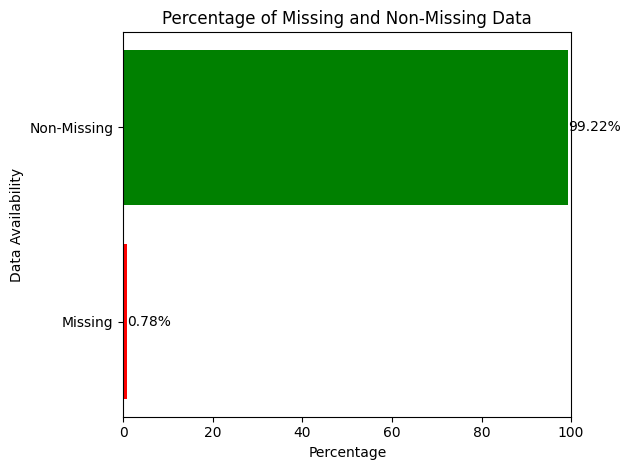


WSSCI Dataset:


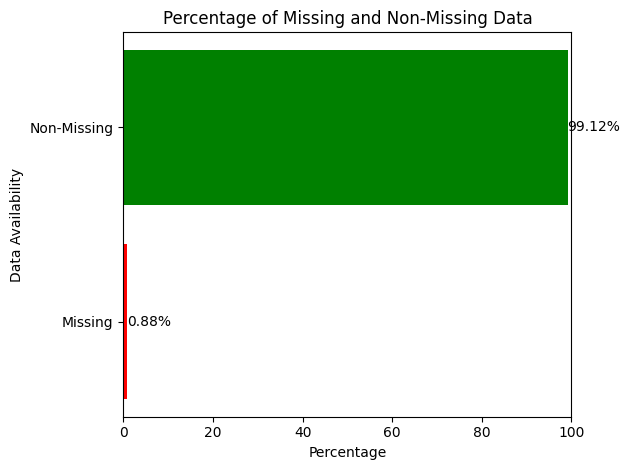

In [ ]:
import matplotlib.pyplot as plt

def plot_data_availability(data):
    # Calculate the total number of missing values
    total_missing = data.isnull().sum().sum()

    # Calculate the total number of values in the dataset
    total_values = data.size

    # Calculate the total number of non-missing values
    total_non_missing = total_values - total_missing

    # Calculate the percentage of missing and non-missing data
    percentage_missing = (total_missing / total_values) * 100
    percentage_non_missing = 100 - percentage_missing

    # Plot the horizontal bar graph
    categories = ['Missing', 'Non-Missing']
    percentages = [percentage_missing, percentage_non_missing]

    plt.barh(categories, percentages, color=['red', 'green'])
    plt.xlabel('Percentage')
    plt.ylabel('Data Availability')
    plt.title('Percentage of Missing and Non-Missing Data')

    # Annotate the percentage values on the bars
    for i, percentage in enumerate(percentages):
        plt.text(percentage, i, f'{percentage:.2f}%', ha='left', va='center')

    plt.xlim(0, 100)  # Set x-axis limit to 0-100%

    plt.tight_layout()  # Adjust layout to prevent overlapping elements

    plt.show()

# Usage example:
# Plot data availability for each dataset
print("AIDI Dataset:")
plot_data_availability(aidi)
print("\nTCI Dataset:")
plot_data_availability(tci)
print("\nECI Dataset:")
plot_data_availability(eci)
print("\nICI Dataset:")
plot_data_availability(ici)
print("\nWSSCI Dataset:")
plot_data_availability(wssci)


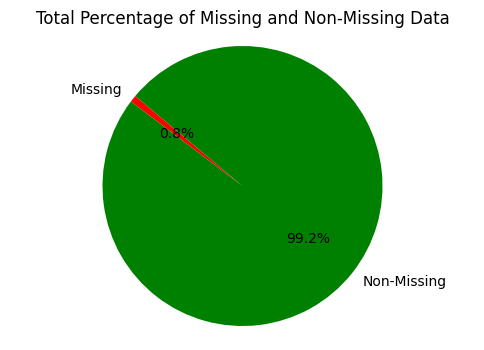

In [ ]:
def plot_total_data_availability(datasets):
    total_missing = 0
    total_non_missing = 0

    # Calculate the total missing and non-missing percentages
    for data in datasets:
        total_missing += data.isnull().sum().sum()
        total_non_missing += (data.size - data.isnull().sum().sum())

    # Calculate the total values
    total_values = total_missing + total_non_missing

    # Calculate the percentages
    total_percentage_missing = (total_missing / total_values) * 100
    total_percentage_non_missing = (total_non_missing / total_values) * 100

    # Plot the pie chart
    labels = ['Missing', 'Non-Missing']
    sizes = [total_percentage_missing, total_percentage_non_missing]
    colors = ['red', 'green']

    plt.figure(figsize=(6, 4))  # Adjust figure size
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    plt.title('Total Percentage of Missing and Non-Missing Data')

    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

    plt.show()

# Usage example:
# Plot total data availability for all datasets
plot_total_data_availability([aidi, tci, eci, ici, wssci])


## Missingness by Country

AIDI Dataset:


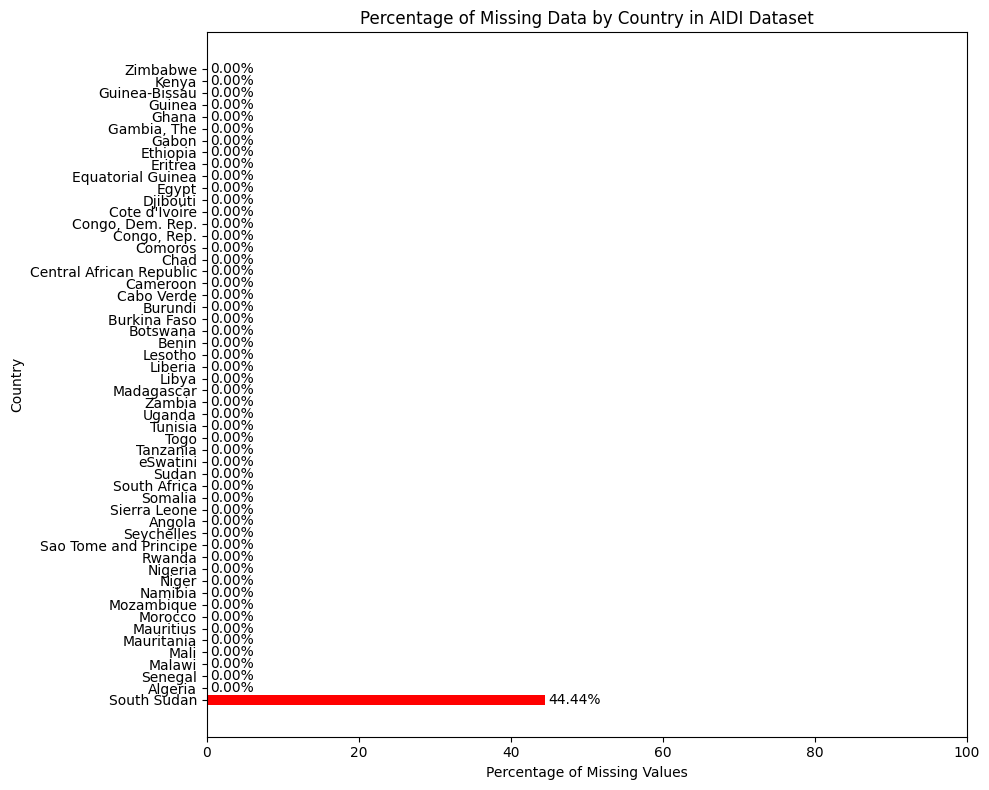


TCI Dataset:


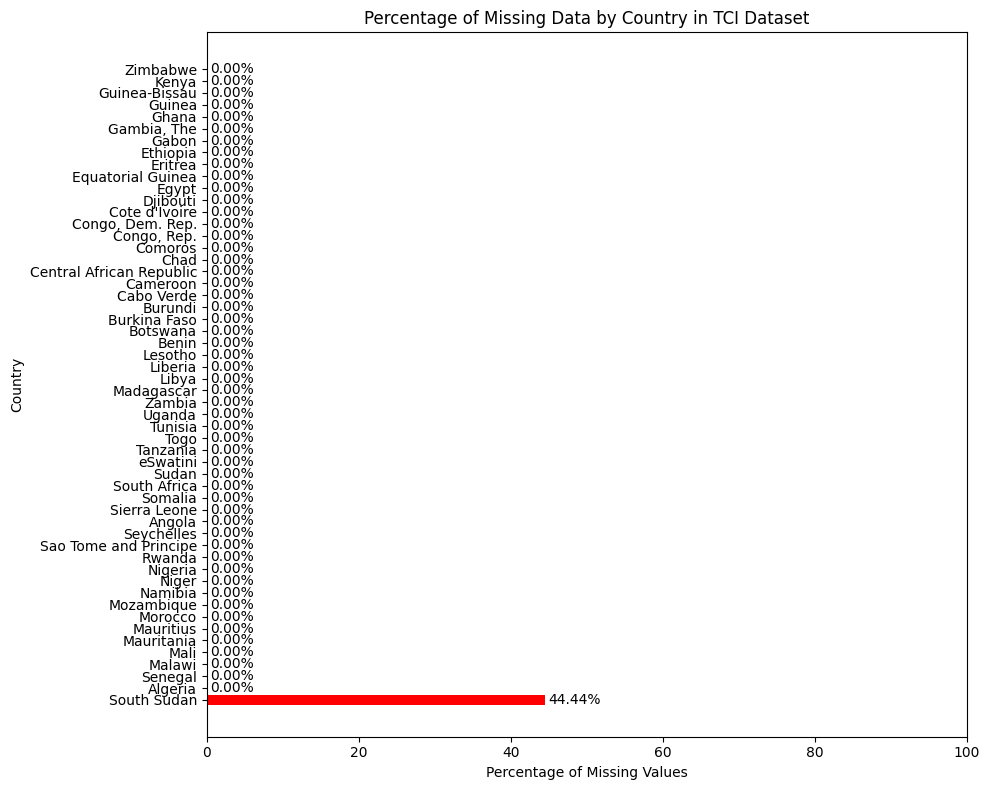


ECI Dataset:


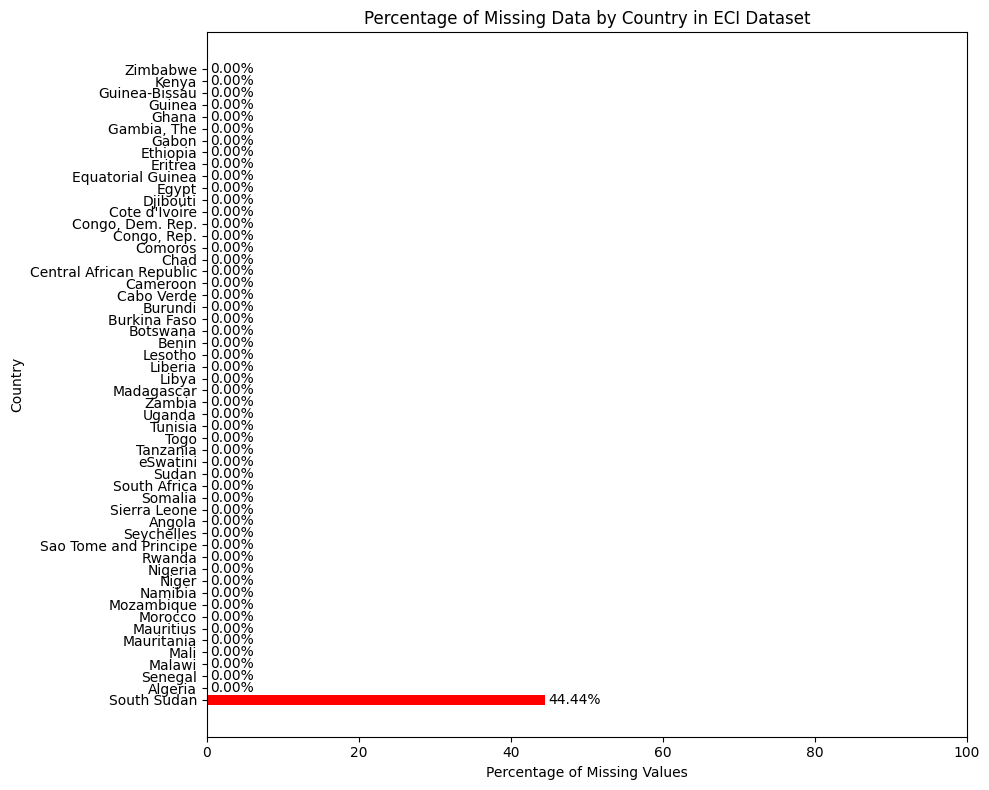


ICI Dataset:


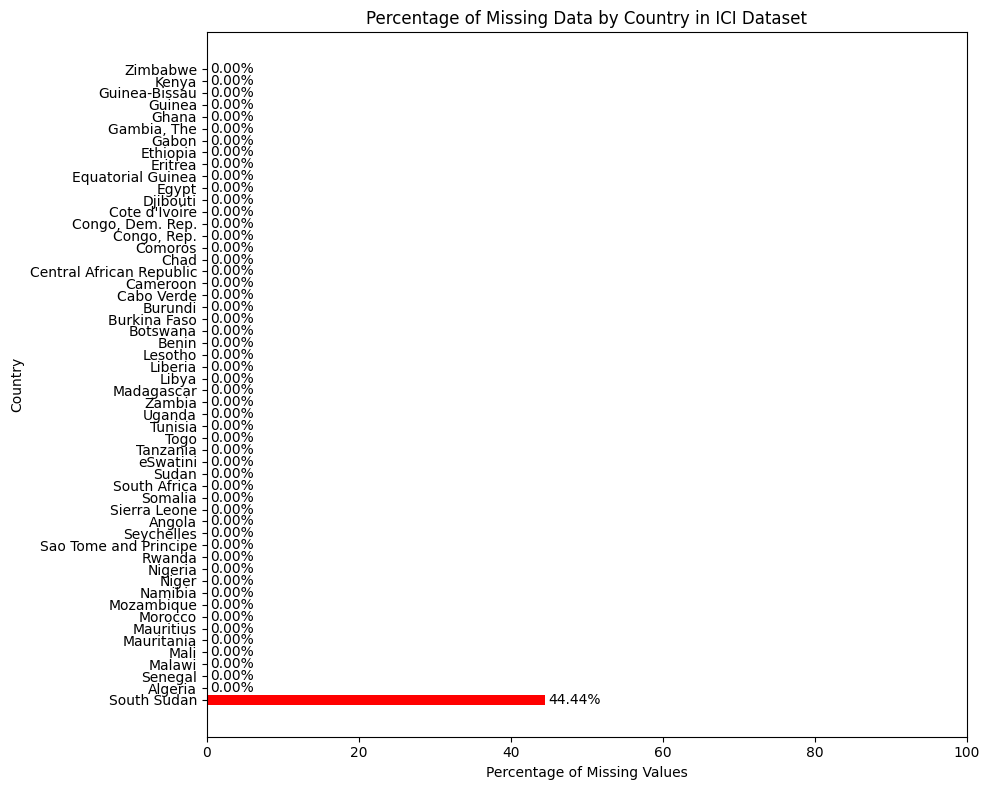


WSSCI Dataset:


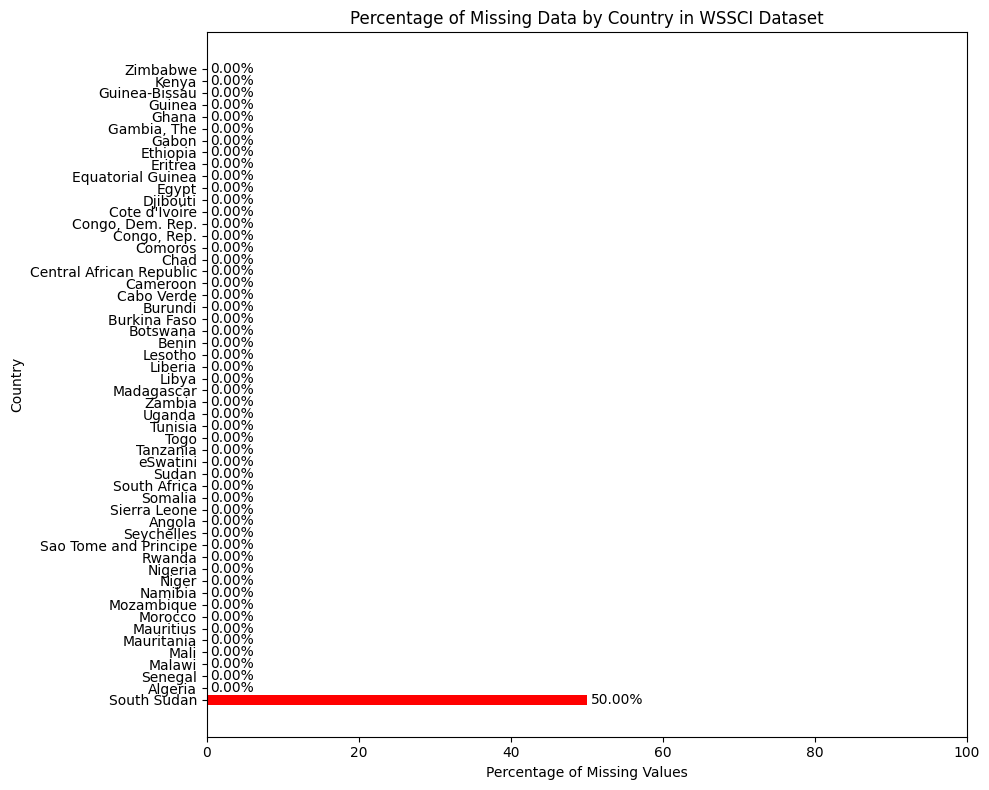

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_missingness_by_country(data, dataset_name):
    # Calculate the total number of missing values per country
    missing_values_by_country = data.isnull().sum(axis=1)

    # Calculate the percentage of missing values per country
    percentage_missing_by_country = (missing_values_by_country / (data.shape[1] - 1)) * 100

    # Sort by percentage of missing values
    sorted_missing_percentage = percentage_missing_by_country.sort_values(ascending=False)

    # Get sorted country names based on missing percentage
    sorted_countries = data.loc[sorted_missing_percentage.index, 'Country']

    # Plot the horizontal bar graph
    plt.figure(figsize=(10, 8))
    plt.barh(sorted_countries, sorted_missing_percentage, color='red')
    plt.xlabel('Percentage of Missing Values')
    plt.ylabel('Country')
    plt.title(f'Percentage of Missing Data by Country in {dataset_name} Dataset')

    # Annotate the percentage values on the bars
    for index, value in enumerate(sorted_missing_percentage):
        plt.text(value + 0.5, index, f'{value:.2f}%', ha='left', va='center')

    plt.xlim(0, 100)  # Set x-axis limit to 0-100%
    plt.tight_layout()  # Adjust layout to prevent overlapping elements

    plt.show()


# Plot missingness by country for each dataset
print("AIDI Dataset:")
plot_missingness_by_country(aidi, "AIDI")
print("\nTCI Dataset:")
plot_missingness_by_country(tci, "TCI")
print("\nECI Dataset:")
plot_missingness_by_country(eci, "ECI")
print("\nICI Dataset:")
plot_missingness_by_country(ici, "ICI")
print("\nWSSCI Dataset:")
plot_missingness_by_country(wssci, "WSSCI")


<Figure size 2500x1000 with 0 Axes>

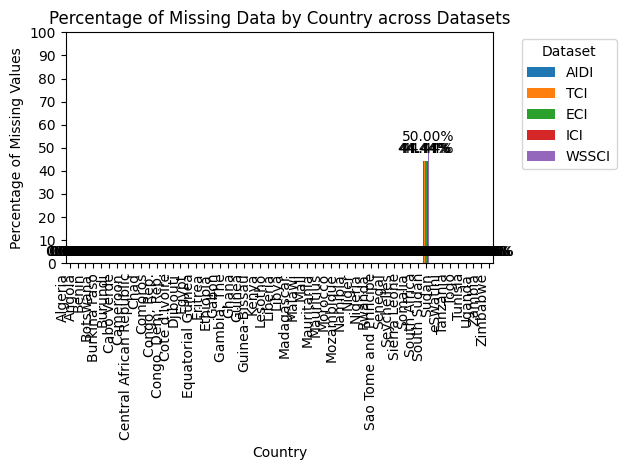

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def calculate_missingness(data, dataset_name):
    # Calculate the total number of missing values per country
    missing_values_by_country = data.isnull().sum(axis=1)

    # Calculate the percentage of missing values per country
    percentage_missing_by_country = (missing_values_by_country / (data.shape[1] - 1)) * 100

    # Create a DataFrame to store the results
    missingness_df = pd.DataFrame({
        'Country': data['Country'],
        dataset_name: percentage_missing_by_country
    })

    return missingness_df

# Calculate missingness for each dataset
aidi_missingness = calculate_missingness(aidi, 'AIDI')
tci_missingness = calculate_missingness(tci, 'TCI')
eci_missingness = calculate_missingness(eci, 'ECI')
ici_missingness = calculate_missingness(ici, 'ICI')
wssci_missingness = calculate_missingness(wssci, 'WSSCI')

# Merge all missingness DataFrames on 'Country'
combined_missingness = aidi_missingness.merge(tci_missingness, on='Country')
combined_missingness = combined_missingness.merge(eci_missingness, on='Country')
combined_missingness = combined_missingness.merge(ici_missingness, on='Country')
combined_missingness = combined_missingness.merge(wssci_missingness, on='Country')

# Set 'Country' as the index for plotting
combined_missingness.set_index('Country', inplace=True)

# Plotting the combined missingness
plt.figure(figsize=(25, 10))  # Adjust figure size for better readability
ax = combined_missingness.plot(kind='bar', width=0.8)
plt.xlabel('Country')
plt.xticks(rotation=90, ha='right')
plt.ylabel('Percentage of Missing Values')
plt.title('Percentage of Missing Data by Country across Datasets')
plt.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')

# Set x-axis limits and ticks
plt.xlim(-0.5, len(combined_missingness) - 0.5)
plt.ylim(0, 100)
ax.set_yticks(range(0, 101, 10))

# Annotate the bars with percentage values
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', label_type='edge', padding=3)

plt.tight_layout()
plt.show()


<Figure size 1500x500 with 0 Axes>

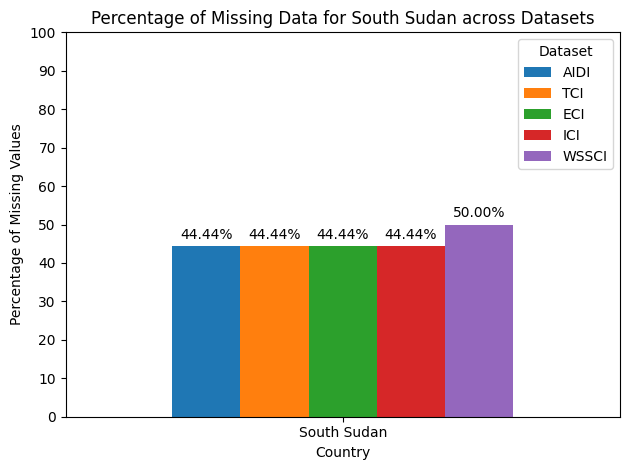

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def calculate_missingness(data, dataset_name):
    # Calculate the total number of missing values per country
    missing_values_by_country = data.isnull().sum(axis=1)

    # Calculate the percentage of missing values per country
    percentage_missing_by_country = (missing_values_by_country / (data.shape[1] - 1)) * 100

    # Create a DataFrame to store the results
    missingness_df = pd.DataFrame({
        'Country': data['Country'],
        dataset_name: percentage_missing_by_country
    })

    return missingness_df


# Calculate missingness for each dataset
aidi_missingness = calculate_missingness(aidi, 'AIDI')
tci_missingness = calculate_missingness(tci, 'TCI')
eci_missingness = calculate_missingness(eci, 'ECI')
ici_missingness = calculate_missingness(ici, 'ICI')
wssci_missingness = calculate_missingness(wssci, 'WSSCI')

# Merge all missingness DataFrames on 'Country'
combined_missingness = aidi_missingness.merge(tci_missingness, on='Country')
combined_missingness = combined_missingness.merge(eci_missingness, on='Country')
combined_missingness = combined_missingness.merge(ici_missingness, on='Country')
combined_missingness = combined_missingness.merge(wssci_missingness, on='Country')

# Filter data for index 45
south_sudan_missingness = combined_missingness.iloc[[45]]

# Set 'Country' as the index for plotting
south_sudan_missingness.set_index('Country', inplace=True)

# Plotting the missingness for South Sudan
plt.figure(figsize=(15, 5))  # Adjust figure size for better readability
ax = south_sudan_missingness.plot(kind='bar', width=0.8)
plt.xlabel('Country')
plt.xticks(rotation=0)
plt.ylabel('Percentage of Missing Values')
plt.title('Percentage of Missing Data for South Sudan across Datasets')
plt.legend(title='Dataset')

# Set y-axis limits and ticks
plt.ylim(0, 100)
ax.set_yticks(range(0, 101, 10))

# Annotate the bars with percentage values
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', label_type='edge', padding=3)

plt.tight_layout()
plt.show()


In [ ]:
combined_missingness["Country"]

0                      Algeria
1                       Angola
2                        Benin
3                     Botswana
4                 Burkina Faso
5                      Burundi
6                   Cabo Verde
7                     Cameroon
8     Central African Republic
9                         Chad
10                     Comoros
11                 Congo, Rep.
12            Congo, Dem. Rep.
13               Cote d'Ivoire
14                    Djibouti
15                       Egypt
16           Equatorial Guinea
17                     Eritrea
18                    Ethiopia
19                       Gabon
20                 Gambia, The
21                       Ghana
22                      Guinea
23               Guinea-Bissau
24                       Kenya
25                     Lesotho
26                     Liberia
27                       Libya
28                  Madagascar
29                      Malawi
30                        Mali
31                  Mauritania
32      

# EDA

## De-Stat plot per Country

Descriptive plots for dataset: AIDI


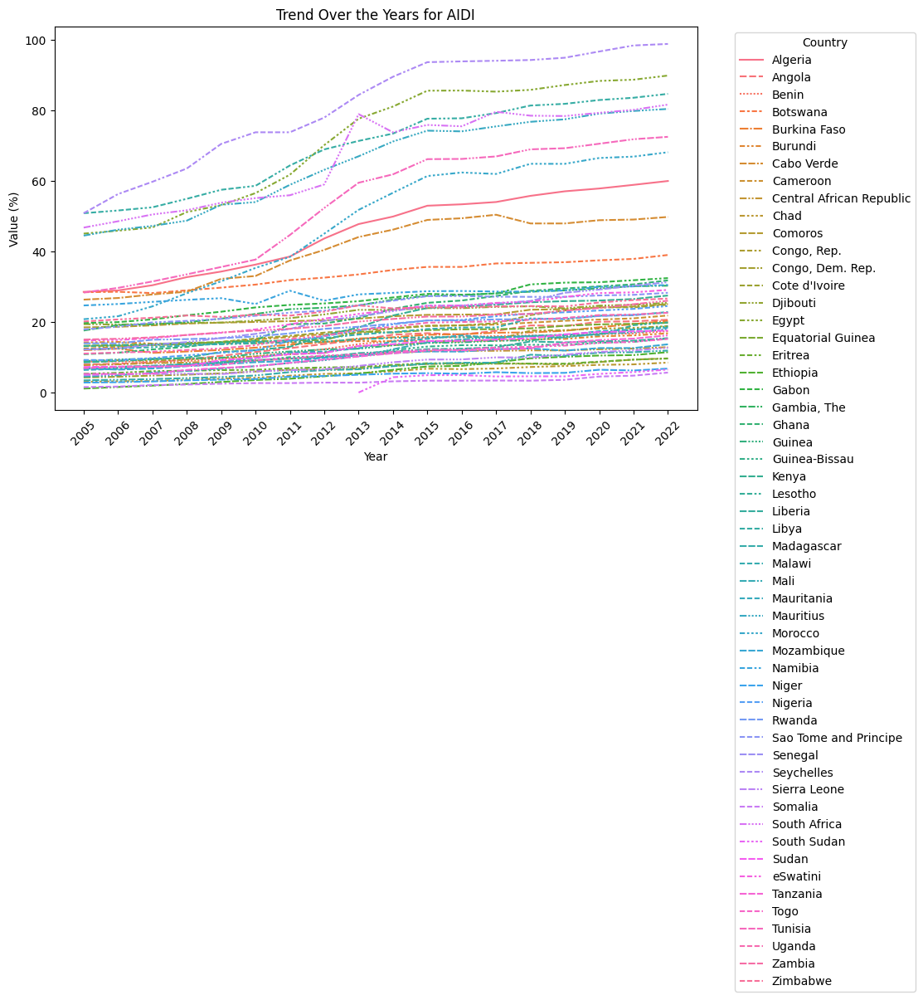

Descriptive plots for dataset: Transport Composite Index


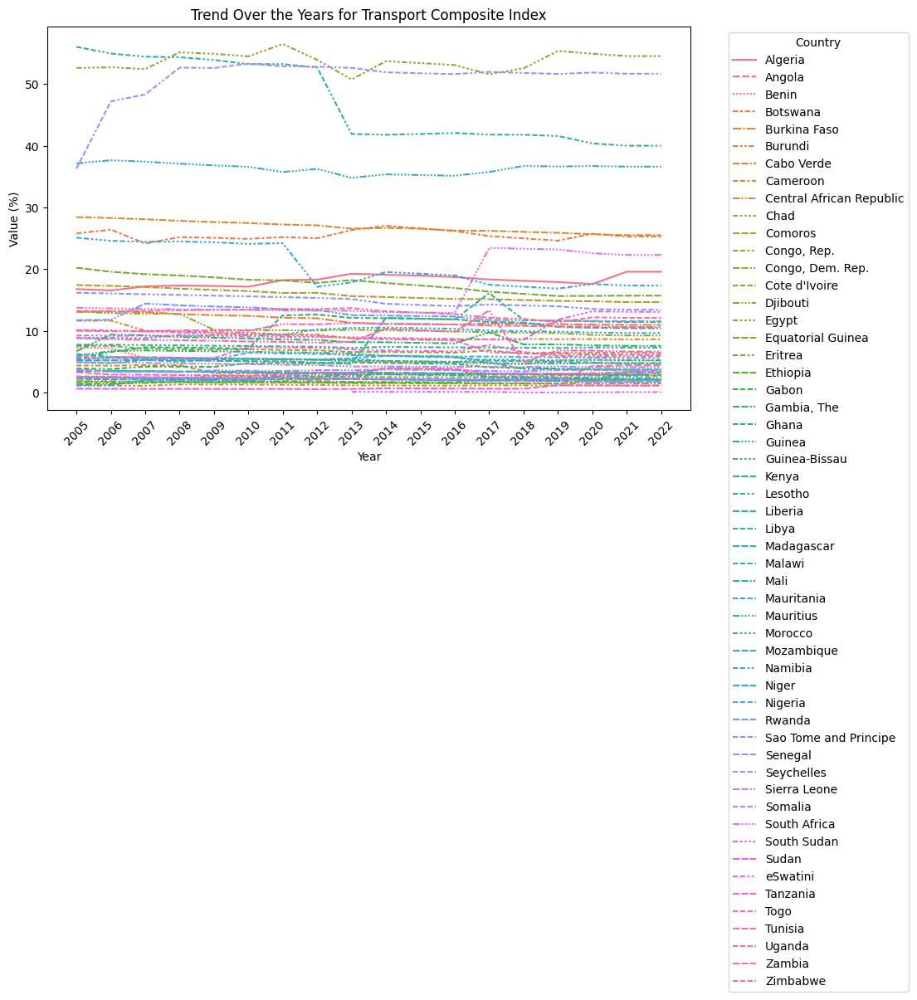

Descriptive plots for dataset: Electricity Composite Index


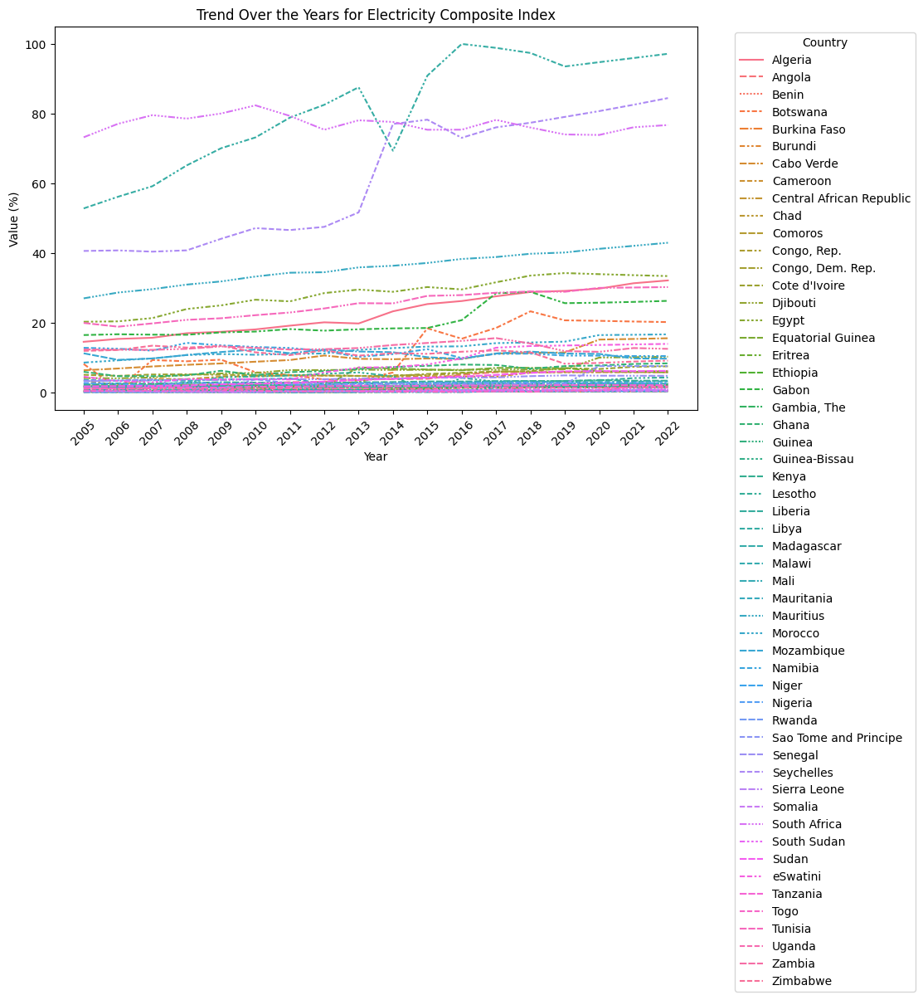

Descriptive plots for dataset: ICT Composite Index


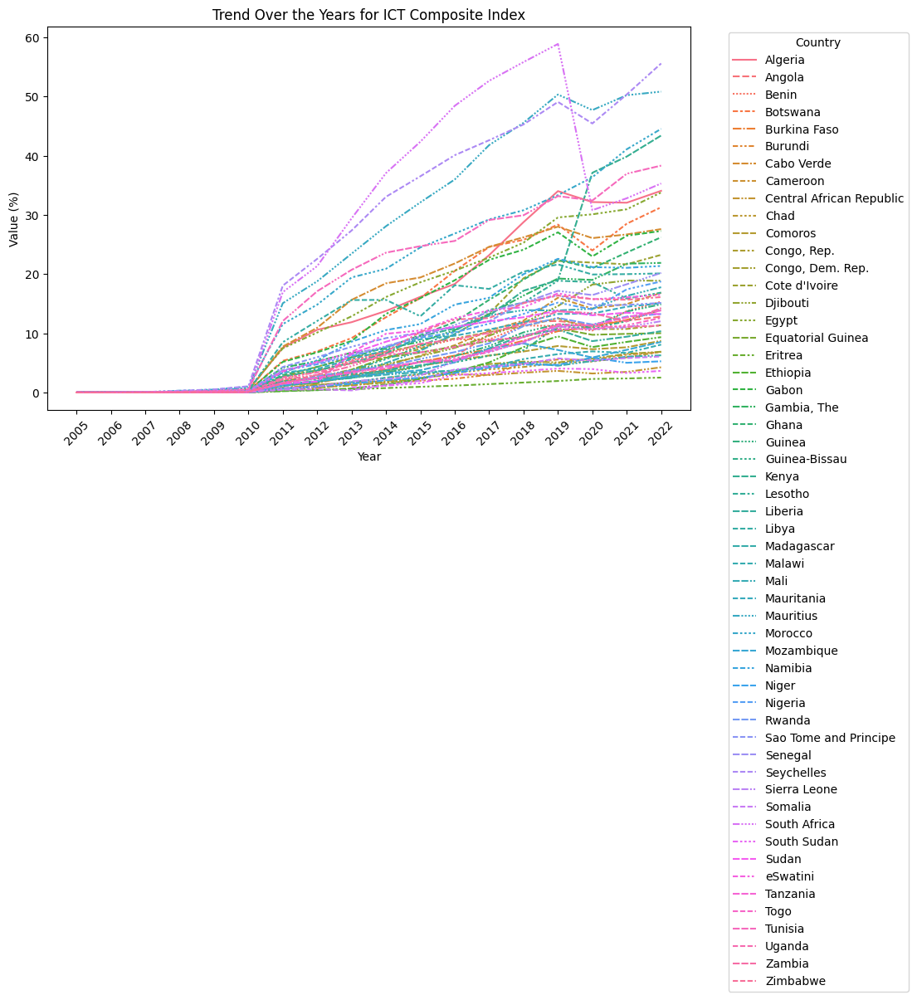

Descriptive plots for dataset: WSS Composite Index


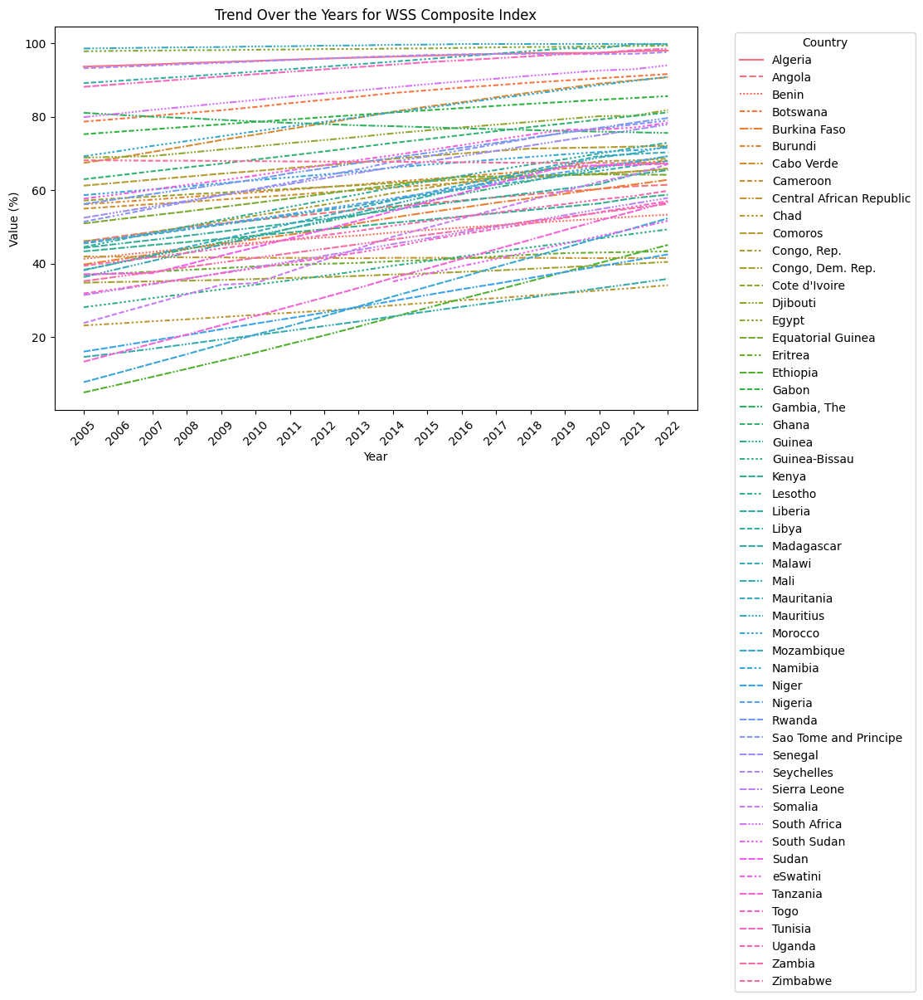

In [ ]:
# Create descriptive plots for each dataset
datasets = {'AIDI': aidi, 'Transport Composite Index': tci, 'Electricity Composite Index': eci, 'ICT Composite Index': ici, 'WSS Composite Index': wssci}

for name, df in datasets.items():
    print(f"Descriptive plots for dataset: {name}")
    # Depending on the characteristics of the dataset, you can choose appropriate plots
    # For example, line plots for time series data, bar plots for categorical data, etc.
    # Here, we create a line plot for each country's trend over the years
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=df.set_index('Country').T)
    plt.title(f"Trend Over the Years for {name}")
    plt.xlabel("Year")
    plt.ylabel("Value (%)")  # Adding percentage sign to y-axis label
    plt.xticks(rotation=45)
    plt.legend(title="Country", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


## De-Stat plot by Continent

Descriptive plots for dataset: AIDI


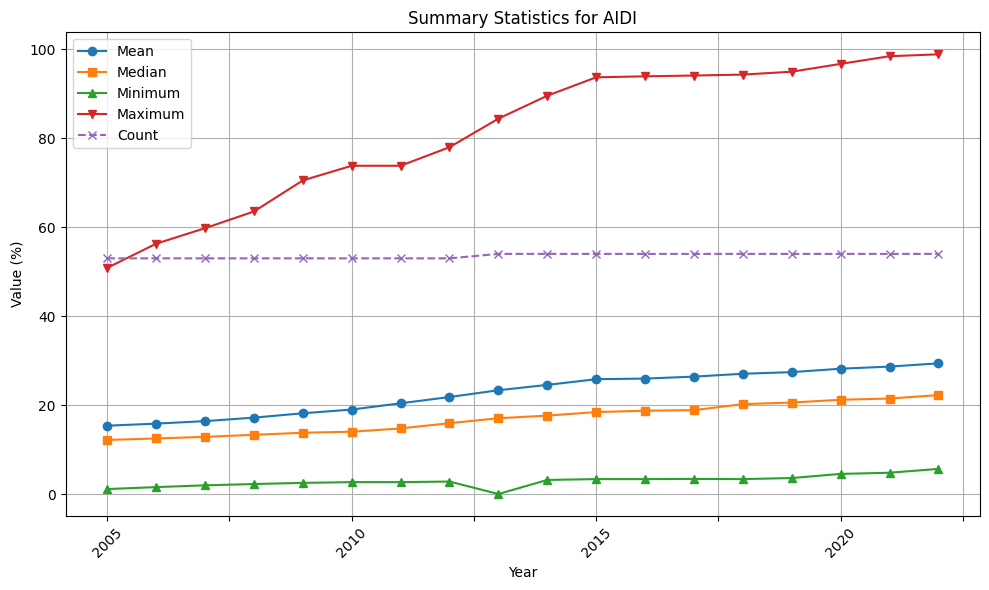

Descriptive plots for dataset: Transport Composite Index


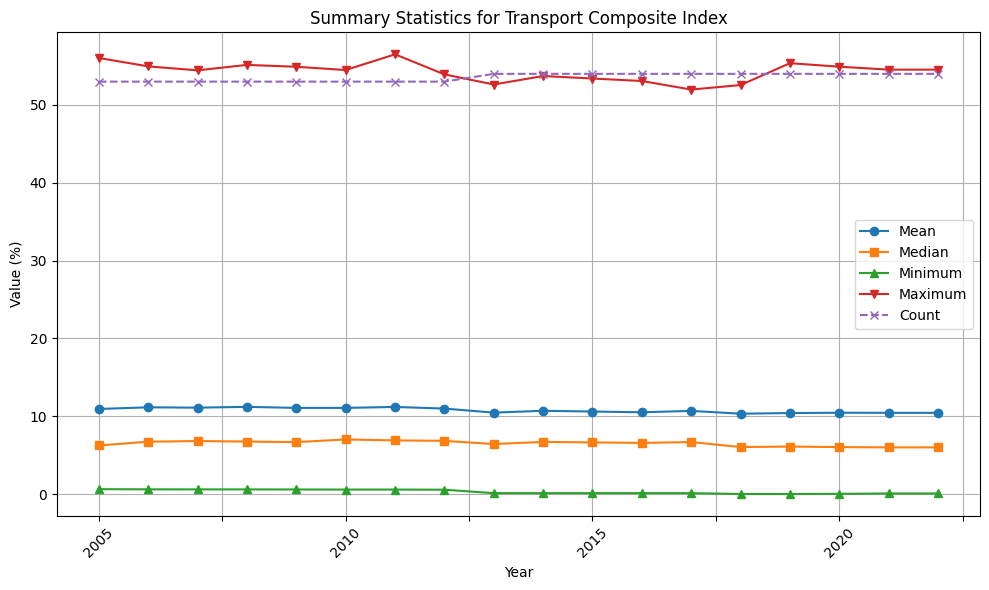

Descriptive plots for dataset: Electricity Composite Index


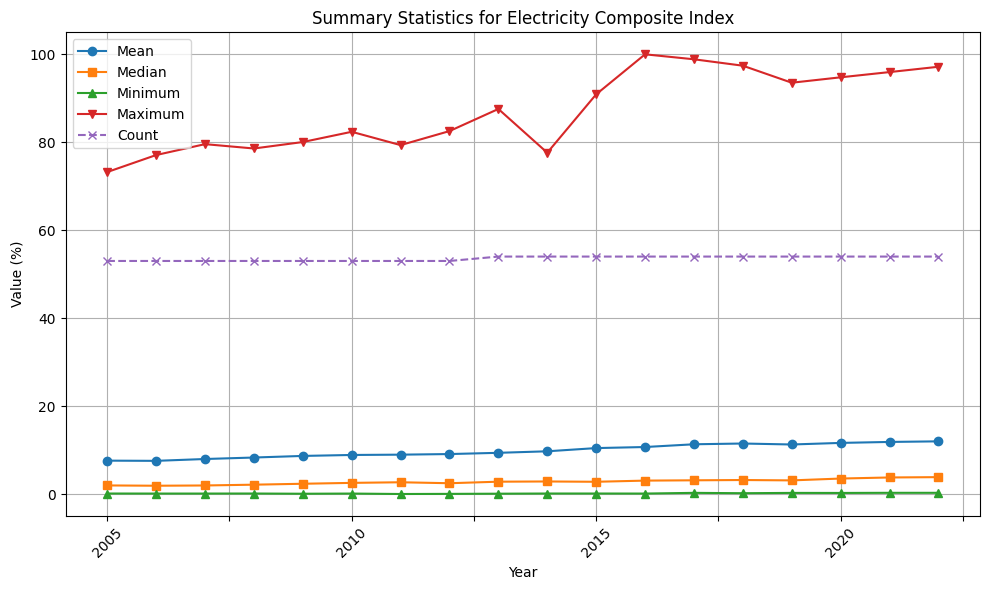

Descriptive plots for dataset: ICT Composite Index


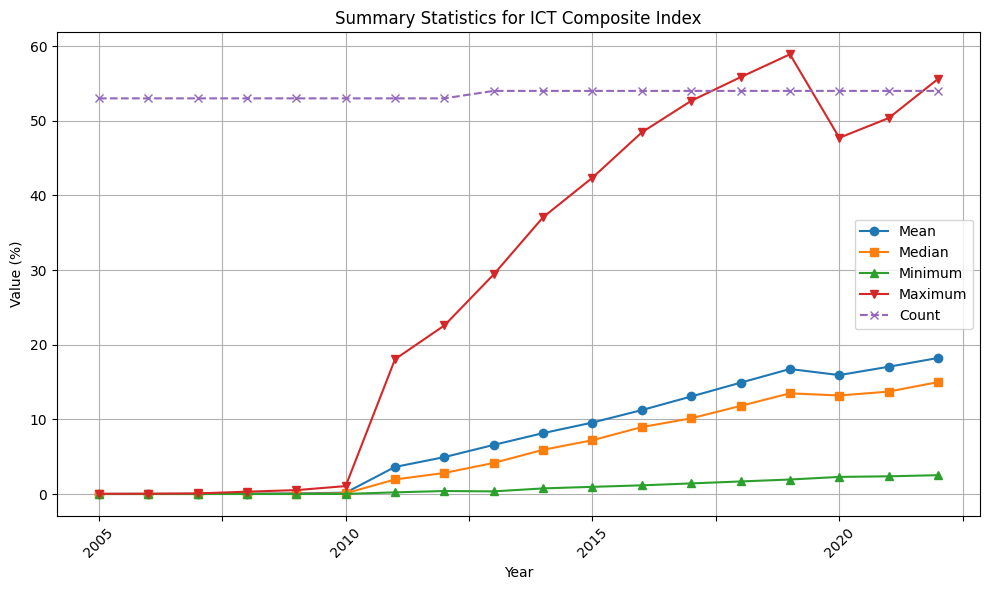

Descriptive plots for dataset: WSS Composite Index


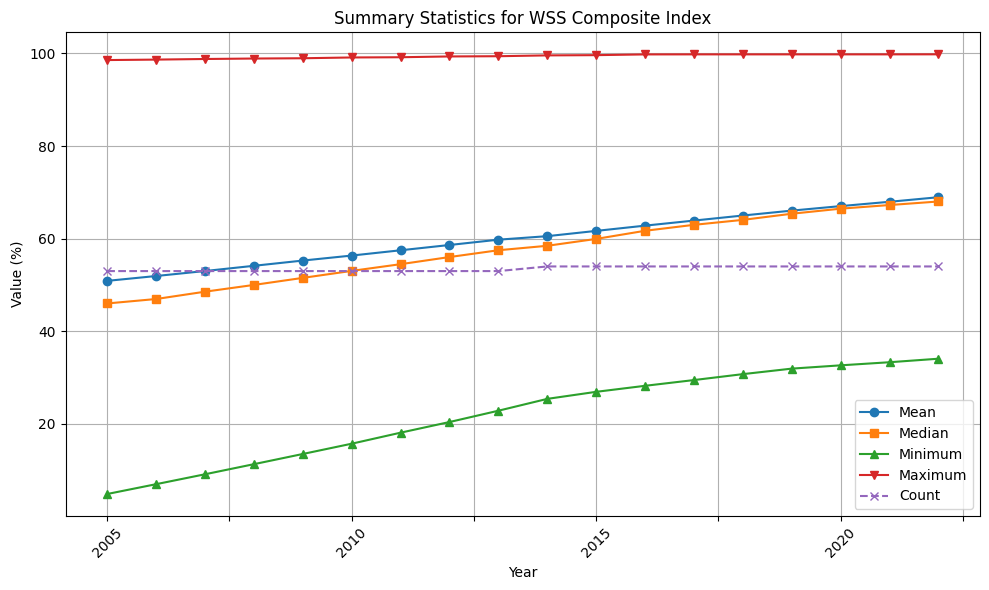

In [ ]:
# Create descriptive plots for each dataset
datasets = {'AIDI': aidi, 'Transport Composite Index': tci, 'Electricity Composite Index': eci, 'ICT Composite Index': ici, 'WSS Composite Index': wssci}

for name, df in datasets.items():
    print(f"Descriptive plots for dataset: {name}")
    # Compute summary statistics
    summary_stats = df.describe()

    # Plot the data
    plt.figure(figsize=(10, 6))
    summary_stats.loc['mean'].plot(label='Mean', marker='o')
    summary_stats.loc['50%'].plot(label='Median', marker='s')
    summary_stats.loc['min'].plot(label='Minimum', marker='^')
    summary_stats.loc['max'].plot(label='Maximum', marker='v')
    summary_stats.loc['count'].plot(label='Count', marker='x', linestyle='--')
    plt.title(f'Summary Statistics for {name}')
    plt.xlabel('Year')
    plt.ylabel('Value (%)')  # Update ylabel accordingly
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## De-Stat Mean Plot by Continent

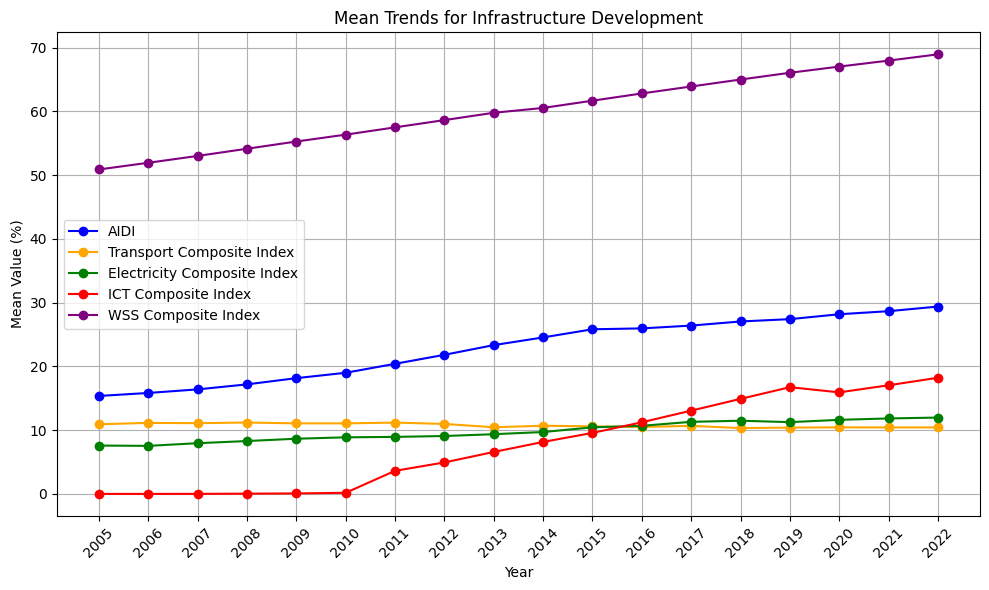

In [ ]:
# Compute mean trends for each dataset (excluding the first column)
mean_trends = {
    'AIDI': aidi.iloc[:, 1:].mean(),
    'Transport Composite Index': tci.iloc[:, 1:].mean(),
    'Electricity Composite Index': eci.iloc[:, 1:].mean(),
    'ICT Composite Index': ici.iloc[:, 1:].mean(),
    'WSS Composite Index': wssci.iloc[:, 1:].mean()
}

# Concatenate mean trends into a DataFrame
mean_trends_df = pd.DataFrame(mean_trends)

# Plot the mean trends
plt.figure(figsize=(10, 6))

# Define unique colors for each dataset
colors = ['blue', 'orange', 'green', 'red', 'purple']

for i, (name, trend) in enumerate(mean_trends_df.items()):
    plt.plot(trend.index, trend.values, label=name, color=colors[i], marker='o')

plt.title('Mean Trends for Infrastructure Development')
plt.xlabel('Year')
plt.ylabel('Mean Value (%)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Yearly Growth Rate

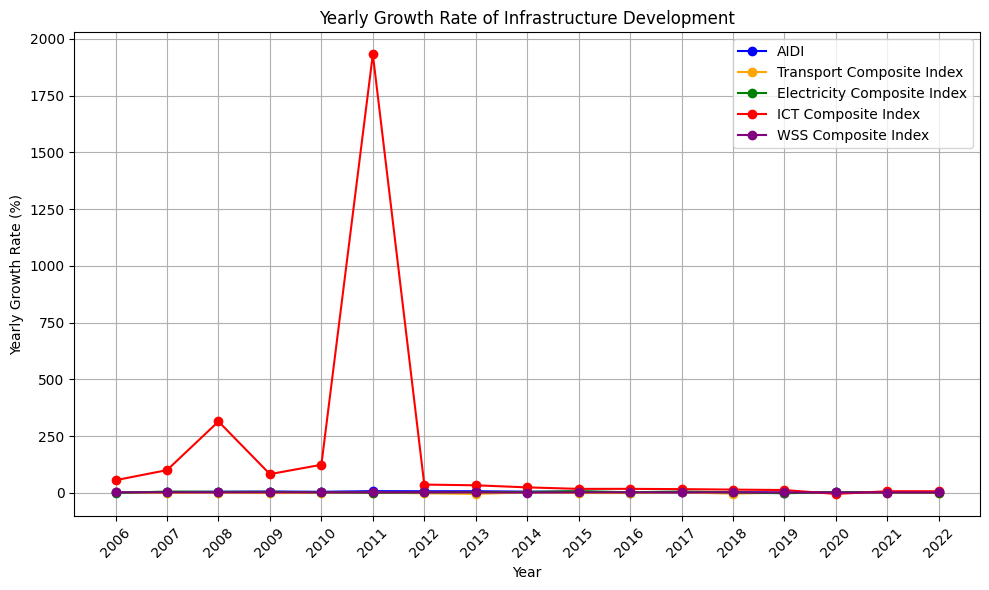

In [ ]:
# Compute yearly growth rate for each dataset
yearly_growth_rates = {}
for name, trend in mean_trends_df.items():
    growth_rate = trend.pct_change() * 100  # Compute percentage change from previous year
    yearly_growth_rates[name] = growth_rate.dropna()  # Drop NaN values

# Plot the yearly growth rates
plt.figure(figsize=(10, 6))

# Define unique colors for each dataset
colors = ['blue', 'orange', 'green', 'red', 'purple']

for i, (name, growth_rate) in enumerate(yearly_growth_rates.items()):
    plt.plot(growth_rate.index, growth_rate.values, label=name, color=colors[i], marker='o')

plt.title('Yearly Growth Rate of Infrastructure Development')
plt.xlabel('Year')
plt.ylabel('Yearly Growth Rate (%)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Yearly Growth each Index

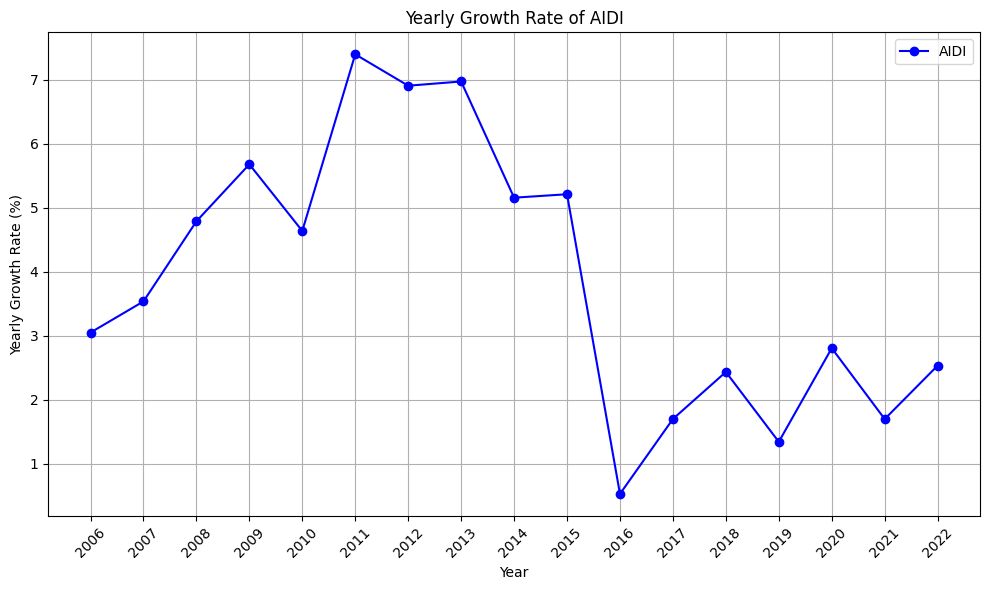

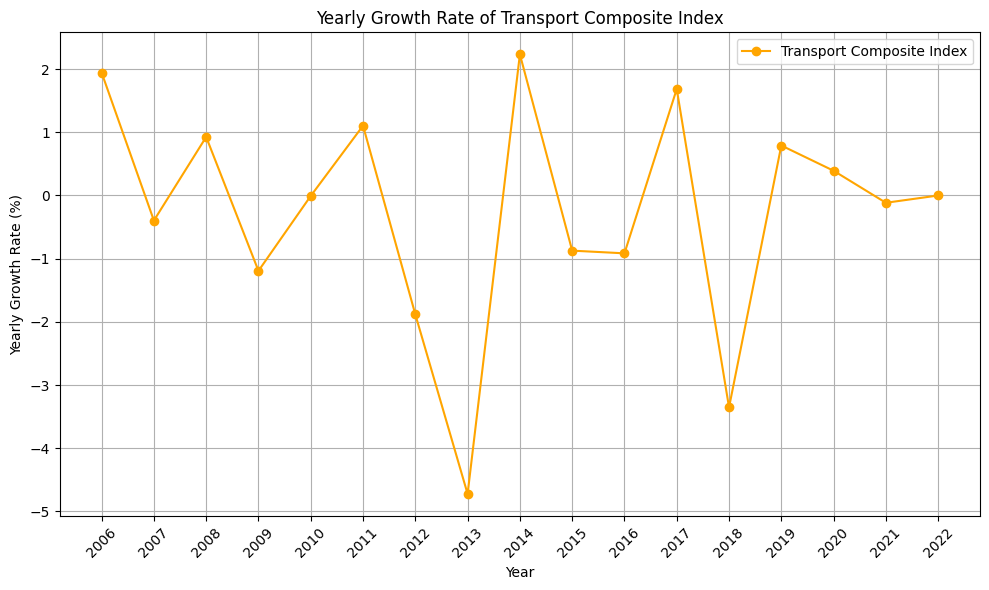

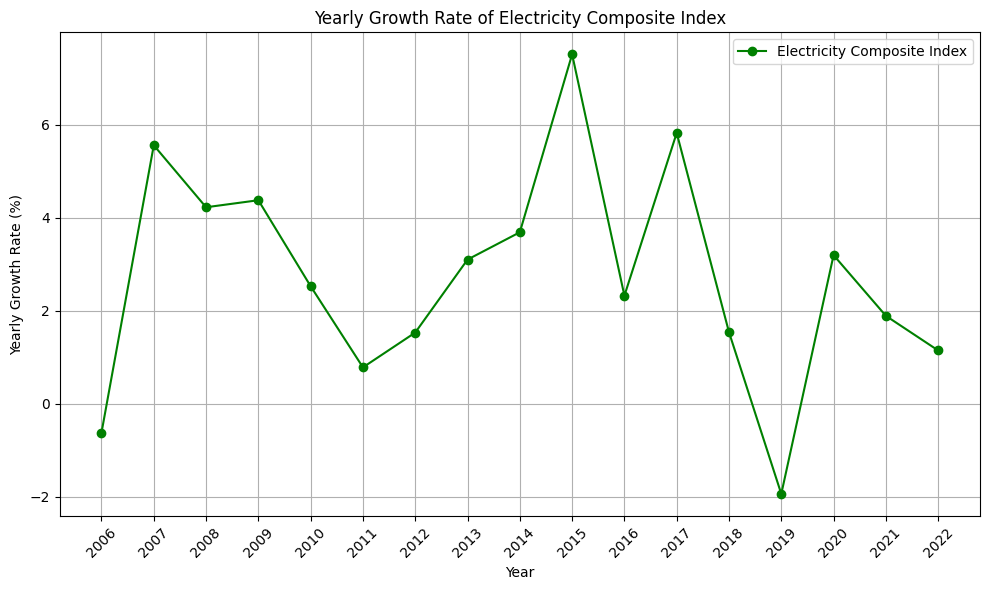

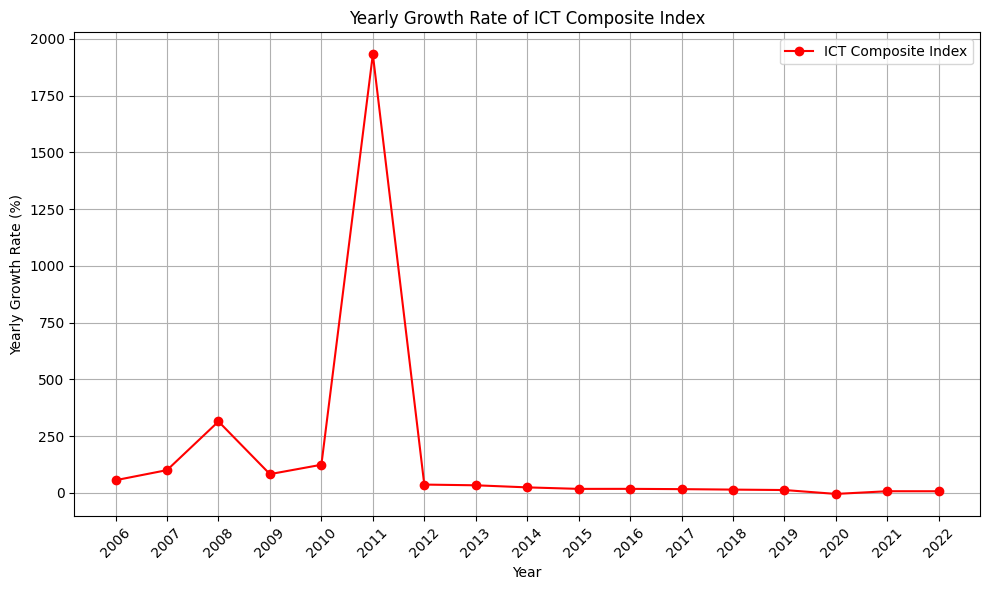

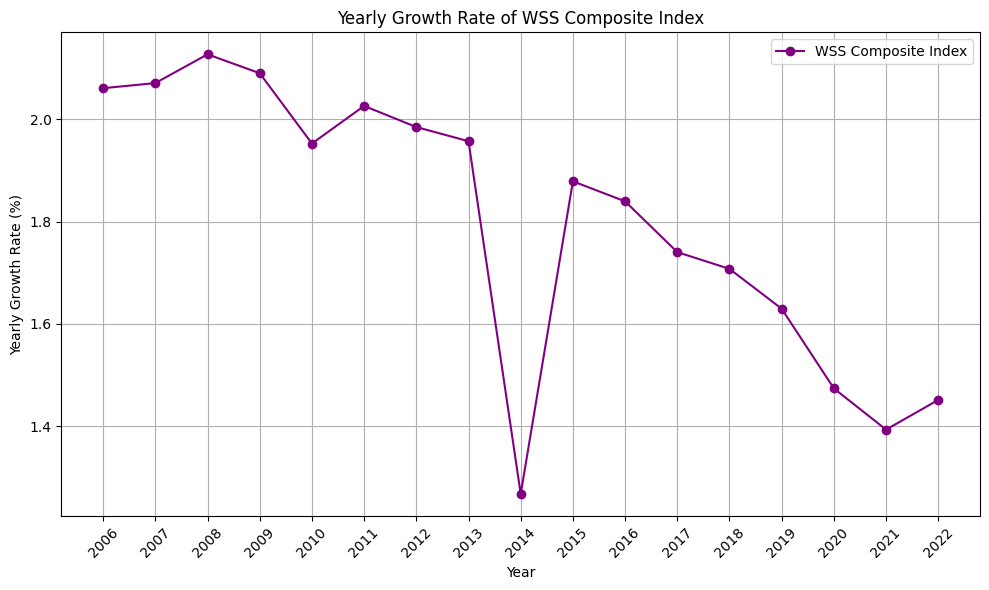

In [ ]:
# Define colors for each dataset
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Plot each dataset's yearly growth rate separately
for i, (name, growth_rate) in enumerate(yearly_growth_rates.items()):
    plt.figure(figsize=(10, 6))
    plt.plot(growth_rate.index, growth_rate.values, label=name, color=colors[i % len(colors)], marker='o')
    plt.title(f'Yearly Growth Rate of {name}')
    plt.xlabel('Year')
    plt.ylabel('Yearly Growth Rate (%)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## De-stat Mean Distribution Plot

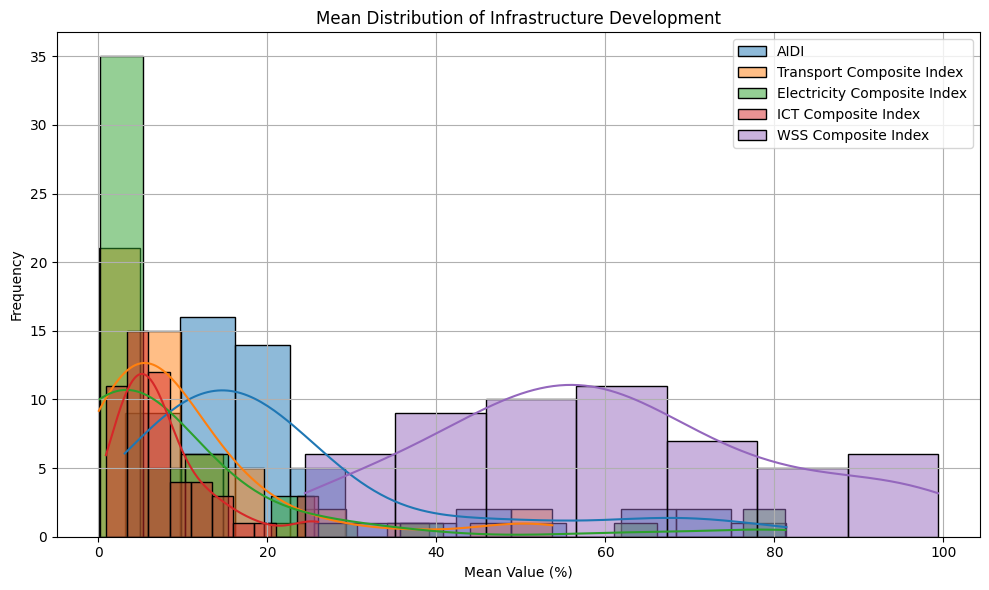

In [ ]:
# Compute mean values for each dataset (excluding the first column)
mean_values = {
    'AIDI': aidi.iloc[:, 1:].mean(axis=1),
    'Transport Composite Index': tci.iloc[:, 1:].mean(axis=1),
    'Electricity Composite Index': eci.iloc[:, 1:].mean(axis=1),
    'ICT Composite Index': ici.iloc[:, 1:].mean(axis=1),
    'WSS Composite Index': wssci.iloc[:, 1:].mean(axis=1)
}

# Convert mean values into a DataFrame
mean_values_df = pd.DataFrame(mean_values)

# Plot the mean distribution
plt.figure(figsize=(10, 6))

for name, values in mean_values_df.items():
    sns.histplot(values, kde=True, label=name)

plt.title('Mean Distribution of Infrastructure Development')
plt.xlabel('Mean Value (%)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


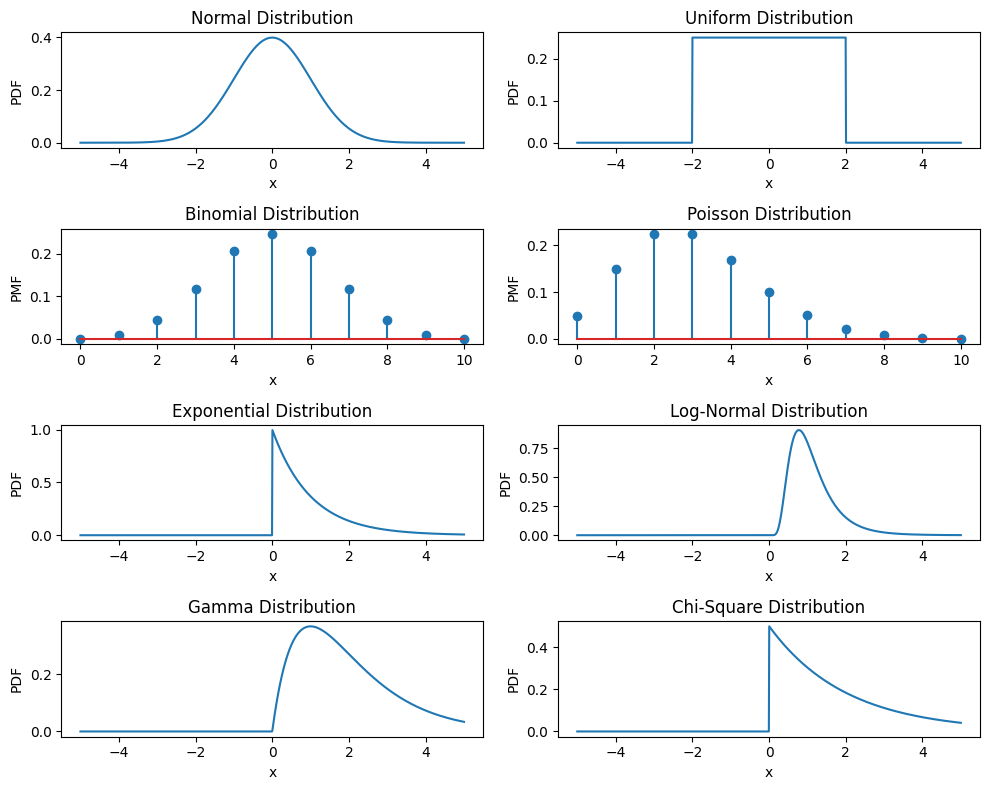

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, uniform, binom, poisson, expon, lognorm, gamma, chi2

# Generate data for each distribution
x = np.linspace(-5, 5, 1000)  # Range for normal distribution
uniform_data = uniform.pdf(x, loc=-2, scale=4)
normal_data = norm.pdf(x, loc=0, scale=1)
binomial_data = binom.pmf(np.arange(0, 11), 10, 0.5)
poisson_data = poisson.pmf(np.arange(0, 11), mu=3)
exponential_data = expon.pdf(x, loc=0, scale=1)
lognormal_data = lognorm.pdf(x, s=0.5, loc=0, scale=1)
gamma_data = gamma.pdf(x, a=2, loc=0, scale=1)
chi2_data = chi2.pdf(x, df=2)

# Plot each distribution
plt.figure(figsize=(10, 8))

# Normal Distribution
plt.subplot(4, 2, 1)
plt.plot(x, normal_data)
plt.title('Normal Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

# Uniform Distribution
plt.subplot(4, 2, 2)
plt.plot(x, uniform_data)
plt.title('Uniform Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

# Binomial Distribution
plt.subplot(4, 2, 3)
plt.stem(np.arange(0, 11), binomial_data)
plt.title('Binomial Distribution')
plt.xlabel('x')
plt.ylabel('PMF')

# Poisson Distribution
plt.subplot(4, 2, 4)
plt.stem(np.arange(0, 11), poisson_data)
plt.title('Poisson Distribution')
plt.xlabel('x')
plt.ylabel('PMF')

# Exponential Distribution
plt.subplot(4, 2, 5)
plt.plot(x, exponential_data)
plt.title('Exponential Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

# Log-Normal Distribution
plt.subplot(4, 2, 6)
plt.plot(x, lognormal_data)
plt.title('Log-Normal Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

# Gamma Distribution
plt.subplot(4, 2, 7)
plt.plot(x, gamma_data)
plt.title('Gamma Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

# Chi-Square Distribution
plt.subplot(4, 2, 8)
plt.plot(x, chi2_data)
plt.title('Chi-Square Distribution')
plt.xlabel('x')
plt.ylabel('PDF')

plt.tight_layout()
plt.show()


## Other Distribution

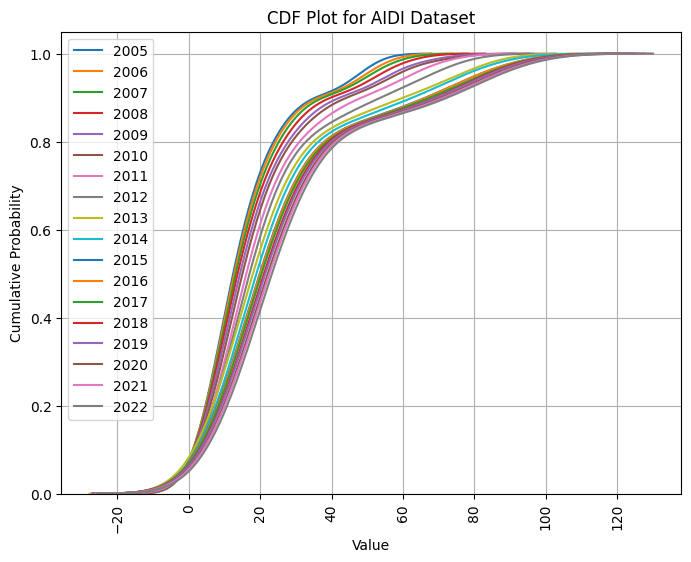

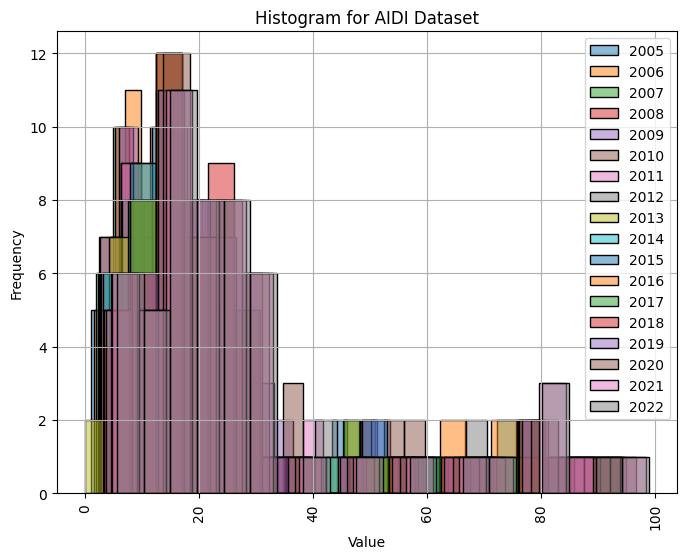

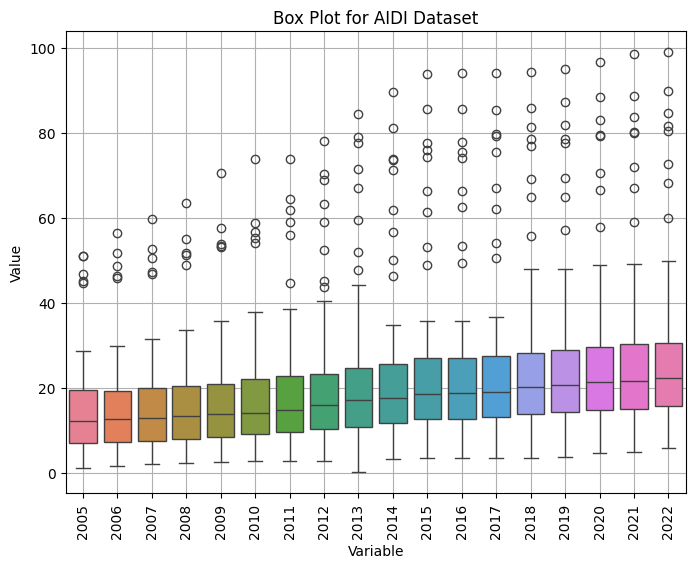

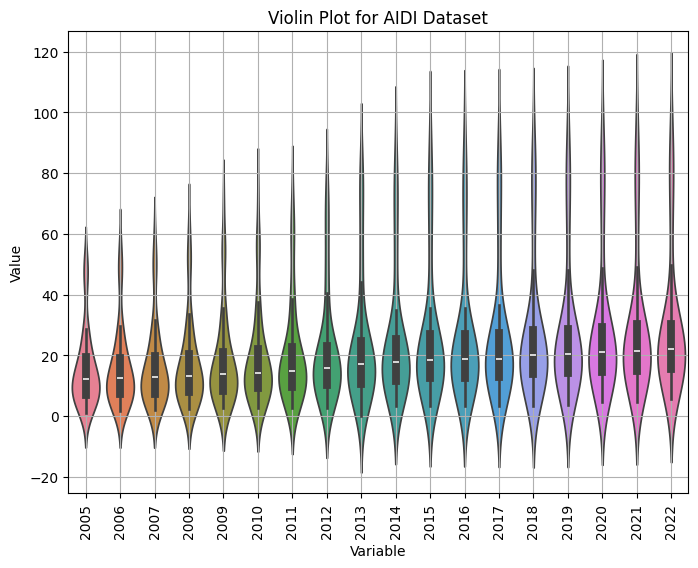

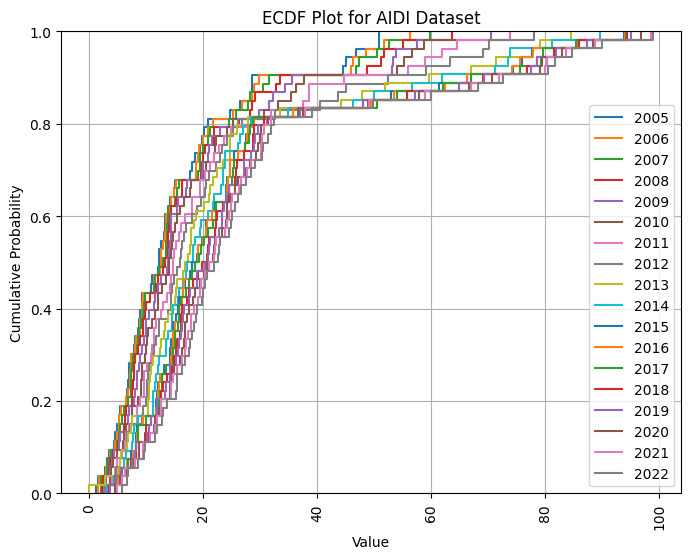

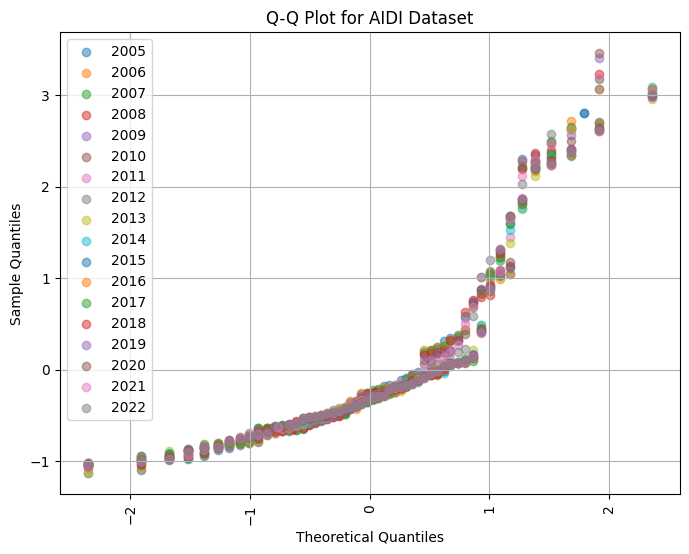

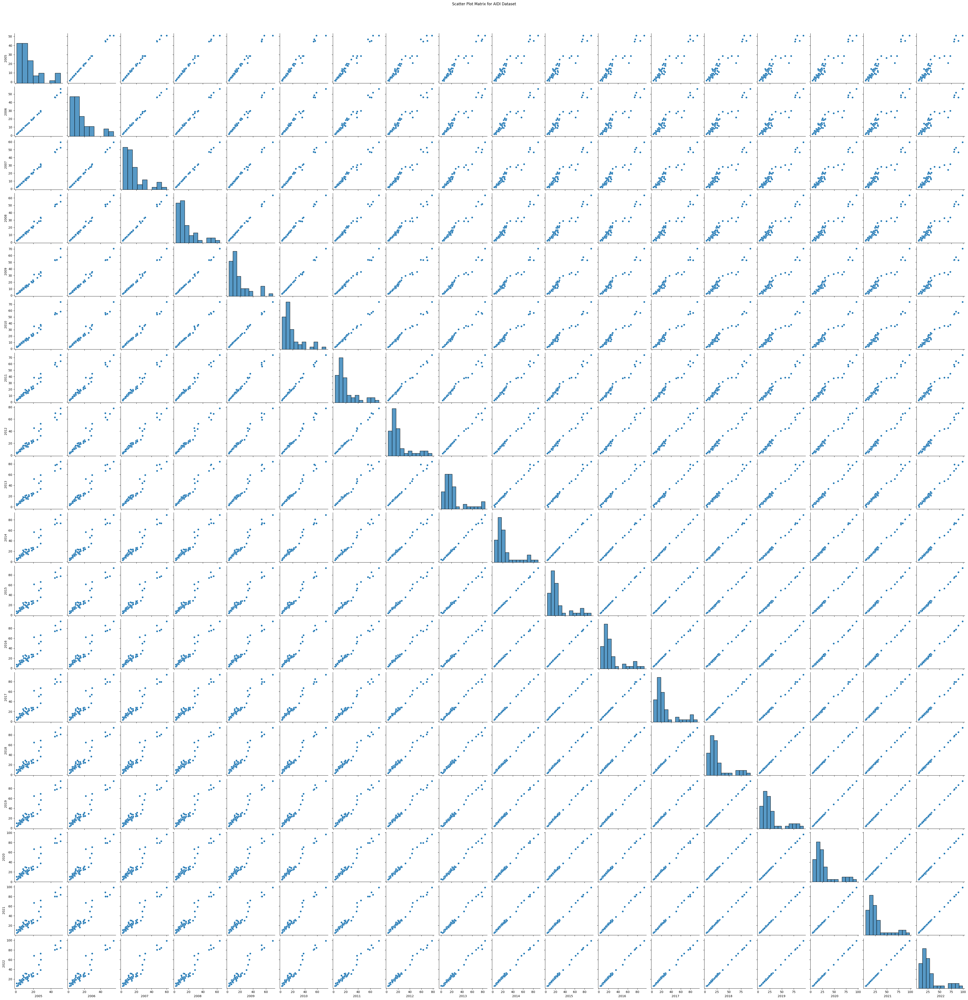

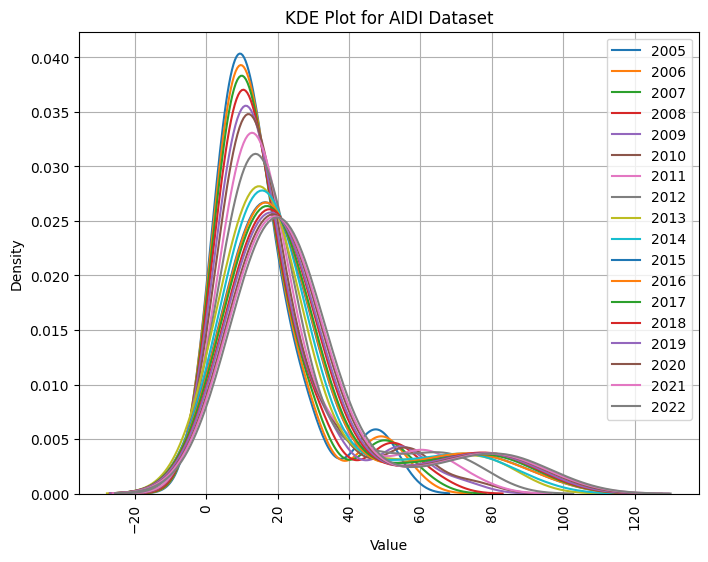

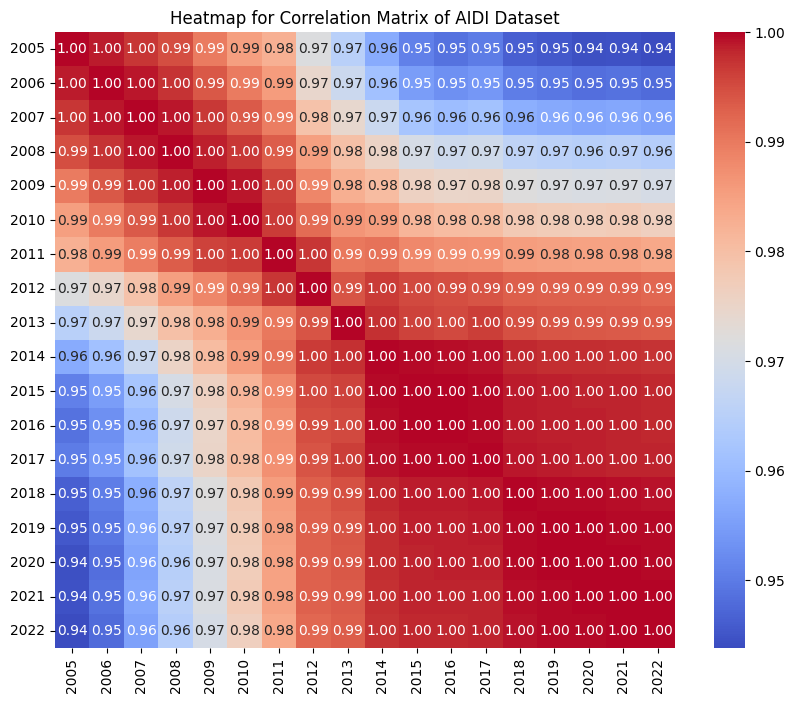

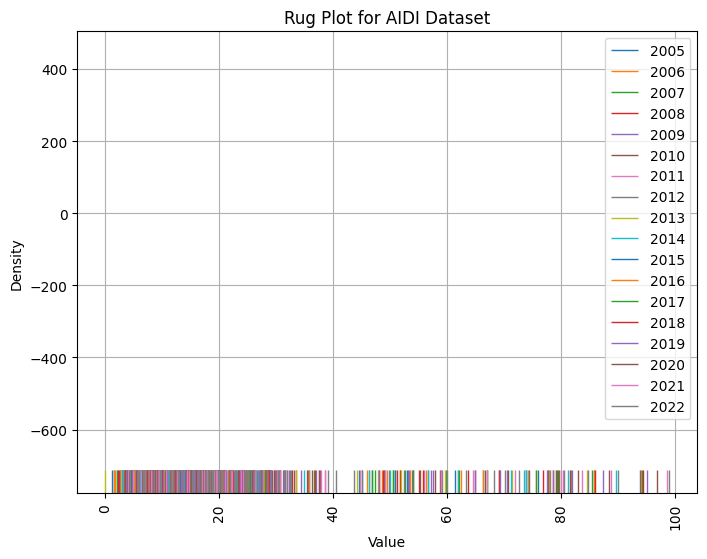

In [ ]:
# Selecting data for visualization (excluding the first column)
data = aidi.drop(columns=['Country'])

# Cumulative Distribution Function (CDF) Plot
plt.figure(figsize=(8, 6))
for column in data.columns:
    sns.kdeplot(data[column], cumulative=True, label=column)
plt.title('CDF Plot for AIDI Dataset')
plt.xlabel('Value')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Histogram
plt.figure(figsize=(8, 6))
for column in data.columns:
    sns.histplot(data[column], bins=20, kde=False, label=column, alpha=0.5)
plt.title('Histogram for AIDI Dataset')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=data)
plt.title('Box Plot for AIDI Dataset')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=data)
plt.title('Violin Plot for AIDI Dataset')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Empirical Cumulative Distribution Function (ECDF) Plot
plt.figure(figsize=(8, 6))
for column in data.columns:
    sns.ecdfplot(data=data[column], label=column)
plt.title('ECDF Plot for AIDI Dataset')
plt.xlabel('Value')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Probability Plot (Q-Q Plot)
plt.figure(figsize=(8, 6))
for column in data.columns:
    norm_data = (data[column] - data[column].mean()) / data[column].std()  # Standardizing data for Q-Q plot
    norm_prob = norm.ppf((data[column].rank() - 0.5) / len(data[column]))  # Theoretical quantiles
    plt.scatter(norm_prob, norm_data, label=column, alpha=0.5)
plt.title('Q-Q Plot for AIDI Dataset')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Scatter Plot Matrix
sns.pairplot(data)
plt.suptitle('Scatter Plot Matrix for AIDI Dataset', y=1.02)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Kernel Density Estimate (KDE) Plot
plt.figure(figsize=(8, 6))
for column in data.columns:
    sns.kdeplot(data[column], label=column)
plt.title('KDE Plot for AIDI Dataset')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap for Correlation Matrix of AIDI Dataset')
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()

# Rug Plot
plt.figure(figsize=(8, 6))
for column in data.columns:
    sns.rugplot(data[column], height=0.05, label=column)
plt.title('Rug Plot for AIDI Dataset')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis tick labels to 90 degrees
plt.show()


# Dataset Mean Integration

In [ ]:
import pandas as pd

def add_mean_column(df, column_name):
    # Calculate the mean for each country from 2005 to 2022 and round to 2 decimal places
    df[column_name] = df.iloc[:, 1:].mean(axis=1).round(2)
    return df

def create_combined_dataset(datasets, mean_column_names):
    combined_df = pd.DataFrame()
    combined_df['Country'] = datasets[0]['Country']

    for df, column_name in zip(datasets, mean_column_names):
        combined_df[column_name] = df[column_name]

    return combined_df

# Apply the function to each dataset with custom mean column names
aidi_m = add_mean_column(aidi, 'aidi_mean%')
tci_m = add_mean_column(tci, 'tci_mean%')
eci_m = add_mean_column(eci, 'eci_mean%')
ici_m = add_mean_column(ici, 'ici_mean%')
wssci_m = add_mean_column(wssci, 'wssci_mean%')

# Create the combined dataset
datasets = [aidi_m, tci_m, eci_m, ici_m, wssci_m]
mean_column_names = ['aidi_mean%', 'tci_mean%', 'eci_mean%', 'ici_mean%', 'wssci_mean%']

combined_df = create_combined_dataset(datasets, mean_column_names)

# Display the combined dataset to verify
print(combined_df.head())


        Country  aidi_mean%  tci_mean%  eci_mean%  ici_mean%  wssci_mean%
0       Algeria       45.63      18.11      22.83      14.64        96.03
1        Angola       14.63       2.55       3.91       5.16        54.67
2         Benin       13.19       5.38       0.38       5.88        47.84
3      Botswana       33.52      25.51      12.12      12.99        85.53
4  Burkina Faso       15.20      11.77       0.93       4.70        51.50


In [ ]:
aidi_m.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,aidi_mean%
0,Algeria,28.55,28.96,30.43,32.73,34.31,36.29,38.57,43.69,47.78,49.91,52.99,53.39,54.04,55.79,57.08,57.87,58.91,60.00,45.63
1,Angola,7.96,8.17,8.54,9.41,10.41,11.50,12.58,13.75,14.99,16.39,16.83,16.46,17.48,19.04,18.88,20.07,20.20,20.65,14.63


## SID-Analysis

### Shape

In [ ]:
combined_df.shape

(54, 6)

### Info

In [ ]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Country      54 non-null     object 
 1   aidi_mean%   54 non-null     float64
 2   tci_mean%    54 non-null     float64
 3   eci_mean%    54 non-null     float64
 4   ici_mean%    54 non-null     float64
 5   wssci_mean%  54 non-null     float64
dtypes: float64(5), object(1)
memory usage: 2.7+ KB


### De-Stats

In [ ]:
combined_df.describe()

,aidi_mean%,tci_mean%,eci_mean%,ici_mean%,wssci_mean%
count,54.000000,54.000000,54.000000,54.000000,54.000000
mean,22.719630,10.667593,9.750000,7.812222,59.967778
std,18.877855,12.153989,17.489078,5.917510,19.970437
min,3.130000,0.070000,0.180000,0.910000,24.450000
25%,11.122500,3.122500,1.095000,4.150000,45.510000
50%,17.065000,6.565000,3.300000,6.115000,57.640000
75%,24.002500,12.370000,10.745000,9.285000,71.275000
max,81.430000,53.740000,81.310000,26.010000,99.370000


<Figure size 1000x800 with 0 Axes>

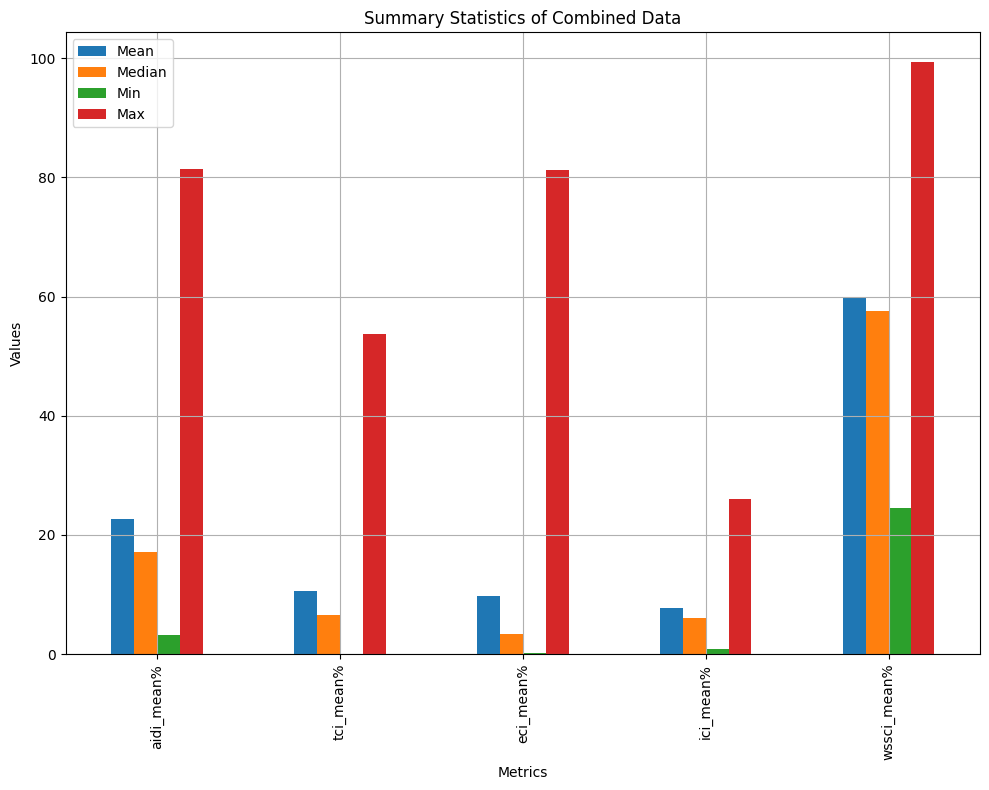

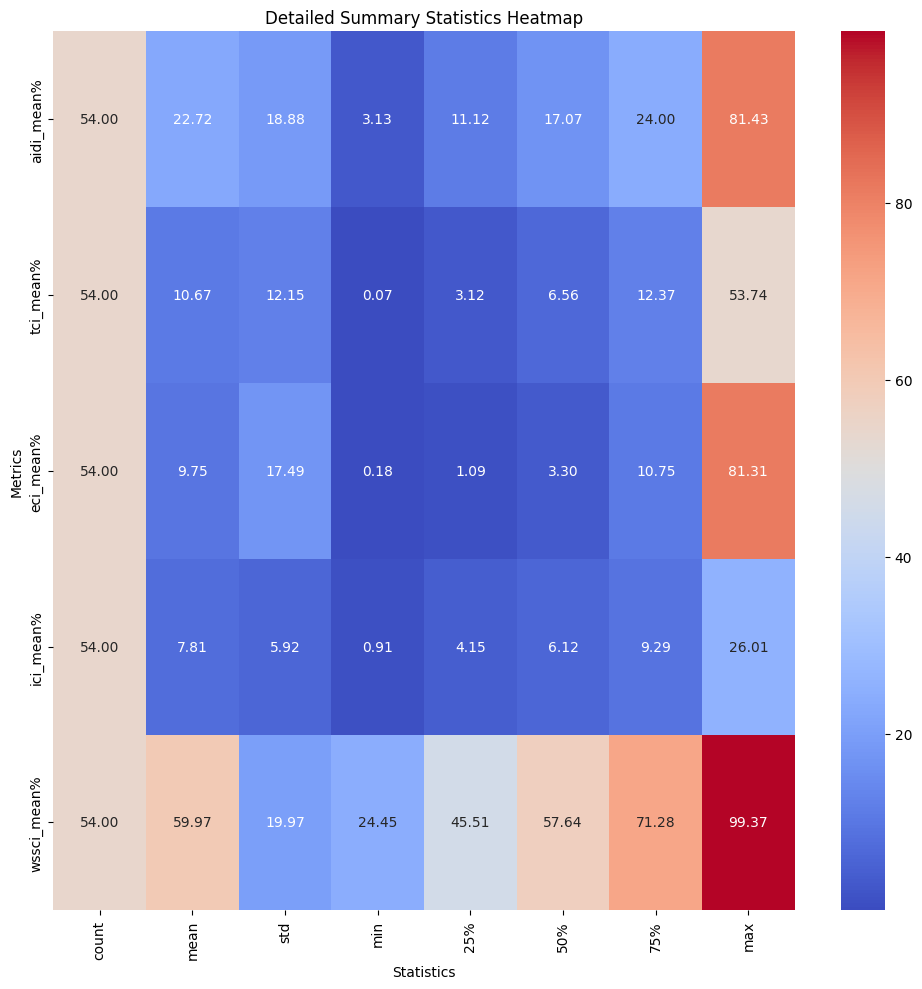

In [ ]:
# Function to visualize summary statistics
def visualize_summary_statistics(df):
    summary_stats = df.describe().transpose()

    plt.figure(figsize=(10, 8))

    # Plot mean, median, min, and max
    summary_stats[['mean', '50%', 'min', 'max']].plot(kind='bar', figsize=(10, 8))

    plt.title('Summary Statistics of Combined Data')
    plt.xlabel('Metrics')
    plt.ylabel('Values')
    plt.xticks(rotation=90)
    plt.legend(['Mean', 'Median', 'Min', 'Max'])
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Heatmap for a detailed view
    plt.figure(figsize=(10, 10))
    sns.heatmap(summary_stats, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Detailed Summary Statistics Heatmap')
    plt.xlabel('Statistics')
    plt.ylabel('Metrics')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()



# Visualize the summary statistics
visualize_summary_statistics(combined_df)


### Other Visuals

#### Correlation Heatmap

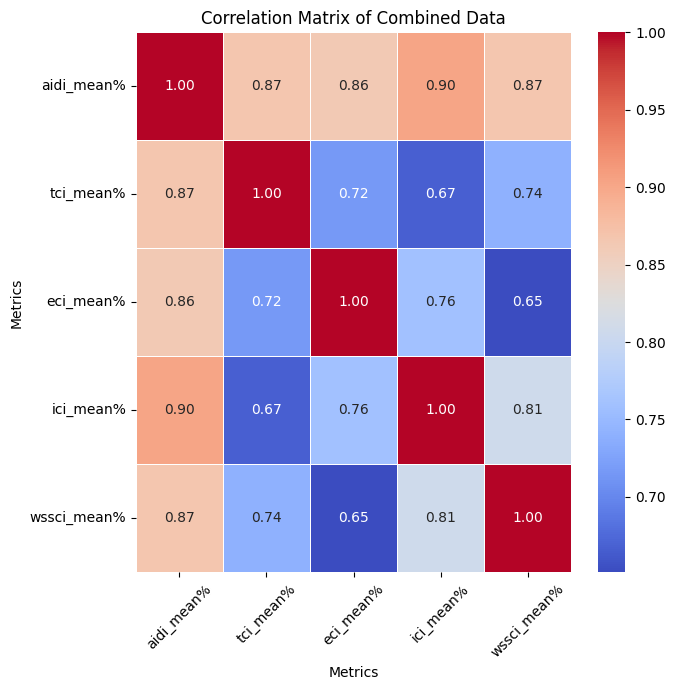

In [ ]:
# Drop the first column ('Country')
combined_df_dropped = combined_df.drop(columns=['Country'])

# Compute the correlation matrix
corr_matrix = combined_df_dropped.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(7, 7))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Combined Data')
plt.xlabel('Metrics')
plt.ylabel('Metrics')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


#### Bar Plot

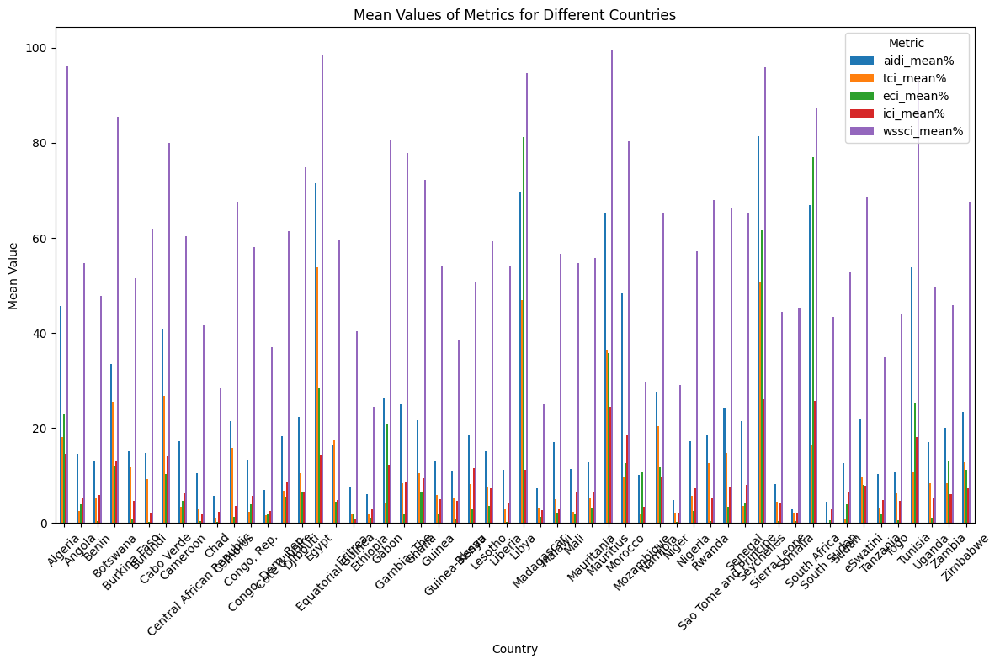

In [ ]:
# Plot mean values of each metric for different countries
combined_df.set_index('Country').plot(kind='bar', figsize=(12, 8))
plt.title('Mean Values of Metrics for Different Countries')
plt.xlabel('Country')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)
plt.legend(title='Metric')
plt.tight_layout()
plt.show()


#### Box Plot

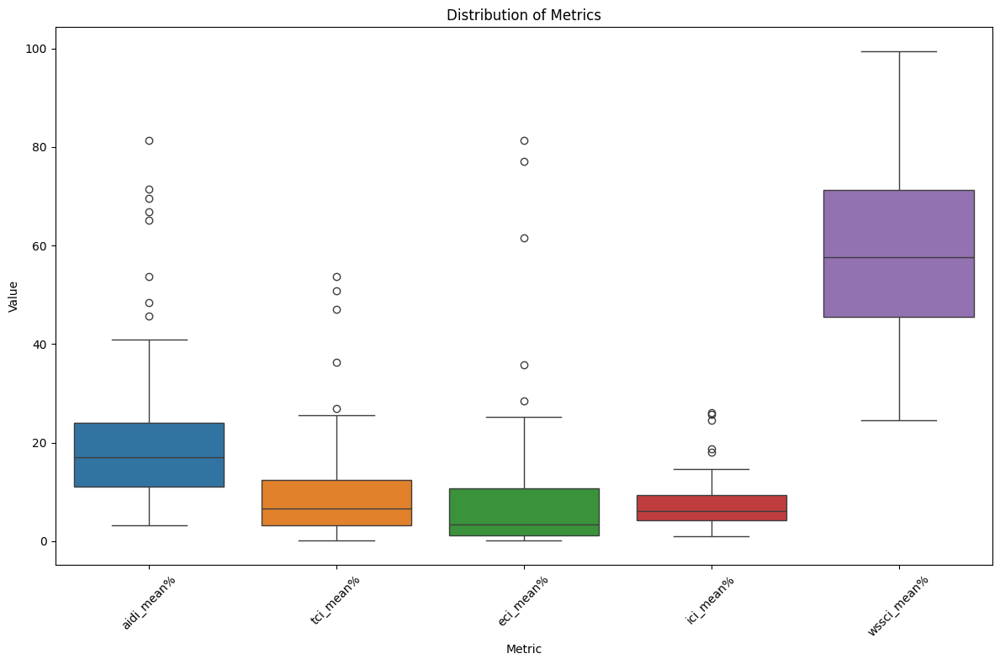

In [ ]:
# Box plot for each metric
plt.figure(figsize=(12, 8))
sns.boxplot(data=combined_df)
plt.title('Distribution of Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Pair Plot

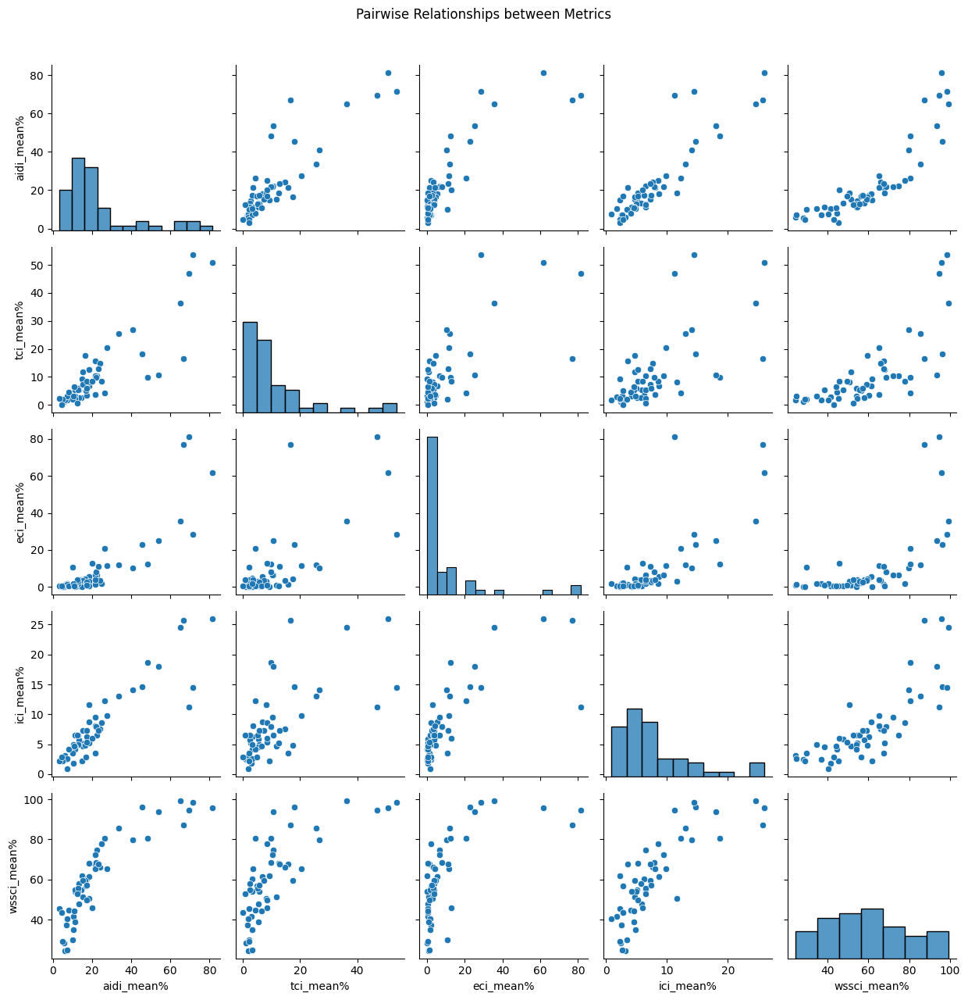

In [ ]:
# Pair plot to visualize pairwise relationships
sns.pairplot(combined_df)
plt.suptitle('Pairwise Relationships between Metrics', y=1.02)
plt.tight_layout()
plt.show()


#### Violin Plot

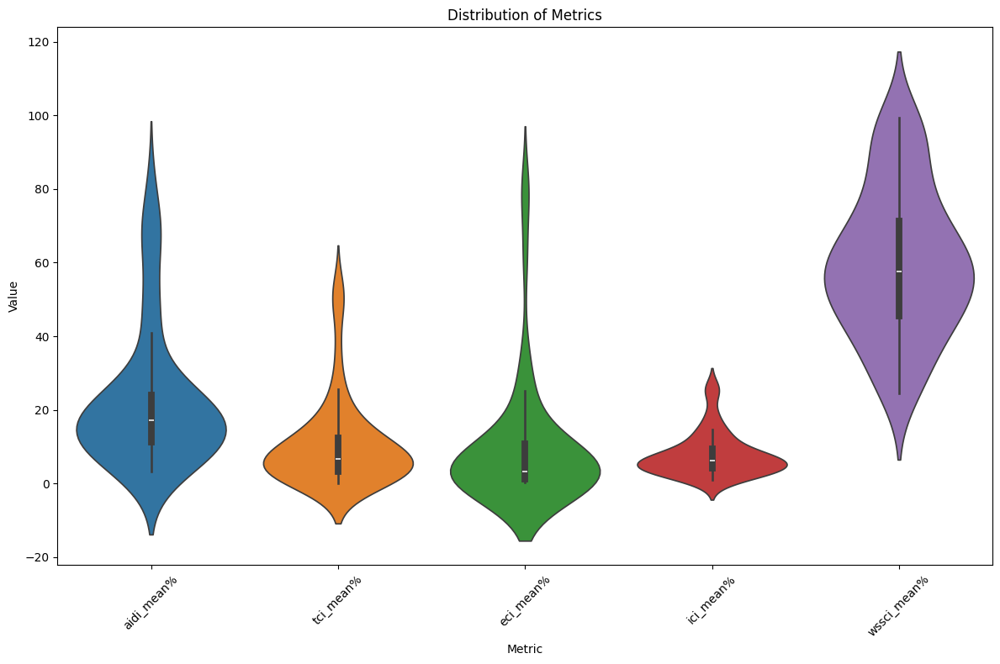

In [ ]:
# Violin plot for each metric
plt.figure(figsize=(12, 8))
sns.violinplot(data=combined_df)
plt.title('Distribution of Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Histogram

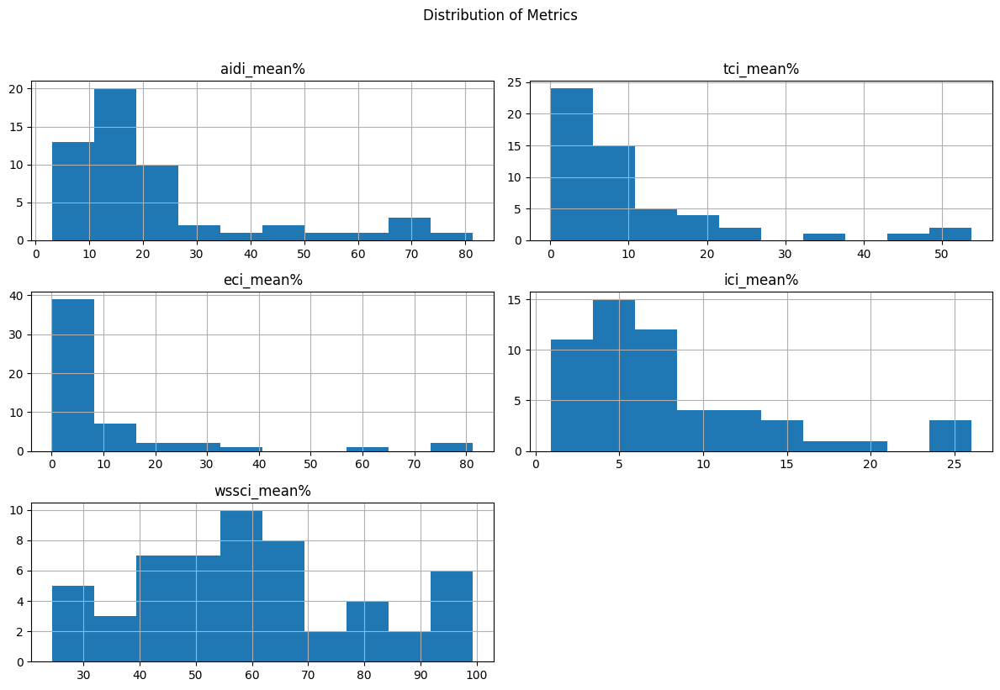

In [ ]:
# Histogram for each metric
combined_df.hist(figsize=(12, 8), bins=10)
plt.suptitle('Distribution of Metrics', y=1.02)
plt.tight_layout()
plt.show()


#### Skewness

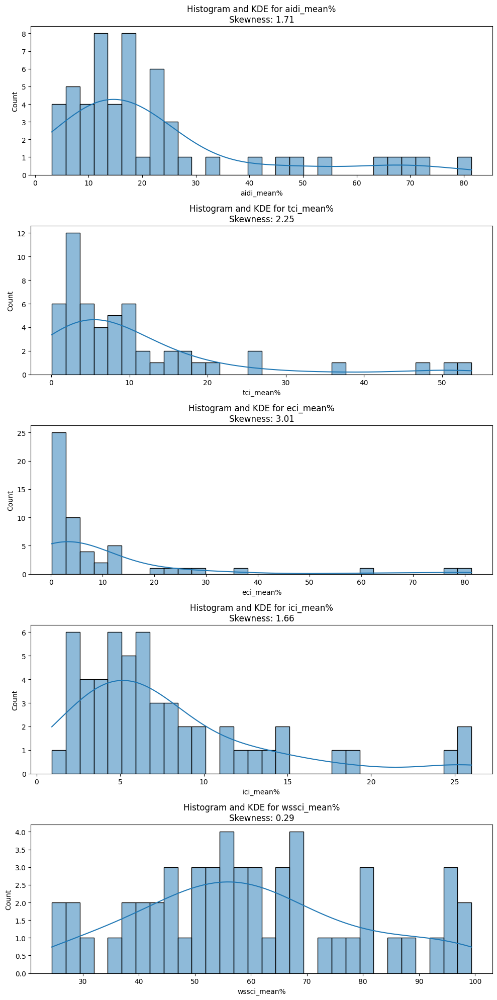

In [ ]:
# Slice the DataFrame to remove the first column
dff = combined_df.iloc[:, 1:]

# Drop rows with NaN values to clean the dataset
df_cleaned = dff.dropna()

# Calculate skewness for each numerical column
skewness = df_cleaned.skew()

# Plotting histograms for each column
num_columns = df_cleaned.shape[1]
fig, axes = plt.subplots(nrows=num_columns, ncols=1, figsize=(10, num_columns * 4))

for i, column in enumerate(df_cleaned.columns):
    sns.histplot(df_cleaned[column], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram and KDE for {column}\nSkewness: {skewness[column]:.2f}')
    axes[i].set_xlabel(column)

plt.tight_layout()
plt.show()


Skew Values

In [ ]:
#Slice column[0] removing the countntries
combined_df_sliced = combined_df.iloc[:, 1:]

# Calculate skewness for each numerical column
skewness = combined_df_sliced.skew()

print(skewness)

aidi_mean%     1.710034
tci_mean%      2.251849
eci_mean%      3.014458
ici_mean%      1.664714
wssci_mean%    0.286737
dtype: float64


#### Metric Trend by Country

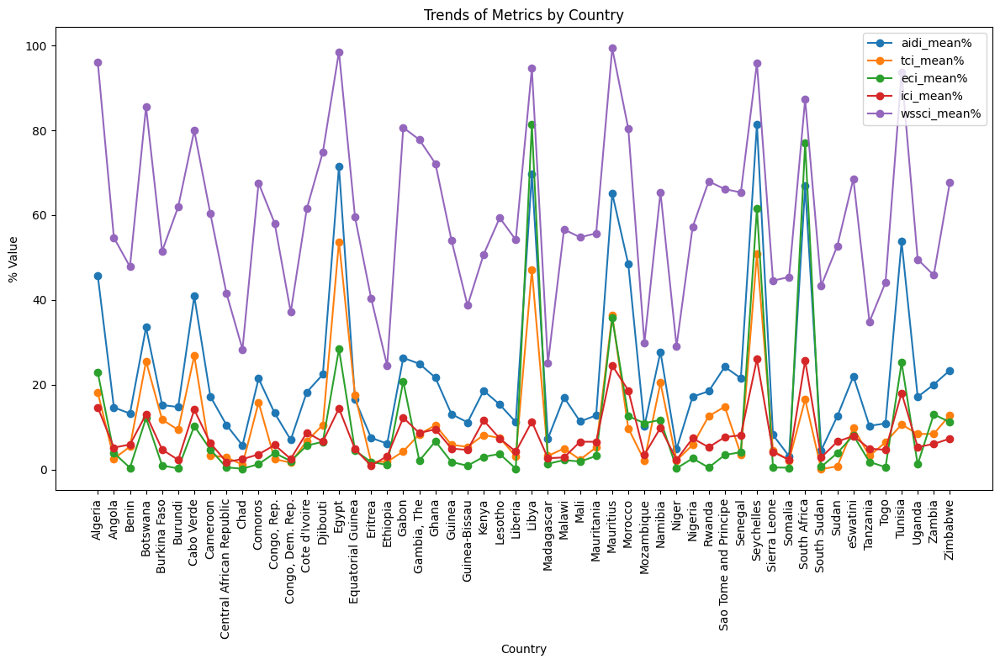

In [ ]:
# Line plot for each metric
plt.figure(figsize=(12, 8))
for column in combined_df.columns:
    if column != 'Country':
        plt.plot(combined_df['Country'], combined_df[column], marker='o', label=column)

plt.title('Trends of Metrics by Country')
plt.xlabel('Country')
plt.ylabel('% Value')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


#### Scatter Plot Matrix

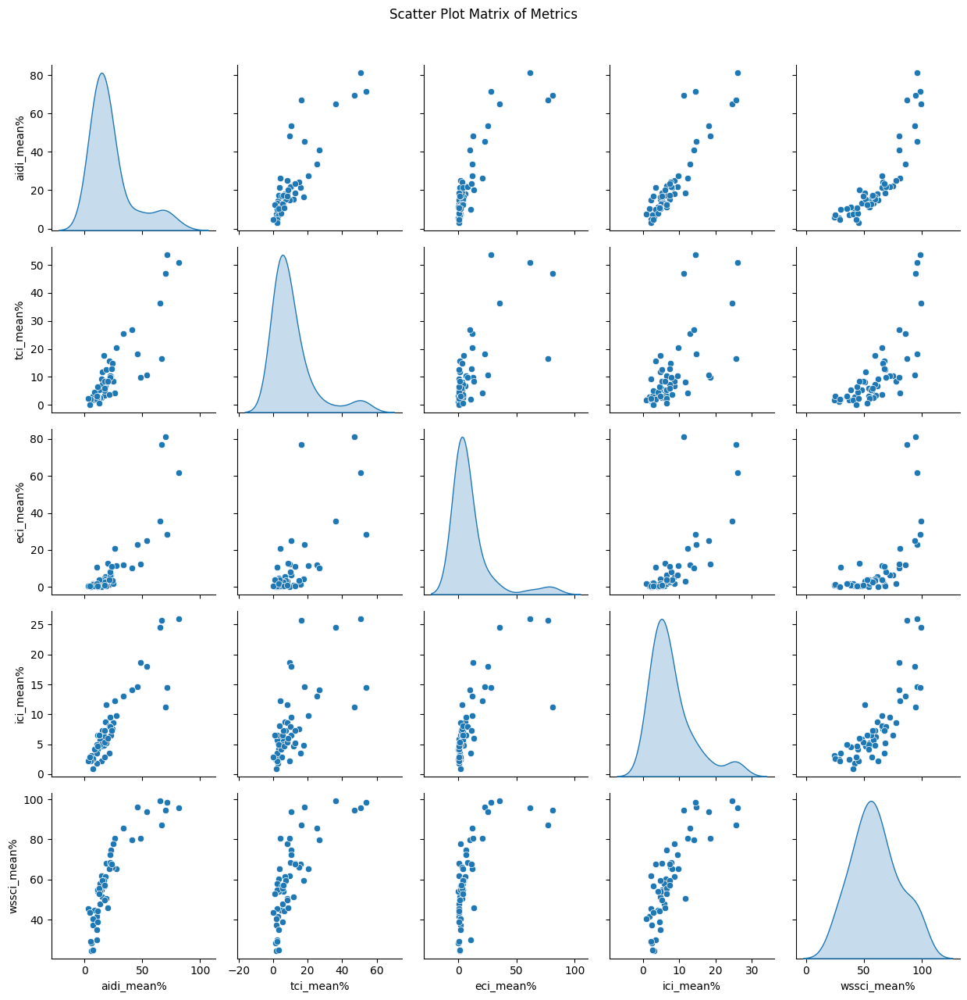

In [ ]:
# Scatter plot matrix
sns.pairplot(combined_df.drop(columns=['Country']), diag_kind='kde')
plt.suptitle('Scatter Plot Matrix of Metrics', y=1.02)
plt.tight_layout()
plt.show()


#### Area Plot

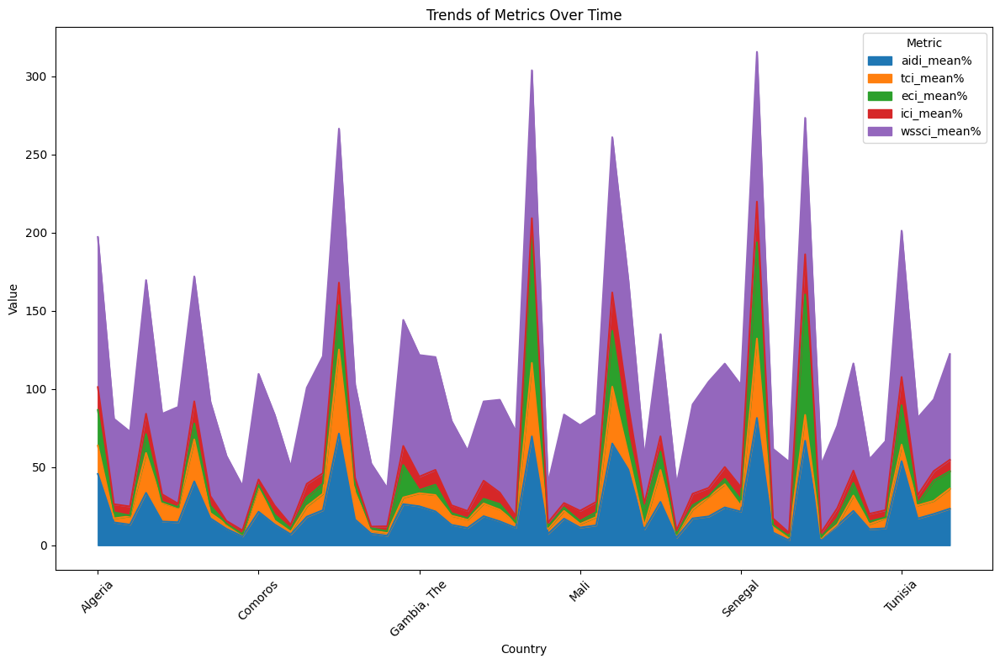

In [ ]:
# Area plot for each metric
combined_df.set_index('Country').plot(kind='area', figsize=(12, 8))
plt.title('Trends of Metrics Over Time')
plt.xlabel('Country')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='Metric')
plt.tight_layout()
plt.show()


#### Radar Chart

NameError: name 'radar_chart' is not defined

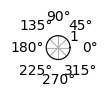

In [ ]:
# Radar chart for each country
num_countries = len(combined_df)
num_cols = 2
num_rows = (num_countries + num_cols - 1) // num_cols

plt.figure(figsize=(15, 10))
for i, row in combined_df.iterrows():
    ax = plt.subplot(num_rows, num_cols, i+1, polar=True)
    # Extract metrics and values excluding the 'Country' column
    metrics = combined_df.columns[1:]
    values = row[1:].values.tolist() + [row[1:].values[0]]  # Add the first value again to complete the loop
    radar_chart(ax, metrics, values, color='b')
    ax.set_title(row['Country'])

plt.tight_layout()
plt.show()


Nigeria

In [ ]:
# Radar chart for Nigeria
plt.figure(figsize=(6, 6))
for i, row in combined_df.iterrows():
    if row['Country'] == 'Nigeria':
        ax = plt.subplot(111, polar=True)
        # Extract metrics and values excluding the 'Country' column
        metrics = combined_df.columns[1:]
        values = row[1:].values.tolist() + [row[1:].values[0]]  # Add the first value again to complete the loop
        radar_chart(ax, metrics, values, color='b')
        ax.set_title(row['Country'])
        break  # Stop iteration after finding Nigeria

plt.tight_layout()
plt.show()


In [ ]:
# Radar chart for Nigeria
plt.figure(figsize=(6, 6))
for i, row in combined_df.iterrows():
    if row['Country'] == 'Ghana':
        ax = plt.subplot(111, polar=True)
        # Extract metrics and values excluding the 'Country' column
        metrics = combined_df.columns[1:]
        values = row[1:].values.tolist() + [row[1:].values[0]]  # Add the first value again to complete the loop
        radar_chart(ax, metrics, values, color='b')
        ax.set_title(row['Country'])
        break  # Stop iteration after finding Nigeria

plt.tight_layout()
plt.show()

# Weights Prediction

General Steps to Calculate the AIDI

1.
Data Collection: Gather data for each infrastructure sector represented by the composite indices (Transport, Electricity, ICT, and Water and Sanitation).

2.
Normalization: Normalize the data for each composite index to ensure they are on a comparable scale. This often involves scaling the values to a range between 0 and 1.

3.
Weighting: Assign weights to each composite index based on their importance or contribution to overall infrastructure development. The sum of all weights should equal 1.

4.
Aggregation: Combine the weighted indices to compute the overall AIDI.

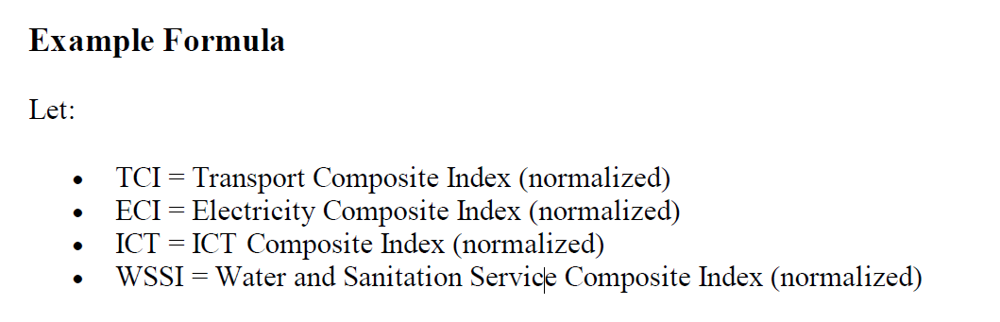

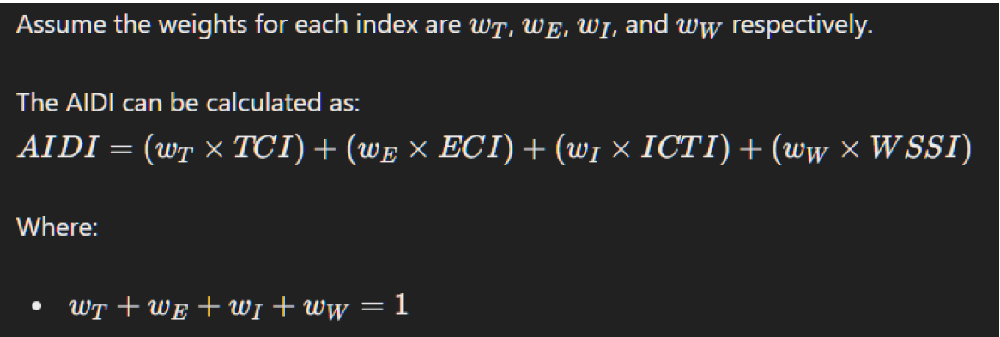

In [ ]:
# Combined_df to csv
combined_df.to_csv('combined_dfCountry-aidi_mean%-tci_mean%-eci_mean%-ici_mean%-wssci_mean%.csv', index=False)

In [ ]:
combined_df.head()

In [ ]:
combined_df.columns

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt


## Create DataFrame
df = combined_df

# Independent variables
X = df[['tci_mean%', 'eci_mean%', 'ici_mean%',
       'wssci_mean%']]

# Dependent variable
y = df['aidi_mean%']

# Linear regression model
linear_model = LinearRegression()
linear_model.fit(X, y)
linear_y_pred = linear_model.predict(X)
linear_weights = linear_model.coef_

# Polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Polynomial regression model
poly_model = LinearRegression()
poly_model.fit(X_poly, y)
poly_y_pred = poly_model.predict(X_poly)
poly_weights = poly_model.coef_

# Evaluation metrics
metrics = {
    'Model': ['Linear', 'Polynomial'],
    'MAE': [
        mean_absolute_error(y, linear_y_pred),
        mean_absolute_error(y, poly_y_pred)
    ],
    'MSE': [
        mean_squared_error(y, linear_y_pred),
        mean_squared_error(y, poly_y_pred)
    ],
    'R2': [
        r2_score(y, linear_y_pred),
        r2_score(y, poly_y_pred)
    ]
}

metrics_df = pd.DataFrame(metrics)

# Weights DataFrame
linear_weights_df = pd.DataFrame({
    'Feature': ['tci_mean%', 'eci_mean%', 'ici_mean%','wssci_mean%'],
    'Linear_Weights': linear_weights
})

poly_features = poly.get_feature_names_out(['tci_mean%', 'eci_mean%', 'ici_mean%','wssci_mean%'])
poly_weights_df = pd.DataFrame({
    'Feature': poly_features,
    'Polynomial_Weights': poly_weights
})

# Plotting
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Linear model weights
axes[0, 0].bar(linear_weights_df['Feature'], linear_weights_df['Linear_Weights'], color='skyblue')
for i, v in enumerate(linear_weights_df['Linear_Weights']):
    axes[0, 0].text(i, v, f"{v:.2f}", ha='center', va='bottom')
axes[0, 0].set_title('Linear Model Weights')
axes[0, 0].set_xlabel('Features')
axes[0, 0].set_ylabel('Weights')

# Polynomial model weights
axes[0, 1].bar(poly_weights_df['Feature'], poly_weights_df['Polynomial_Weights'], color='skyblue')
for i, v in enumerate(poly_weights_df['Polynomial_Weights']):
    axes[0, 1].text(i, v, f"{v:.2f}", ha='center', va='bottom')
axes[0, 1].set_title('Polynomial Model Weights')
axes[0, 1].set_xlabel('Features')
axes[0, 1].set_ylabel('Weights')
axes[0, 1].tick_params(axis='x', rotation=90)

# Actual vs Predicted for Linear model
axes[1, 0].scatter(y, linear_y_pred, color='skyblue')
axes[1, 0].plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
axes[1, 0].set_title('Linear Model: Actual vs Predicted')
axes[1, 0].set_xlabel('Actual')
axes[1, 0].set_ylabel('Predicted')

# Actual vs Predicted for Polynomial model
axes[1, 1].scatter(y, poly_y_pred, color='skyblue')
axes[1, 1].plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
axes[1, 1].set_title('Polynomial Model: Actual vs Predicted')
axes[1, 1].set_xlabel('Actual')
axes[1, 1].set_ylabel('Predicted')

plt.tight_layout()
plt.show()

print("Model Metrics:")
print(metrics_df)
print("\nLinear Model Weights:")
print(linear_weights_df)
print("\nPolynomial Model Weights:")
print(poly_weights_df)


## Modeling & Evaluation

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt



# Create DataFrame
df = combined_df

# Independent variables
X = df[['tci_mean%', 'eci_mean%', 'ici_mean%', 'wssci_mean%']]

# Dependent variable
y = df['aidi_mean%']

# Initialize models
models = {
    'Linear': LinearRegression(),
    'Ridge': Ridge(alpha=1.0, max_iter=10000),
    'Lasso': Lasso(alpha=0.1, max_iter=10000),
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(n_estimators=100),
    'GradientBoosting': GradientBoostingRegressor(n_estimators=100)
}

# Store results
metrics = {'Model': [], 'MAE': [], 'MSE': [], 'R2': []}
weights = {'Feature': ['tci_mean%', 'eci_mean%', 'ici_mean%', 'wssci_mean%']}
predictions = {}

# Train and evaluate models
for name, model in models.items():
    model.fit(X, y)
    y_pred = model.predict(X)
    predictions[name + '_Predictions'] = y_pred
    metrics['Model'].append(name)
    metrics['MAE'].append(mean_absolute_error(y, y_pred))
    metrics['MSE'].append(mean_squared_error(y, y_pred))
    metrics['R2'].append(r2_score(y, y_pred))
    if name in ['Linear', 'Ridge', 'Lasso']:
        weights[name + '_Weights'] = model.coef_
    elif name == 'DecisionTree':
        weights[name + '_Feature_Importance'] = model.feature_importances_
    elif name in ['RandomForest', 'GradientBoosting']:
        weights[name + '_Feature_Importance'] = model.feature_importances_

# Create DataFrames
metrics_df = pd.DataFrame(metrics)
weights_df = pd.DataFrame(weights)
predictions_df = pd.DataFrame(predictions)

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, name in enumerate(models.keys()):
    row, col = divmod(i, 3)
    if name in ['Linear', 'Ridge', 'Lasso']:
        axes[row, col].bar(weights_df['Feature'], weights_df[name + '_Weights'], color='skyblue')
        axes[row, col].set_title(f'{name} Model Weights')
        axes[row, col].set_xlabel('Features')
        axes[row, col].set_ylabel('Weights')
        axes[row, col].tick_params(axis='x', rotation=90)
        for j, v in enumerate(weights_df[name + '_Weights']):
            axes[row, col].text(j, v, f"{v:.2f}", ha='center', va='bottom')
    elif name in ['DecisionTree', 'RandomForest', 'GradientBoosting']:
        axes[row, col].bar(weights_df['Feature'], weights_df[name + '_Feature_Importance'], color='skyblue')
        axes[row, col].set_title(f'{name} Feature Importance')
        axes[row, col].set_xlabel('Features')
        axes[row, col].set_ylabel('Importance')
        axes[row, col].tick_params(axis='x', rotation=90)
        for j, v in enumerate(weights_df[name + '_Feature_Importance']):
            axes[row, col].text(j, v, f"{v:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Plotting actual vs predicted
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, name in enumerate(models.keys()):
    row, col = divmod(i, 3)
    y_pred = predictions_df[name + '_Predictions']
    axes[row, col].scatter(y, y_pred, color='skyblue')
    axes[row, col].plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
    axes[row, col].set_title(f'{name} Model: Actual vs Predicted')
    axes[row, col].set_xlabel('Actual')
    axes[row, col].set_ylabel('Predicted')

plt.tight_layout()
plt.show()

print("Model Metrics:")
print(metrics_df)
print("\nWeights:")
print(weights_df)


## Cross Validation

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# Create DataFrame
df = combined_df

# Independent variables
X = df[['tci_mean%', 'eci_mean%', 'ici_mean%', 'wssci_mean%']]

# Dependent variable
y = df['aidi_mean%']

# Initialize models
models = {
    'Linear': LinearRegression(),
    'Ridge': Ridge(alpha=1.0, max_iter=10000),
    'Lasso': Lasso(alpha=0.1, max_iter=10000),
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(n_estimators=100),
    'GradientBoosting': GradientBoostingRegressor(n_estimators=100)
}

# Store results
metrics = {'Model': [], 'CV_MAE': [], 'CV_MSE': [], 'CV_R2': []}
weights = {}

# Perform cross-validation
for name, model in models.items():
    # Perform cross-validation with 5 folds
    cv_mae = -cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error').mean()
    cv_mse = -cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error').mean()
    cv_r2 = cross_val_score(model, X, y, cv=5, scoring='r2').mean()
    metrics['Model'].append(name)
    metrics['CV_MAE'].append(cv_mae)
    metrics['CV_MSE'].append(cv_mse)
    metrics['CV_R2'].append(cv_r2)

    # Get feature weights for Linear, Ridge, and Lasso
    if name in ['Linear', 'Ridge', 'Lasso']:
        model.fit(X, y)
        weights_df = pd.DataFrame({'Feature': X.columns, name: model.coef_})
    elif name == 'DecisionTree':
        model.fit(X, y)
        weights_df = pd.DataFrame({'Feature': X.columns, name: model.feature_importances_})
    else:
        model.fit(X, y)  # Fit the model
        weights_df = pd.DataFrame({'Feature': X.columns, name: model.feature_importances_})
    weights[name] = weights_df

# Create DataFrames
metrics_df = pd.DataFrame(metrics)

# Print Metrics DataFrame
print("Model Metrics:")
print(metrics_df)

# Print Weights DataFrame
print("\nWeights:")
for name, weights_df in weights.items():
    print(weights_df)

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (name, model) in enumerate(models.items()):
    row, col = divmod(i, 3)
    predictions = cross_val_predict(model, X, y, cv=5)
    axes[row, col].scatter(y, predictions, color='skyblue')
    axes[row, col].plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
    axes[row, col].set_title(f'{name} Model: Actual vs Predicted (CV)')
    axes[row, col].set_xlabel('Actual')
    axes[row, col].set_ylabel('Predicted')

plt.tight_layout()
plt.show()

## Plotting weights
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (name, weights_df) in enumerate(weights.items()):
    row, col = divmod(i, 3)
    if 'Weights' in name:
        axes[row, col].bar(weights_df['Feature'], weights_df[name], color='skyblue')
        axes[row, col].set_title(f'{name.replace("_Weights", "")} Model Weights')
        axes[row, col].set_xlabel('Features')
        axes[row, col].set_ylabel('Weights')
        axes[row, col].tick_params(axis='x', rotation=90)
        for j, v in enumerate(weights_df[name]):
            axes[row, col].text(j, v, f"{v:.2f}", ha='center', va='bottom')
    else:
        axes[row, col].bar(weights_df['Feature'], weights_df[name], color='skyblue')
        axes[row, col].set_title(f'{name} Feature Importance')
        axes[row, col].set_xlabel('Features')
        axes[row, col].set_ylabel('Importance')
        axes[row, col].tick_params(axis='x', rotation=90)
        for j, v in enumerate(weights_df[name]):
            axes[row, col].text(j, v, f"{v:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

## Predictions

In [ ]:
import warnings

def predict_aidi_for_country(country_name, model, df):
    # Extract feature values for the specified country
    country_features = df[df['Country'] == country_name][['tci_mean%', 'eci_mean%', 'ici_mean%', 'wssci_mean%']].values

    # Make prediction for the specified country
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        country_prediction = model.predict(country_features)

    return country_prediction

#Rplace Country_Name
country_name = 'Benin'

actual_aidi = df[df['Country'] == country_name]['aidi_mean%'].values[0]
predicted_aidi = predict_aidi_for_country(country_name, linear_model, df)
print(f"Actual AIDI mean% for {country_name}: {actual_aidi}")
print(f"Predicted AIDI mean% for {country_name}: {predicted_aidi[0]}")
